In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Load the dataset directory
dataset_dir = "/Skin Disease/dermnet"  # The directory where the dataset is located
training_dataset = "D:/Skin Disease/dermnet/train"
testing_dataset = "D:/Skin Disease/dermnet/test"

In [5]:
# List the available classes (folders) in the dataset
available_classes = os.listdir(training_dataset)
print("Available Classes:", available_classes)


Available Classes: ['Acne and Rosacea Photos', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Atopic Dermatitis Photos', 'Bullous Disease Photos', 'Cellulitis Impetigo and other Bacterial Infections', 'Eczema Photos', 'Exanthems and Drug Eruptions', 'Hair Loss Photos Alopecia and other Hair Diseases', 'Herpes HPV and other STDs Photos', 'Light Diseases and Disorders of Pigmentation', 'Lupus and other Connective Tissue diseases', 'Melanoma Skin Cancer Nevi and Moles', 'Nail Fungus and other Nail Disease', 'Poison Ivy Photos and other Contact Dermatitis', 'Psoriasis pictures Lichen Planus and related diseases', 'Scabies Lyme Disease and other Infestations and Bites', 'Seborrheic Keratoses and other Benign Tumors', 'Systemic Disease', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Urticaria Hives', 'Vascular Tumors', 'Vasculitis Photos', 'Warts Molluscum and other Viral Infections']


In [6]:
selected_classes = [
    "Acne and Rosacea Photos",  # Acne and Rosacea
    "Atopic Dermatitis Photos",  # Atopic Dermatitis
    "Eczema Photos",  # Eczema
    "Hair Loss Photos Alopecia and other Hair Diseases",  # Alopecia
    "Psoriasis pictures Lichen Planus and related diseases",  # Psoriasis
    "Seborrheic Keratoses and other Benign Tumors",  # Seborrheic Keratosis
    "Tinea Ringworm Candidiasis and other Fungal Infections",  # Fungal Infections
    "Urticaria Hives"  # Urticaria (Hives)
]



In [7]:
# Create a new directory for the filtered dataset
filtered_dir = "train_dermnet"
os.makedirs(filtered_dir, exist_ok=True)

# Copy the selected classes to the new directory
for cls in selected_classes:
    src_dir = os.path.join(training_dataset, cls)
    dest_dir = os.path.join(filtered_dir, cls)
    os.makedirs(dest_dir, exist_ok=True)

    # Copy images from the original dataset to the filtered dataset
    for img_name in os.listdir(src_dir):
        img_path = os.path.join(src_dir, img_name)
        dest_path = os.path.join(dest_dir, img_name)
        Image.open(img_path).save(dest_path)


In [8]:
# Create a new directory for the filtered dataset
filtered_dir = "test_dermnet"
os.makedirs(filtered_dir, exist_ok=True)

# Copy the selected classes to the new directory
for cls in selected_classes:
    src_dir = os.path.join(testing_dataset, cls)
    dest_dir = os.path.join(filtered_dir, cls)
    os.makedirs(dest_dir, exist_ok=True)

    # Copy images from the original dataset to the filtered dataset
    for img_name in os.listdir(src_dir):
        img_path = os.path.join(src_dir, img_name)
        dest_path = os.path.join(dest_dir, img_name)
        Image.open(img_path).save(dest_path)


In [9]:
import os

# Set the paths for the training and testing datasets
training_dataset_path = "D:/Skin Disease/train_dermnet"  # Replace with your training dataset path
testing_dataset_path = "D:/Skin Disease/test_dermnet"  # Replace with your testing dataset path

# Function to count images in each class
def count_images_in_classes(dataset_path):
    class_counts = {}

    # Iterate over each class folder
    for class_name in os.listdir(dataset_path):
        class_folder_path = os.path.join(dataset_path, class_name)

        # Ensure it's a directory
        if os.path.isdir(class_folder_path):
            # Count the number of images in the class folder
            image_count = len(os.listdir(class_folder_path))
            class_counts[class_name] = image_count

    return class_counts

# Get counts for training and testing datasets
training_class_counts = count_images_in_classes(training_dataset_path)
testing_class_counts = count_images_in_classes(testing_dataset_path)

# Display the counts
print("Training dataset counts:")
for class_name, count in training_class_counts.items():
    print(f"{class_name}: {count} images")

print("\nTesting dataset counts:")
for class_name, count in testing_class_counts.items():
    print(f"{class_name}: {count} images")


Training dataset counts:
Acne and Rosacea Photos: 840 images
Atopic Dermatitis Photos: 489 images
Eczema Photos: 1235 images
Hair Loss Photos Alopecia and other Hair Diseases: 239 images
Psoriasis pictures Lichen Planus and related diseases: 1405 images
Seborrheic Keratoses and other Benign Tumors: 1371 images
Tinea Ringworm Candidiasis and other Fungal Infections: 1300 images
Urticaria Hives: 212 images

Testing dataset counts:
Acne and Rosacea Photos: 312 images
Atopic Dermatitis Photos: 123 images
Eczema Photos: 309 images
Hair Loss Photos Alopecia and other Hair Diseases: 60 images
Psoriasis pictures Lichen Planus and related diseases: 352 images
Seborrheic Keratoses and other Benign Tumors: 343 images
Tinea Ringworm Candidiasis and other Fungal Infections: 325 images
Urticaria Hives: 53 images


In [10]:
import tensorflow as tf

# Check if GPU is available
gpu_available = tf.config.list_physical_devices('GPU')

if gpu_available:
    print("GPU is available")
else:
    print("GPU is not available")


GPU is available


In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/train_dermnet'
output_dir = 'D:/Skin Disease/Balanced_Augmented_Faces'

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize the ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=0,  # No rotation
    width_shift_range=0.1,  # Random horizontal shift by 10%
    height_shift_range=0.1,  # Random vertical shift by 10%
    shear_range=0,  # No shearing
    zoom_range=0.1,  # Random zoom by 10%
    horizontal_flip=False,  # No horizontal flip
    vertical_flip=False,  # No vertical flip
    fill_mode='nearest'  # Fill mode for pixels outside the boundaries
)

# Define the target number of images for each class
target_num_images = 1400

# Loop through each folder in the input directory
for label in os.listdir(input_dir):
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        # Create the output directory for the label if it doesn't exist
        output_label_dir = os.path.join(output_dir, label)
        if not os.path.exists(output_label_dir):
            os.makedirs(output_label_dir)

        # Find image files in the folder
        num_images = len(os.listdir(folder_path))
        if num_images < target_num_images:
            # Calculate the number of images needed to reach the target
            num_images_to_generate = target_num_images - num_images

            # Generate augmented images
            for filename in os.listdir(folder_path):
                if filename.endswith('.jpg') or filename.endswith('.png'):
                    # Load the image
                    image_path = os.path.join(folder_path, filename)

                    # Generate augmented images
                    img = load_img(image_path)
                    x = img_to_array(img)
                    x = x.reshape((1,) + x.shape)
                    i = 0
                    for batch in datagen.flow(x, batch_size=1, save_to_dir=output_label_dir, save_prefix='aug', save_format='jpg'):
                        i += 1
                        if i >= num_images_to_generate:  # Generate the required number of augmented images per original image
                            break
print("Data augmentation completed.")


KeyboardInterrupt: 

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os
import random

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/train_dermnet'
output_dir = 'D:/Skin Disease/Balanced_Augmented_Faces_200'

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize the ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=0,  # No rotation
    width_shift_range=0.1,  # Random horizontal shift by 10%
    height_shift_range=0.1,  # Random vertical shift by 10%
    shear_range=0,  # No shearing
    zoom_range=0.1,  # Random zoom by 10%
    horizontal_flip=False,  # No horizontal flip
    vertical_flip=False,  # No vertical flip
    fill_mode='nearest'  # Fill mode for pixels outside the boundaries
)

# Define the target number of images for each class
target_num_images = 200

# Loop through each folder in the input directory
for label in os.listdir(input_dir):
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        # Create the output directory for the label if it doesn't exist
        output_label_dir = os.path.join(output_dir, label)
        if not os.path.exists(output_label_dir):
            os.makedirs(output_label_dir)

        # Find image files in the folder
        num_images = len(os.listdir(folder_path))
        if num_images > target_num_images:
            # Randomly select 200 images to keep
            selected_images = random.sample(os.listdir(folder_path), target_num_images)
            for filename in selected_images:
                image_path = os.path.join(folder_path, filename)
                img = load_img(image_path)
                x = img_to_array(img)
                x = x.reshape((1,) + x.shape)
                i = 0
                for batch in datagen.flow(x, batch_size=1, save_to_dir=output_label_dir, save_prefix='aug', save_format='jpg'):
                    i += 1
                    if i >= 1:  # Generate 1 augmented image per selected image
                        break
        elif num_images < target_num_images:
            # Calculate the number of images needed to reach the target
            num_images_to_generate = target_num_images - num_images

            # Generate augmented images
            for filename in os.listdir(folder_path):
                if filename.endswith('.jpg') or filename.endswith('.png'):
                    image_path = os.path.join(folder_path, filename)
                    img = load_img(image_path)
                    x = img_to_array(img)
                    x = x.reshape((1,) + x.shape)
                    i = 0
                    for batch in datagen.flow(x, batch_size=1, save_to_dir=output_label_dir, save_prefix='aug', save_format='jpg'):
                        i += 1
                        if i >= num_images_to_generate:  # Generate the required number of augmented images per original image
                            break
print("Data augmentation completed.")


Data augmentation completed.


In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os
import random

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/test_dermnet'
output_dir = 'D:/Skin Disease/test_Balanced_Augmented_Faces_200'

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize the ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=0,  # No rotation
    width_shift_range=0.1,  # Random horizontal shift by 10%
    height_shift_range=0.1,  # Random vertical shift by 10%
    shear_range=0,  # No shearing
    zoom_range=0.1,  # Random zoom by 10%
    horizontal_flip=False,  # No horizontal flip
    vertical_flip=False,  # No vertical flip
    fill_mode='nearest'  # Fill mode for pixels outside the boundaries
)

# Define the target number of images for each class
target_num_images = 50

# Loop through each folder in the input directory
for label in os.listdir(input_dir):
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        # Create the output directory for the label if it doesn't exist
        output_label_dir = os.path.join(output_dir, label)
        if not os.path.exists(output_label_dir):
            os.makedirs(output_label_dir)

        # Find image files in the folder
        num_images = len(os.listdir(folder_path))
        if num_images > target_num_images:
            # Randomly select 200 images to keep
            selected_images = random.sample(os.listdir(folder_path), target_num_images)
            for filename in selected_images:
                image_path = os.path.join(folder_path, filename)
                img = load_img(image_path)
                x = img_to_array(img)
                x = x.reshape((1,) + x.shape)
                i = 0
                for batch in datagen.flow(x, batch_size=1, save_to_dir=output_label_dir, save_prefix='aug', save_format='jpg'):
                    i += 1
                    if i >= 1:  # Generate 1 augmented image per selected image
                        break
        elif num_images < target_num_images:
            # Calculate the number of images needed to reach the target
            num_images_to_generate = target_num_images - num_images

            # Generate augmented images
            for filename in os.listdir(folder_path):
                if filename.endswith('.jpg') or filename.endswith('.png'):
                    image_path = os.path.join(folder_path, filename)
                    img = load_img(image_path)
                    x = img_to_array(img)
                    x = x.reshape((1,) + x.shape)
                    i = 0
                    for batch in datagen.flow(x, batch_size=1, save_to_dir=output_label_dir, save_prefix='aug', save_format='jpg'):
                        i += 1
                        if i >= num_images_to_generate:  # Generate the required number of augmented images per original image
                            break
print("Data augmentation completed.")


Data augmentation completed.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define constants
IMAGE_SIZE = (120, 120)
BATCH_SIZE = 32
NUM_CLASSES = 200
EPOCHS = 10

# Create a data generator for training images
train_datagen = ImageDataGenerator(rescale=1./255)

# Load the augmented training data
train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/Balanced_Augmented_Faces_200',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Build the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(120, 120, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS
)

print("Training completed.")


Found 1583 images belonging to 8 classes.
Found 396 images belonging to 8 classes.
Epoch 1/10
49/49 [==============================] - ETA: 0s - loss: 2.0759 - accuracy: 0.1580

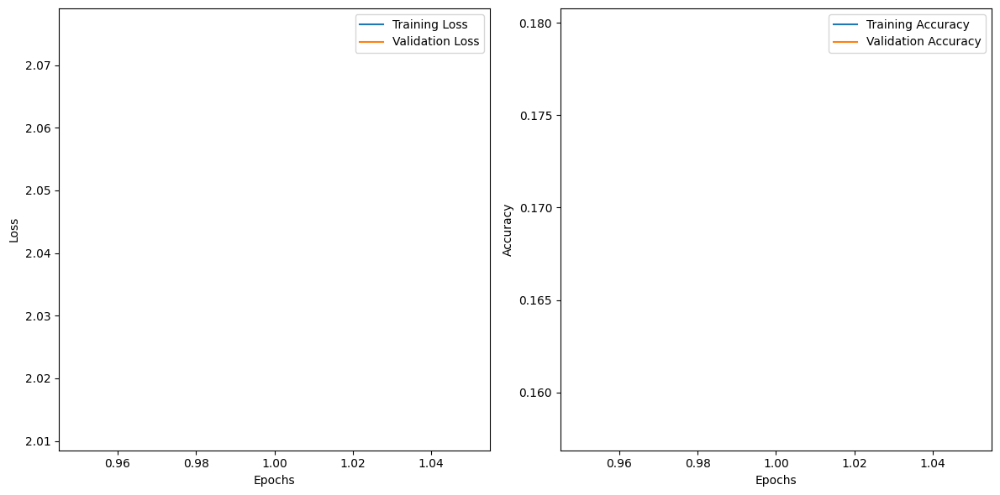

49/49 [==============================] - 7s 108ms/step - loss: 2.0759 - accuracy: 0.1580 - val_loss: 2.0117 - val_accuracy: 0.1797
Epoch 2/10
49/49 [==============================] - ETA: 0s - loss: 1.9694 - accuracy: 0.2456

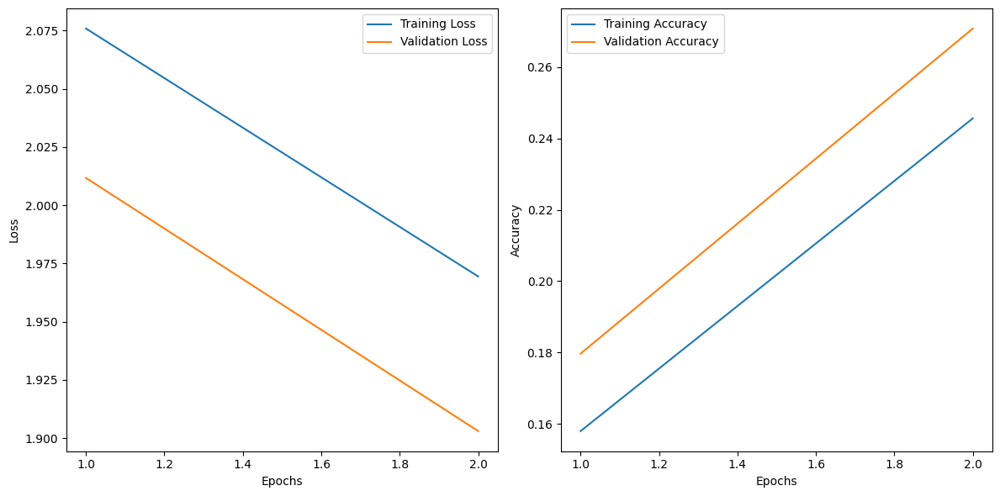

49/49 [==============================] - 5s 102ms/step - loss: 1.9694 - accuracy: 0.2456 - val_loss: 1.9030 - val_accuracy: 0.2708
Epoch 3/10
49/49 [==============================] - ETA: 0s - loss: 1.8408 - accuracy: 0.3069

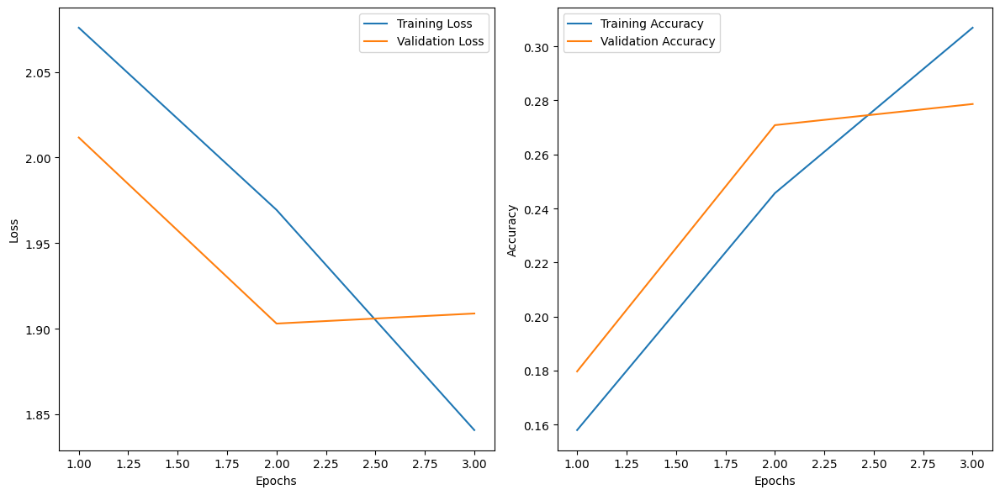

49/49 [==============================] - 5s 99ms/step - loss: 1.8408 - accuracy: 0.3069 - val_loss: 1.9089 - val_accuracy: 0.2786
Epoch 4/10
49/49 [==============================] - ETA: 0s - loss: 1.7638 - accuracy: 0.3320

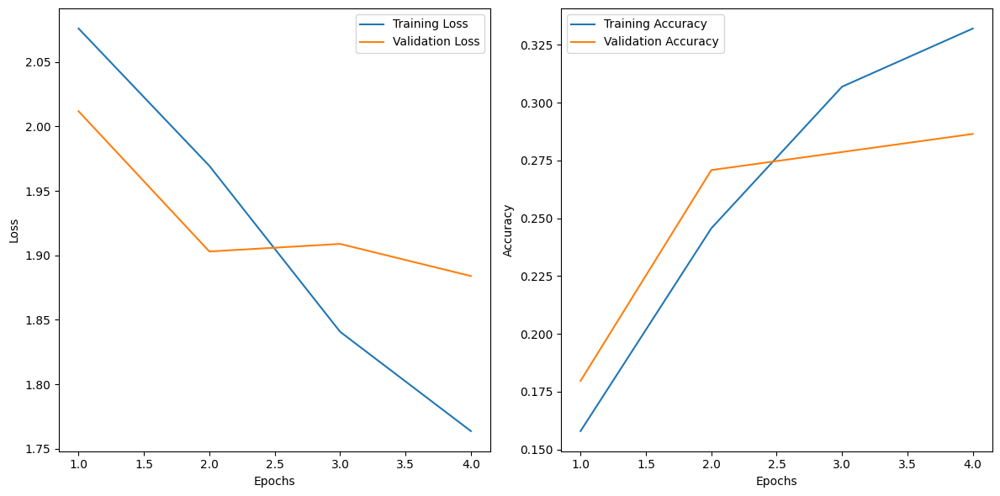

49/49 [==============================] - 5s 101ms/step - loss: 1.7638 - accuracy: 0.3320 - val_loss: 1.8840 - val_accuracy: 0.2865
Epoch 5/10
49/49 [==============================] - ETA: 0s - loss: 1.6451 - accuracy: 0.4049

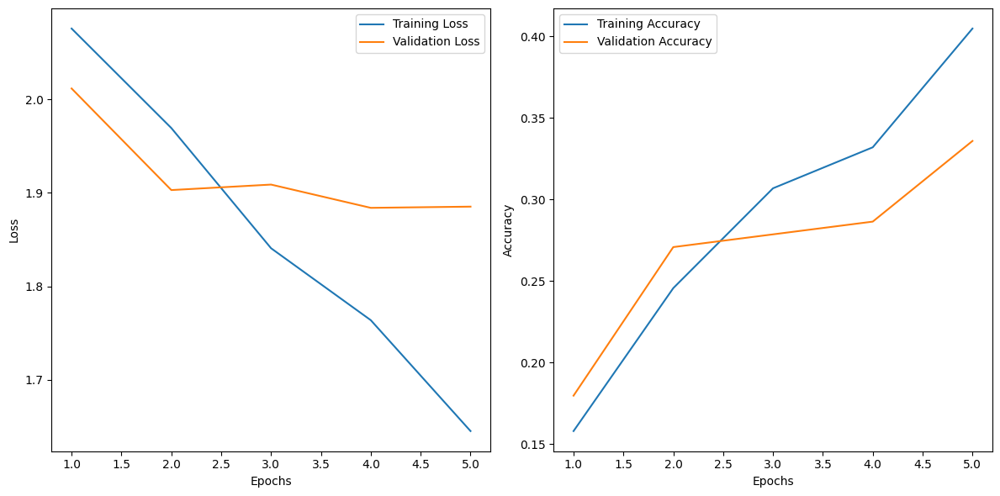

49/49 [==============================] - 5s 101ms/step - loss: 1.6451 - accuracy: 0.4049 - val_loss: 1.8853 - val_accuracy: 0.3359
Epoch 6/10
49/49 [==============================] - ETA: 0s - loss: 1.5044 - accuracy: 0.4687

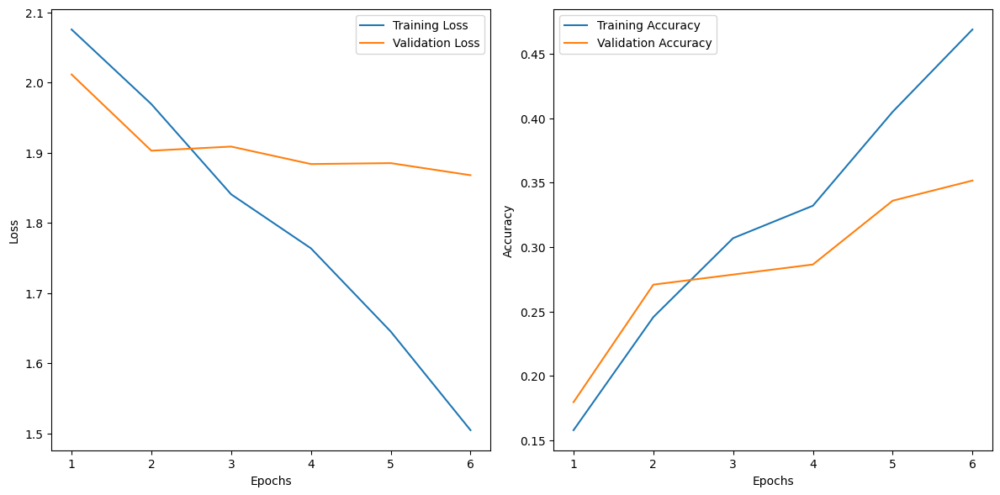

49/49 [==============================] - 5s 100ms/step - loss: 1.5044 - accuracy: 0.4687 - val_loss: 1.8680 - val_accuracy: 0.3516
Epoch 7/10
49/49 [==============================] - ETA: 0s - loss: 1.3628 - accuracy: 0.5068

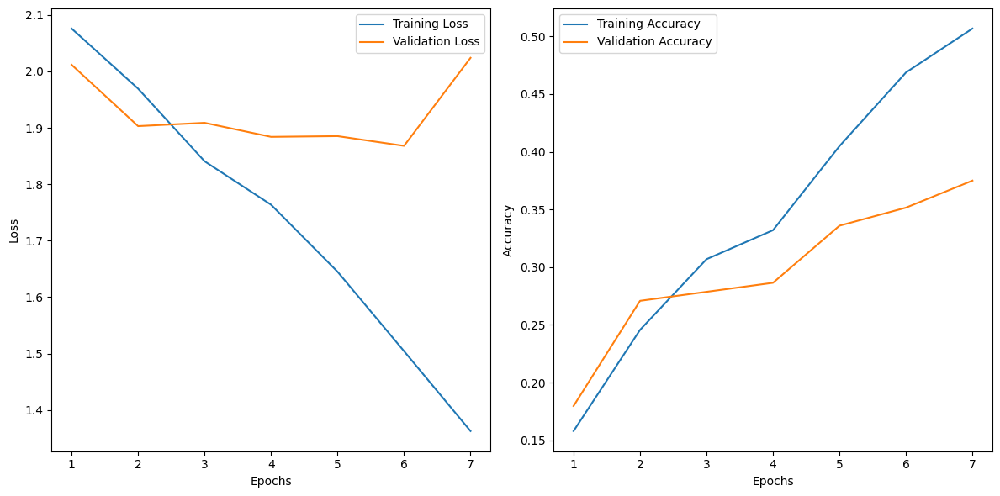

49/49 [==============================] - 5s 101ms/step - loss: 1.3628 - accuracy: 0.5068 - val_loss: 2.0240 - val_accuracy: 0.3750
Epoch 8/10
49/49 [==============================] - ETA: 0s - loss: 1.1646 - accuracy: 0.5983

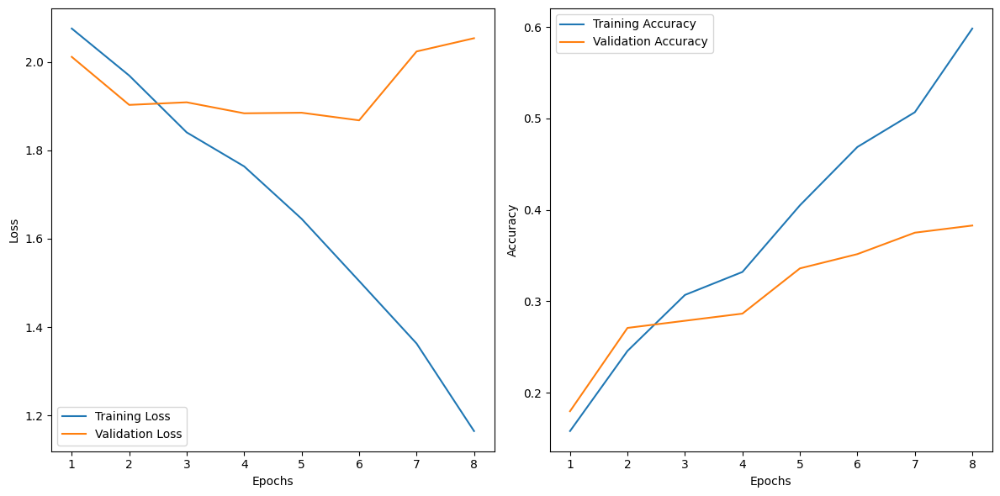

49/49 [==============================] - 5s 102ms/step - loss: 1.1646 - accuracy: 0.5983 - val_loss: 2.0539 - val_accuracy: 0.3828
Epoch 9/10
49/49 [==============================] - ETA: 0s - loss: 1.0228 - accuracy: 0.6293

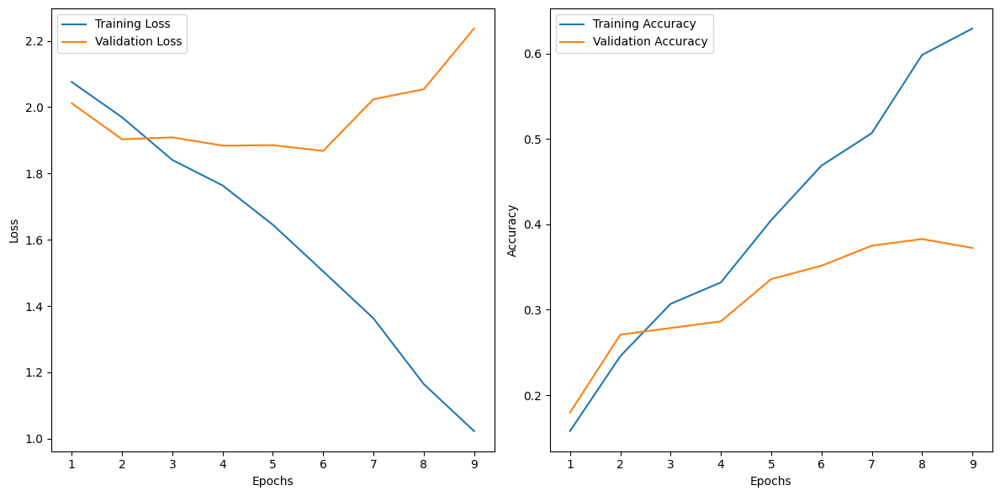

49/49 [==============================] - 5s 101ms/step - loss: 1.0228 - accuracy: 0.6293 - val_loss: 2.2371 - val_accuracy: 0.3724
Epoch 10/10
49/49 [==============================] - ETA: 0s - loss: 0.8645 - accuracy: 0.6899

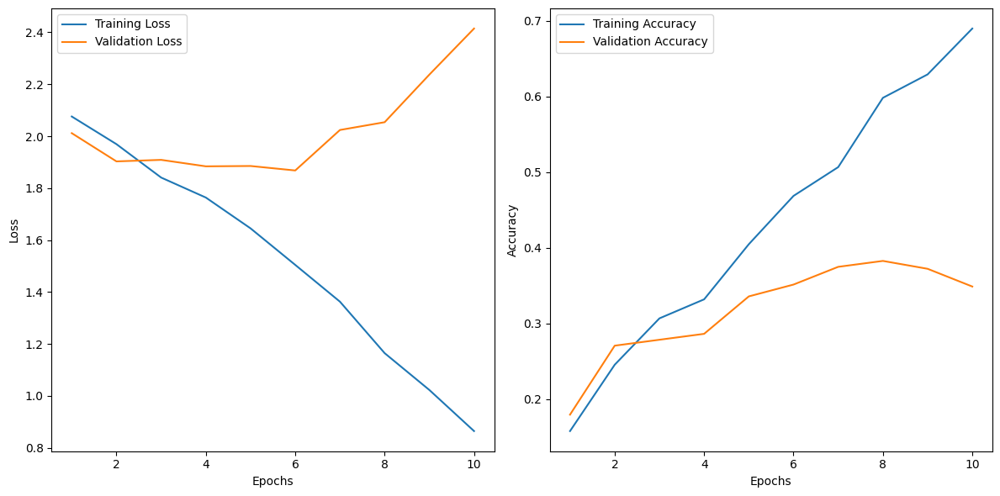

49/49 [==============================] - 5s 102ms/step - loss: 0.8645 - accuracy: 0.6899 - val_loss: 2.4146 - val_accuracy: 0.3490


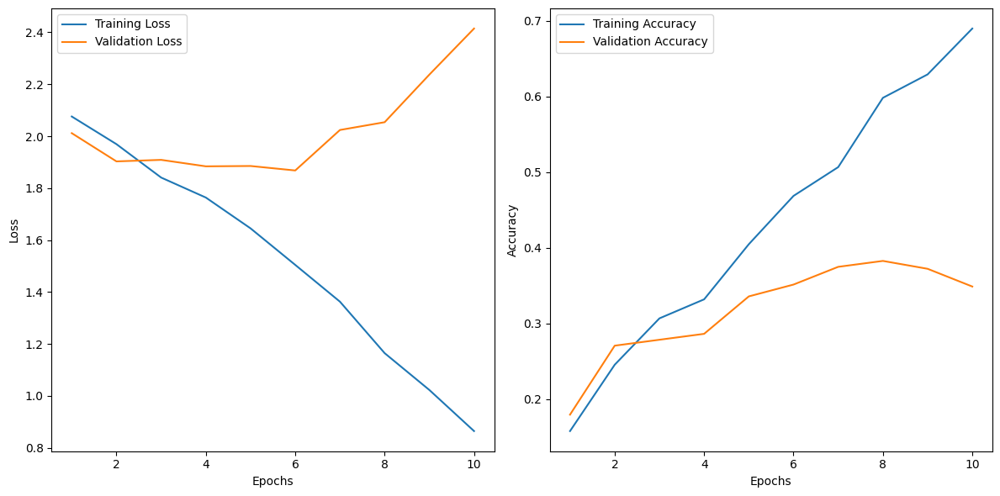

In [7]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define input shape
input_shape = (120, 120, 3)

# Create the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='softmax')  # Assuming 200 classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/train',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'D:/Skin Disease/test',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

# Define callbacks for plotting graphs
class PlotLossAccuracy(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.accs = []
        self.val_losses = []
        self.val_accs = []

    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))
        self.accs.append(logs.get('accuracy'))
        self.val_losses.append(logs.get('val_loss'))
        self.val_accs.append(logs.get('val_accuracy'))

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, len(self.losses) + 1), self.losses, label='Training Loss')
        plt.plot(range(1, len(self.val_losses) + 1), self.val_losses, label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(range(1, len(self.accs) + 1), self.accs, label='Training Accuracy')
        plt.plot(range(1, len(self.val_accs) + 1), self.val_accs, label='Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // 32,
    epochs=10,
    validation_data=test_generator,
    validation_steps=test_generator.samples // 32,
    callbacks=[PlotLossAccuracy()]
)

# Plot the final graphs
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(history.history['loss']) + 1), history.history['loss'], label='Training Loss')
plt.plot(range(1, len(history.history['val_loss']) + 1), history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], label='Training Accuracy')
plt.plot(range(1, len(history.history['val_accuracy']) + 1), history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.7491 - accuracy: 0.7460

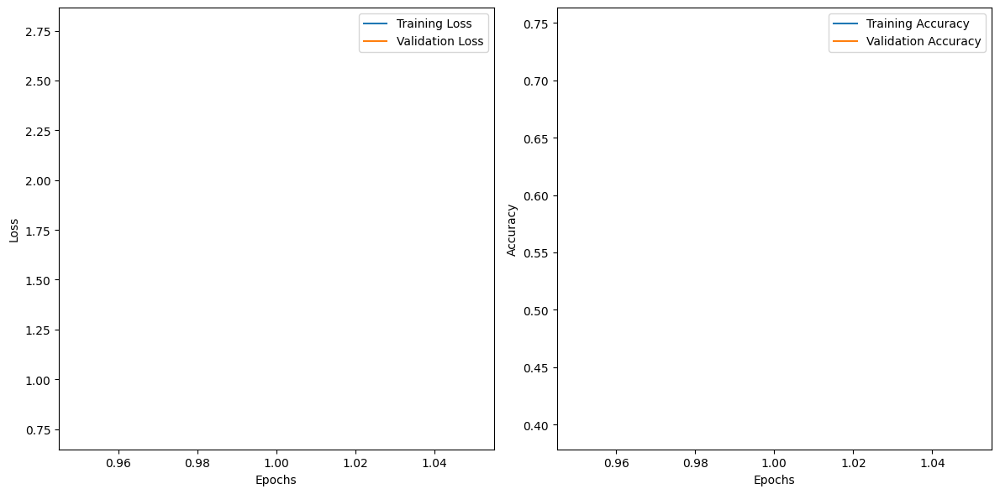

49/49 [==============================] - 5s 102ms/step - loss: 0.7491 - accuracy: 0.7460 - val_loss: 2.7653 - val_accuracy: 0.3958
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 0.6234 - accuracy: 0.7911

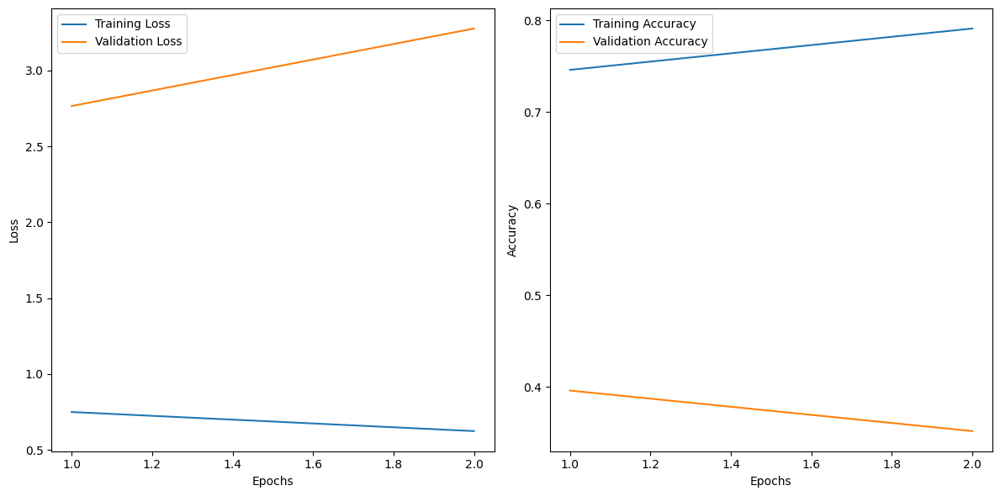

49/49 [==============================] - 5s 104ms/step - loss: 0.6234 - accuracy: 0.7911 - val_loss: 3.2759 - val_accuracy: 0.3516
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 0.5234 - accuracy: 0.8182

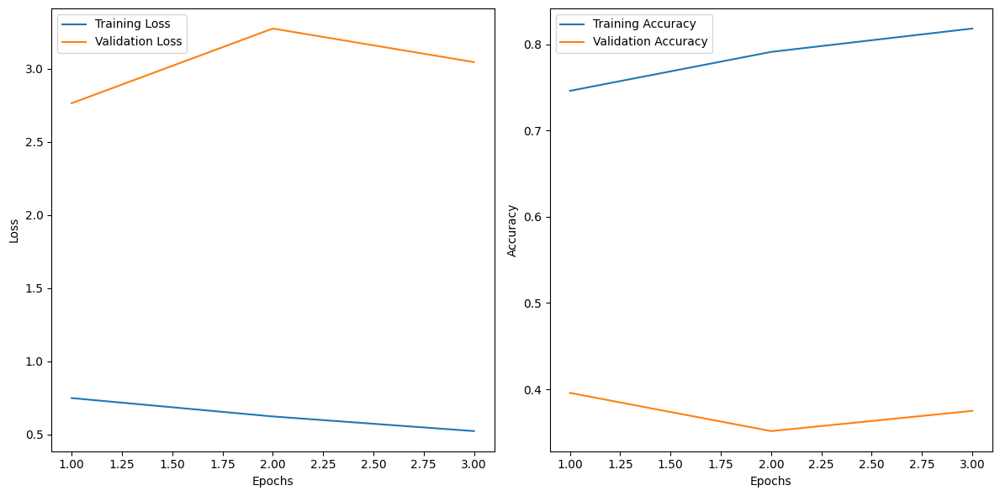

49/49 [==============================] - 5s 96ms/step - loss: 0.5234 - accuracy: 0.8182 - val_loss: 3.0464 - val_accuracy: 0.3750
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 0.4473 - accuracy: 0.8498

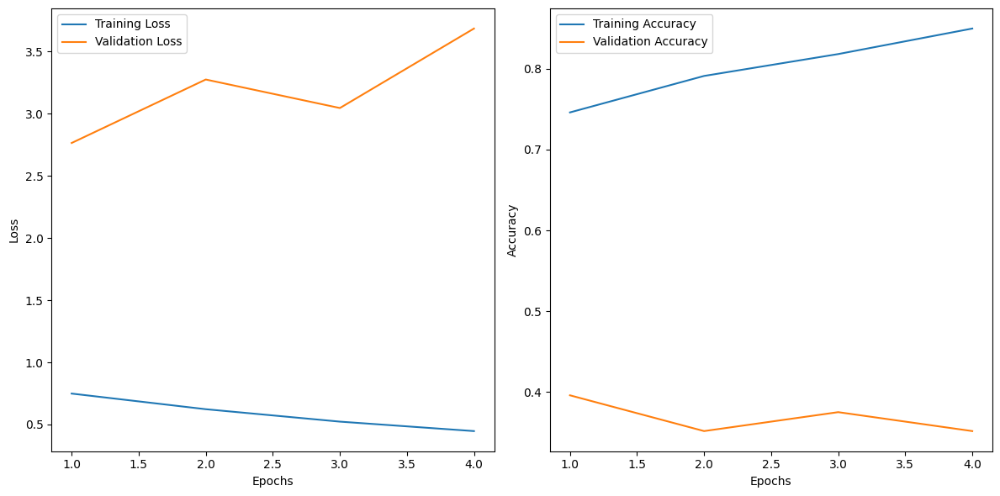

49/49 [==============================] - 5s 97ms/step - loss: 0.4473 - accuracy: 0.8498 - val_loss: 3.6860 - val_accuracy: 0.3516
Epoch 5/50
49/49 [==============================] - ETA: 0s - loss: 0.4075 - accuracy: 0.8685

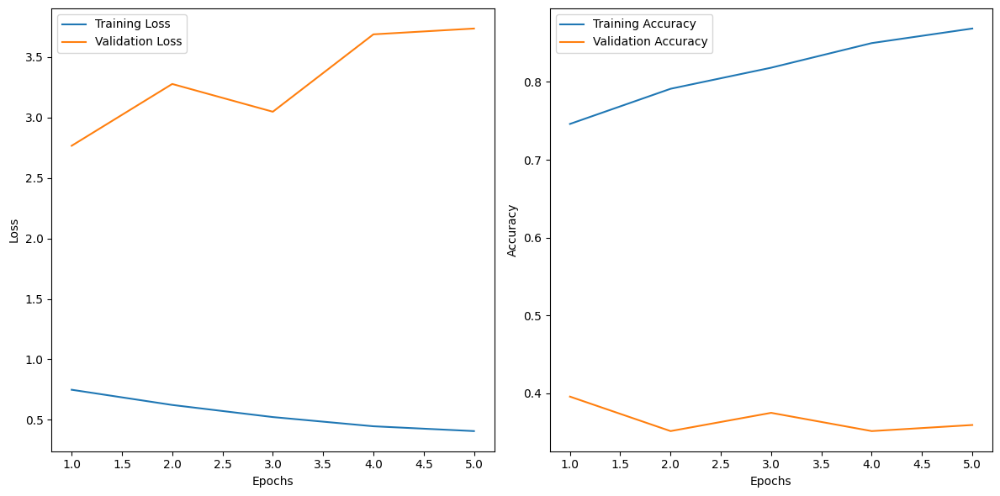

49/49 [==============================] - 5s 101ms/step - loss: 0.4075 - accuracy: 0.8685 - val_loss: 3.7340 - val_accuracy: 0.3594
Epoch 6/50
49/49 [==============================] - ETA: 0s - loss: 0.3454 - accuracy: 0.9001

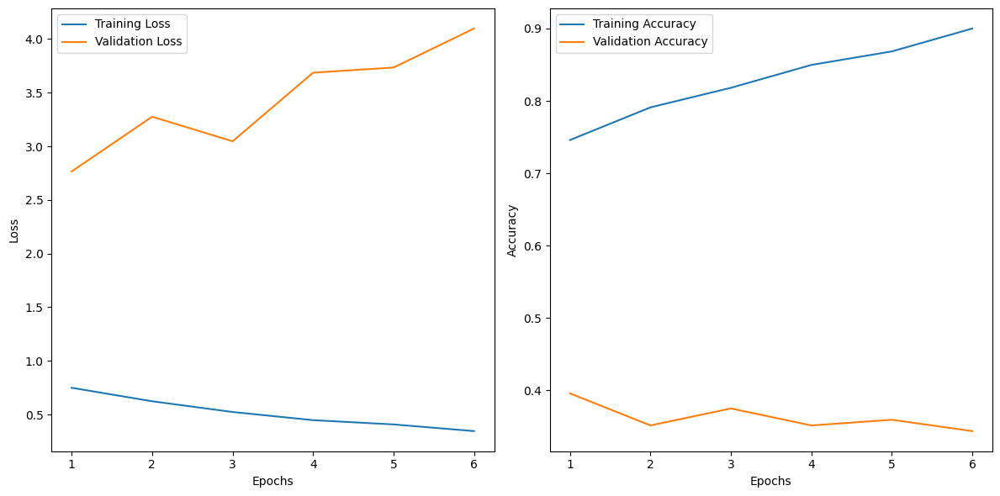

49/49 [==============================] - 5s 95ms/step - loss: 0.3454 - accuracy: 0.9001 - val_loss: 4.0975 - val_accuracy: 0.3438
Epoch 7/50
49/49 [==============================] - ETA: 0s - loss: 0.2585 - accuracy: 0.9252

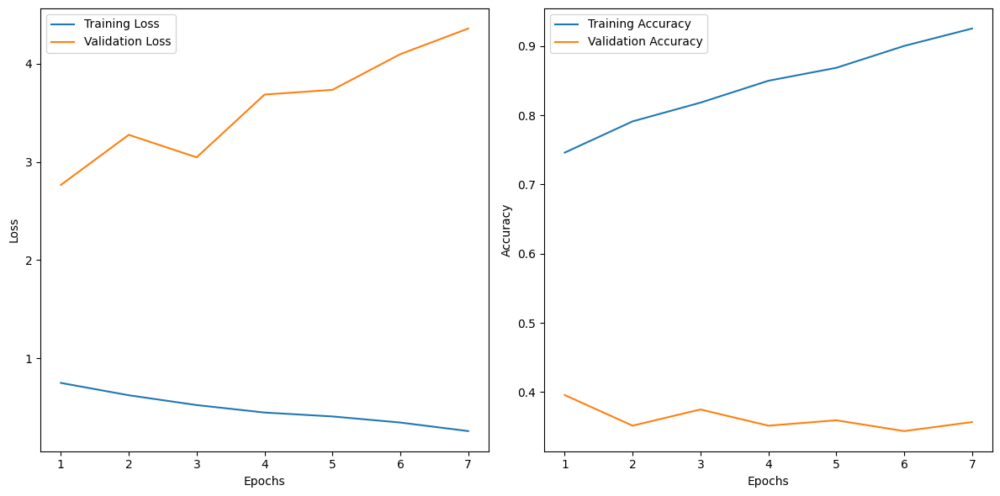

49/49 [==============================] - 5s 96ms/step - loss: 0.2585 - accuracy: 0.9252 - val_loss: 4.3582 - val_accuracy: 0.3568
Epoch 8/50
49/49 [==============================] - ETA: 0s - loss: 0.2280 - accuracy: 0.9291

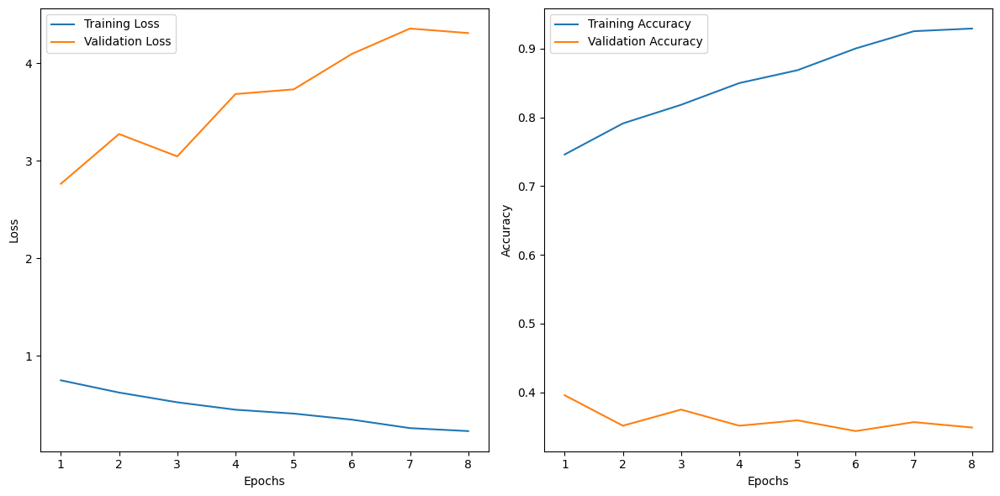

49/49 [==============================] - 5s 105ms/step - loss: 0.2280 - accuracy: 0.9291 - val_loss: 4.3118 - val_accuracy: 0.3490
Epoch 9/50
49/49 [==============================] - ETA: 0s - loss: 0.2331 - accuracy: 0.9291

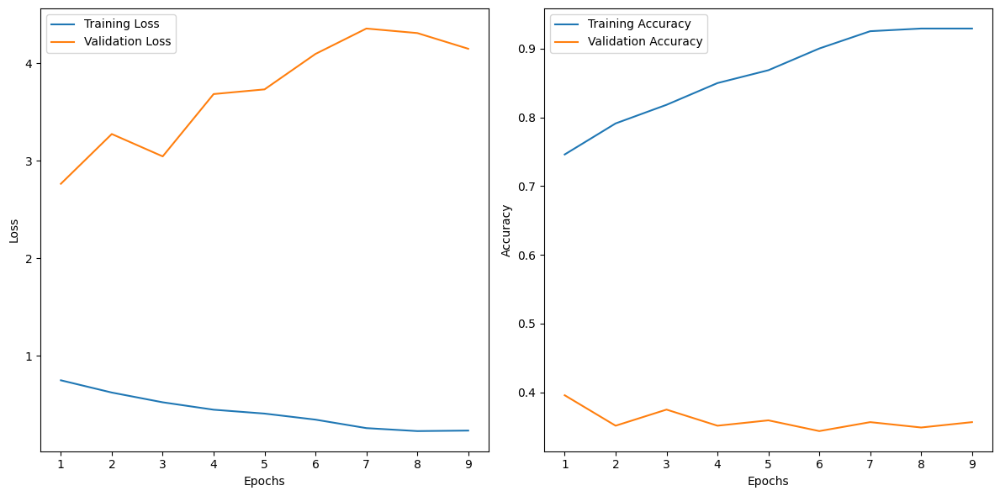

49/49 [==============================] - 5s 110ms/step - loss: 0.2331 - accuracy: 0.9291 - val_loss: 4.1508 - val_accuracy: 0.3568
Epoch 10/50
49/49 [==============================] - ETA: 0s - loss: 0.2120 - accuracy: 0.9362

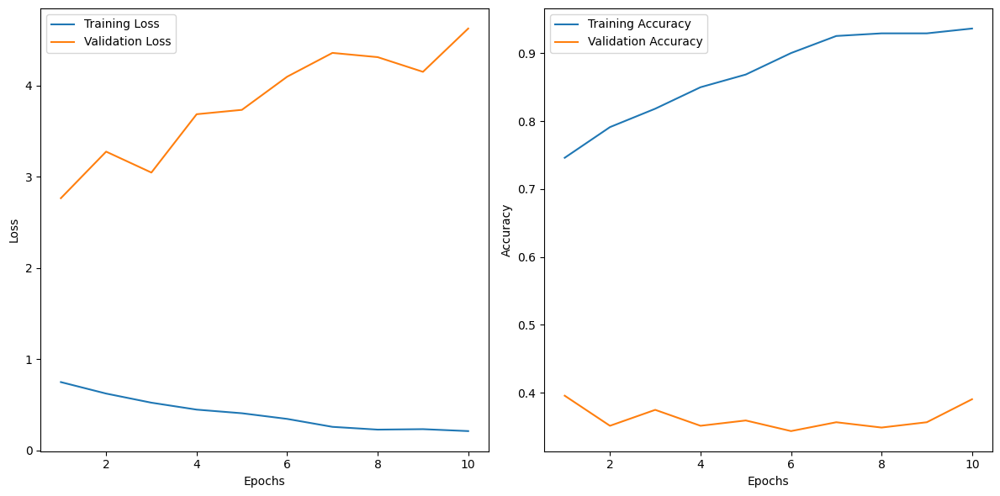

49/49 [==============================] - 5s 99ms/step - loss: 0.2120 - accuracy: 0.9362 - val_loss: 4.6254 - val_accuracy: 0.3906
Epoch 11/50
49/49 [==============================] - ETA: 0s - loss: 0.1365 - accuracy: 0.9630

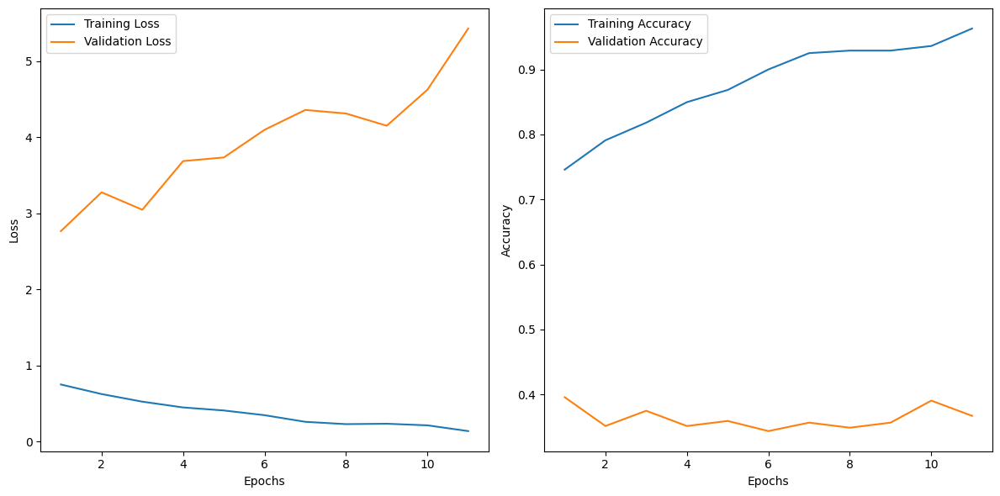

49/49 [==============================] - 5s 102ms/step - loss: 0.1365 - accuracy: 0.9630 - val_loss: 5.4288 - val_accuracy: 0.3672
Epoch 12/50
49/49 [==============================] - ETA: 0s - loss: 0.1418 - accuracy: 0.9581

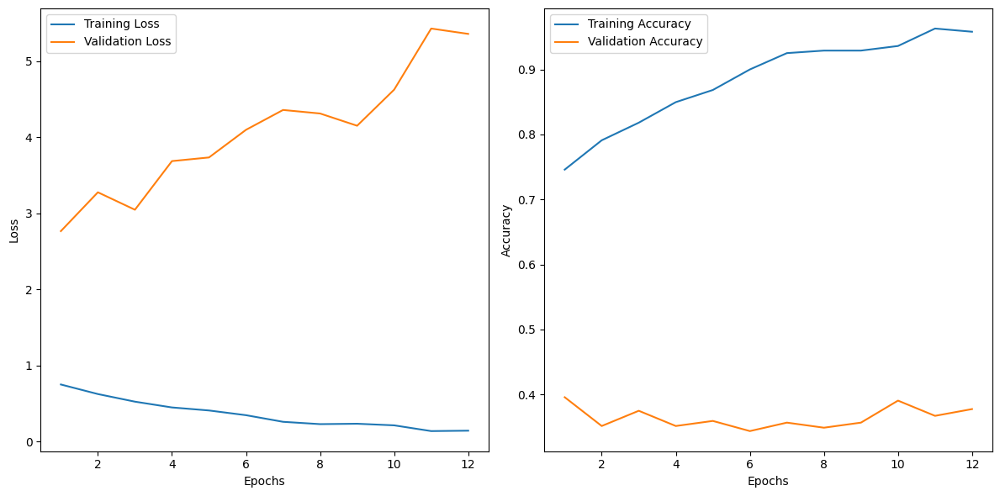

49/49 [==============================] - 5s 99ms/step - loss: 0.1418 - accuracy: 0.9581 - val_loss: 5.3584 - val_accuracy: 0.3776
Epoch 13/50
49/49 [==============================] - ETA: 0s - loss: 0.1251 - accuracy: 0.9613

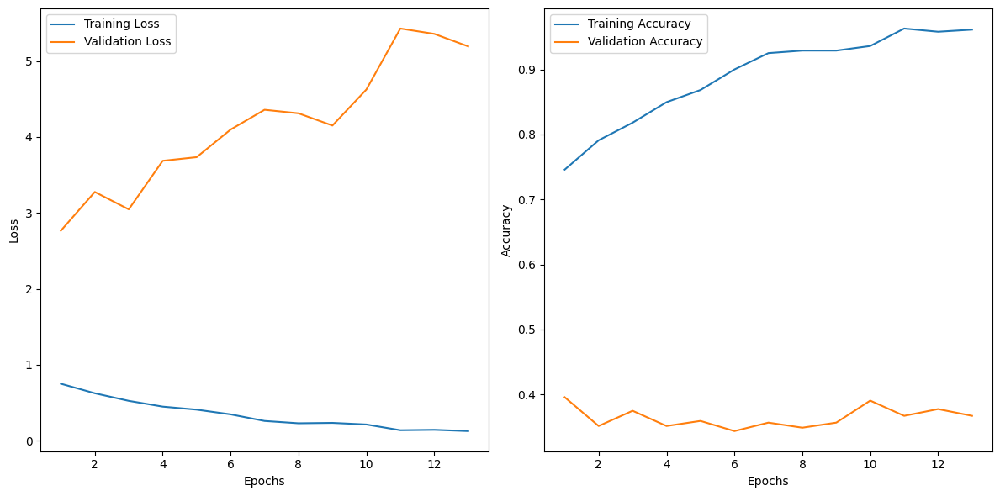

49/49 [==============================] - 5s 102ms/step - loss: 0.1251 - accuracy: 0.9613 - val_loss: 5.1937 - val_accuracy: 0.3672
Epoch 14/50
49/49 [==============================] - ETA: 0s - loss: 0.1351 - accuracy: 0.9594

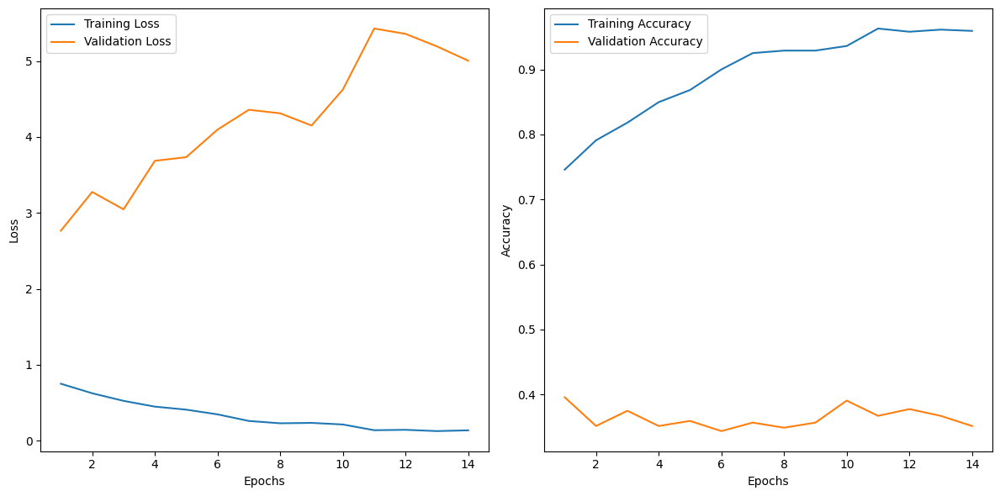

49/49 [==============================] - 5s 105ms/step - loss: 0.1351 - accuracy: 0.9594 - val_loss: 5.0052 - val_accuracy: 0.3516
Epoch 15/50
49/49 [==============================] - ETA: 0s - loss: 0.1674 - accuracy: 0.9536

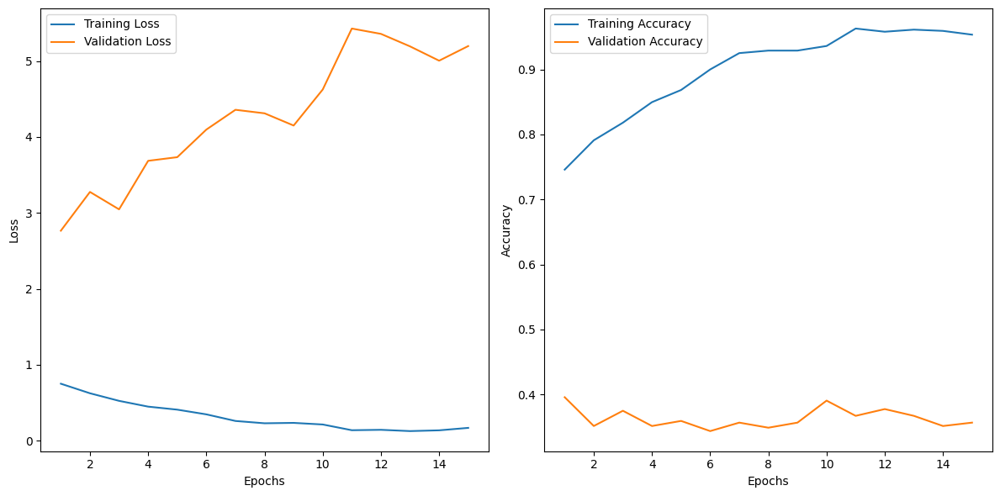

49/49 [==============================] - 5s 96ms/step - loss: 0.1674 - accuracy: 0.9536 - val_loss: 5.1977 - val_accuracy: 0.3568
Epoch 16/50
49/49 [==============================] - ETA: 0s - loss: 0.1089 - accuracy: 0.9736

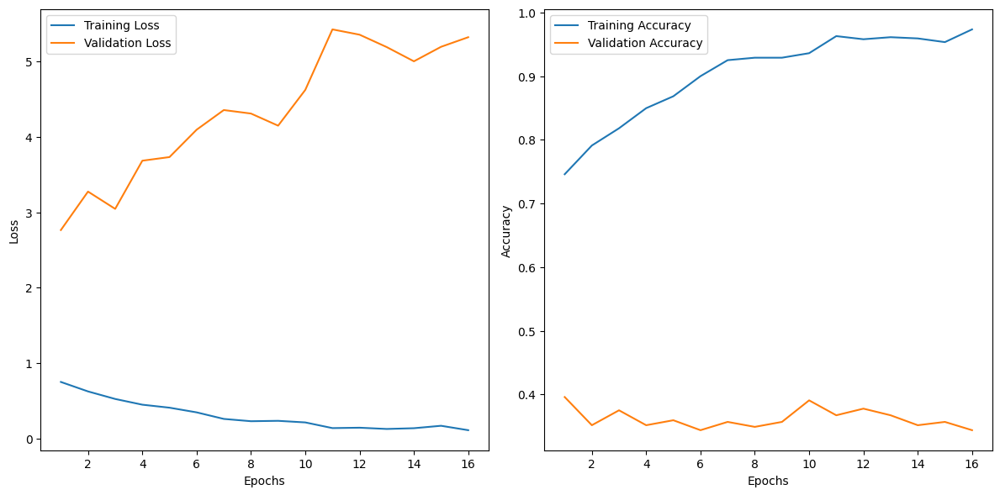

49/49 [==============================] - 5s 105ms/step - loss: 0.1089 - accuracy: 0.9736 - val_loss: 5.3250 - val_accuracy: 0.3438
Epoch 17/50
49/49 [==============================] - ETA: 0s - loss: 0.0844 - accuracy: 0.9742

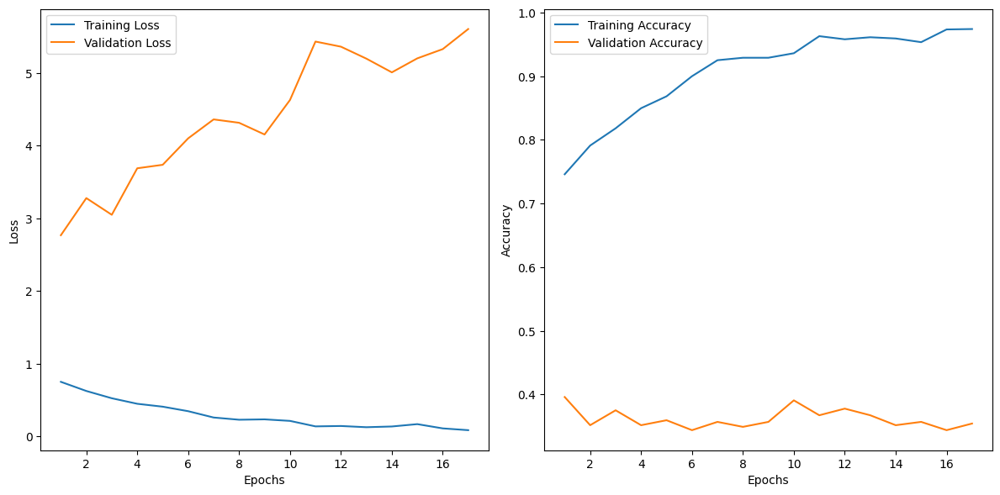

49/49 [==============================] - 5s 98ms/step - loss: 0.0844 - accuracy: 0.9742 - val_loss: 5.6010 - val_accuracy: 0.3542
Epoch 18/50
49/49 [==============================] - ETA: 0s - loss: 0.0985 - accuracy: 0.9710

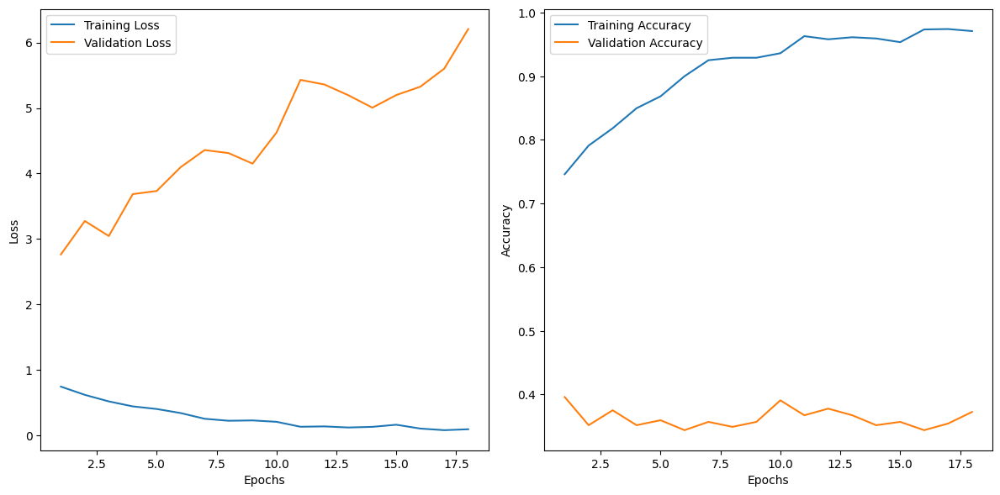

49/49 [==============================] - 5s 94ms/step - loss: 0.0985 - accuracy: 0.9710 - val_loss: 6.2047 - val_accuracy: 0.3724
Epoch 19/50
49/49 [==============================] - ETA: 0s - loss: 0.1264 - accuracy: 0.9691

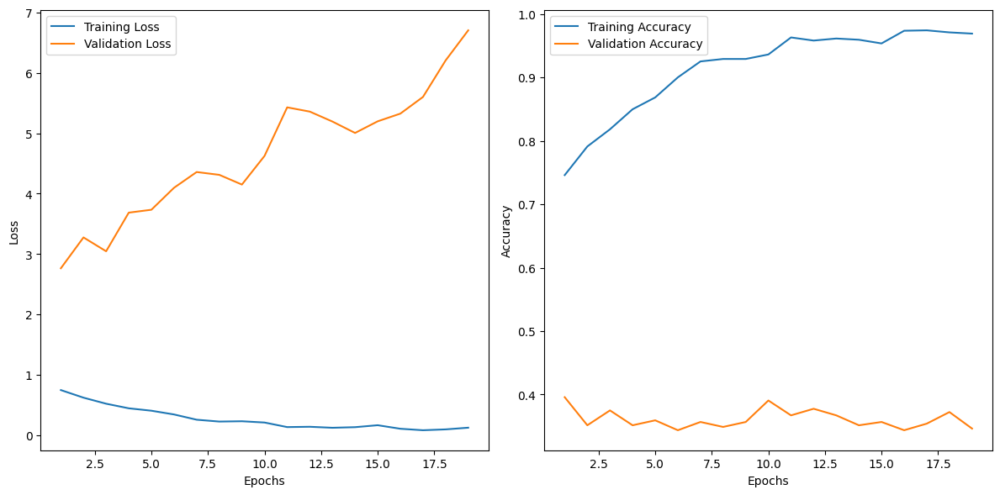

49/49 [==============================] - 5s 96ms/step - loss: 0.1264 - accuracy: 0.9691 - val_loss: 6.7036 - val_accuracy: 0.3464
Epoch 20/50
49/49 [==============================] - ETA: 0s - loss: 0.1169 - accuracy: 0.9729

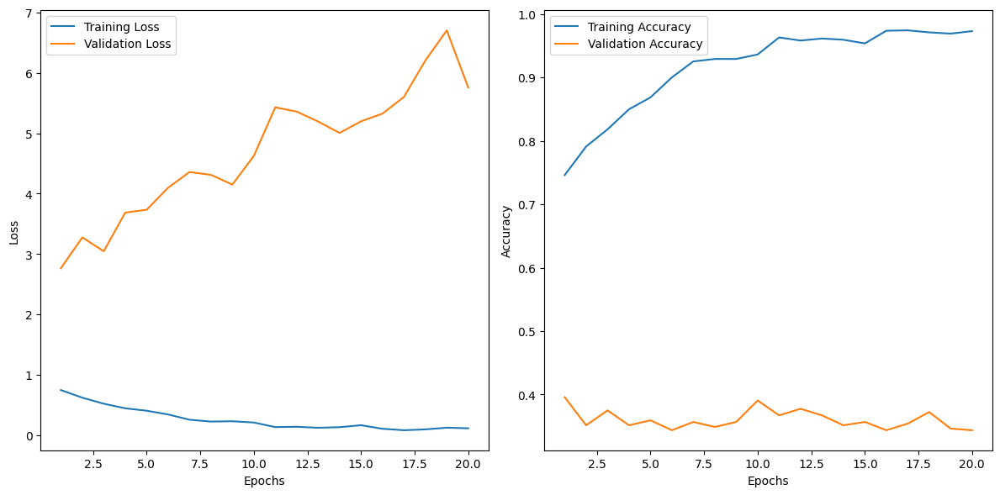

49/49 [==============================] - 5s 105ms/step - loss: 0.1169 - accuracy: 0.9729 - val_loss: 5.7581 - val_accuracy: 0.3438
Epoch 21/50
49/49 [==============================] - ETA: 0s - loss: 0.0665 - accuracy: 0.9807

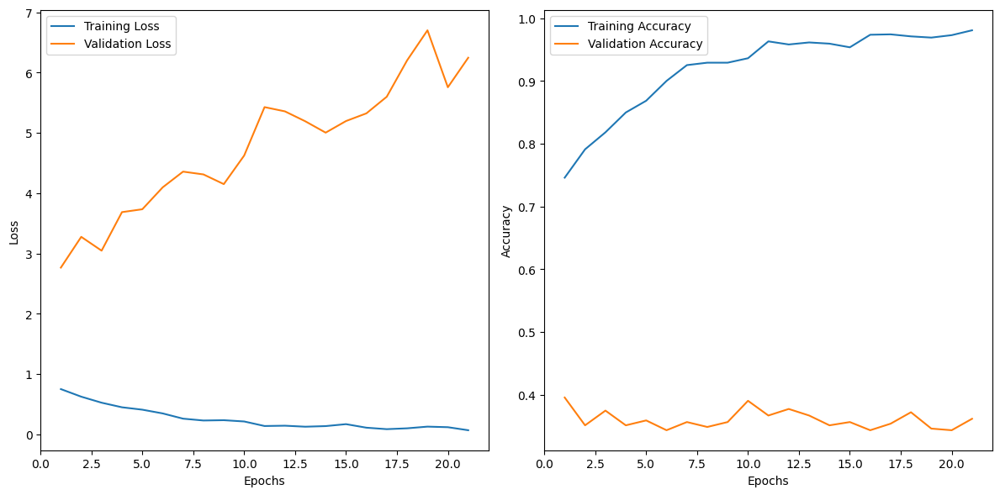

49/49 [==============================] - 5s 97ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 6.2484 - val_accuracy: 0.3620
Epoch 22/50
49/49 [==============================] - ETA: 0s - loss: 0.0699 - accuracy: 0.9832

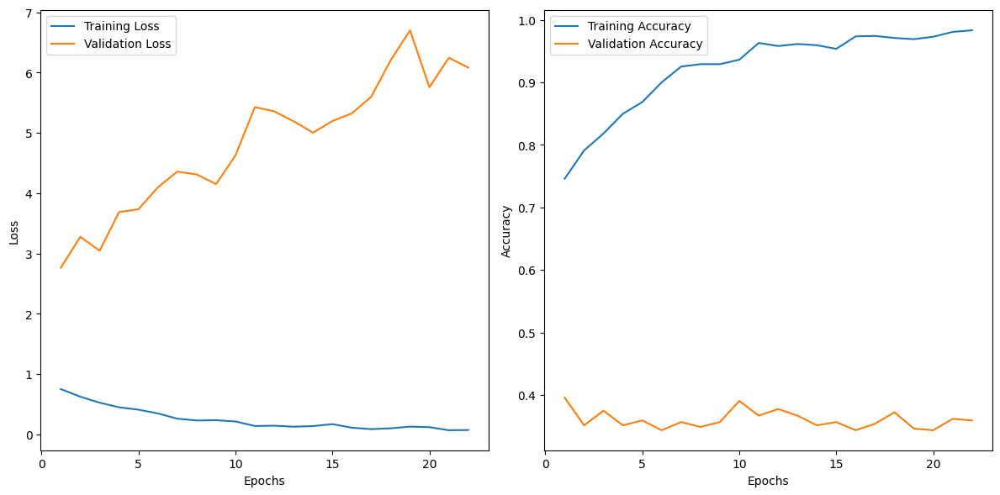

49/49 [==============================] - 5s 100ms/step - loss: 0.0699 - accuracy: 0.9832 - val_loss: 6.0850 - val_accuracy: 0.3594
Epoch 23/50
48/49 [============================>.] - ETA: 0s - loss: 0.0571 - accuracy: 0.9870

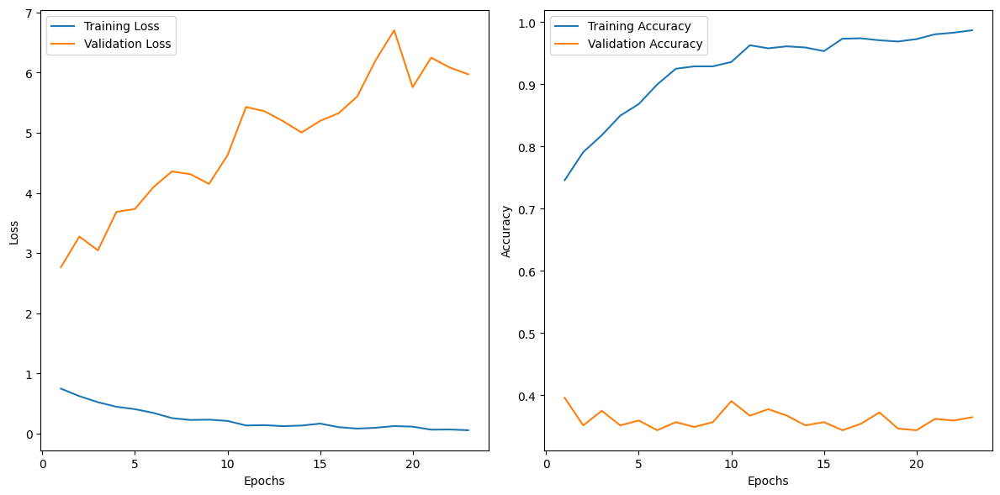

49/49 [==============================] - 6s 116ms/step - loss: 0.0574 - accuracy: 0.9871 - val_loss: 5.9726 - val_accuracy: 0.3646
Epoch 24/50
49/49 [==============================] - ETA: 0s - loss: 0.0394 - accuracy: 0.9929

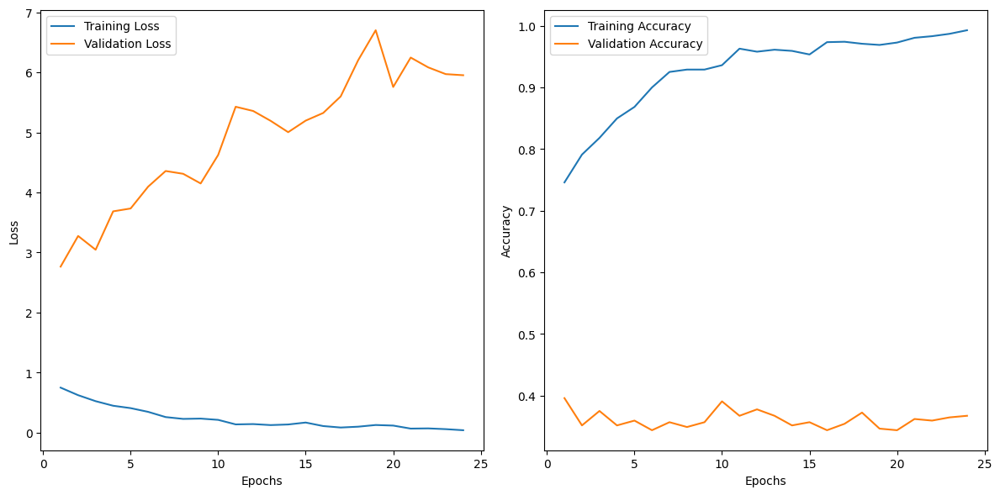

49/49 [==============================] - 6s 117ms/step - loss: 0.0394 - accuracy: 0.9929 - val_loss: 5.9541 - val_accuracy: 0.3672
Epoch 25/50
49/49 [==============================] - ETA: 0s - loss: 0.0372 - accuracy: 0.9884

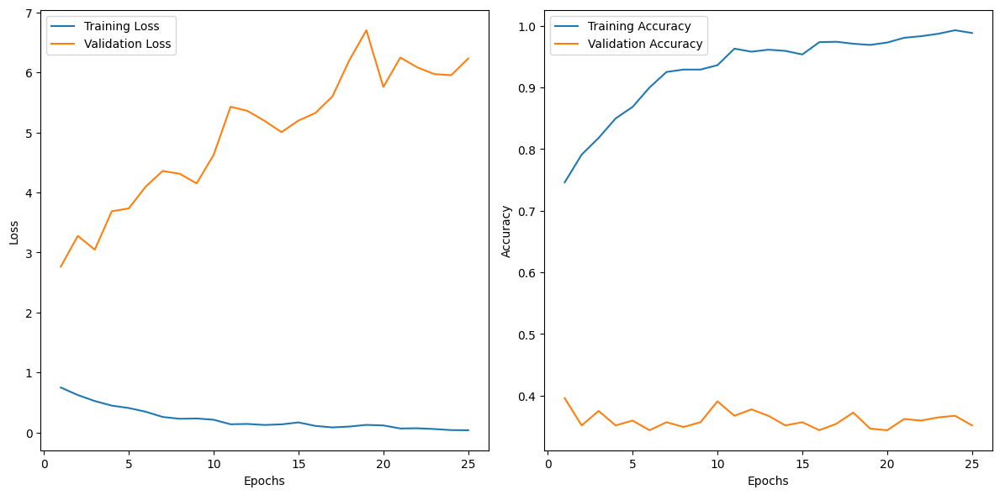

49/49 [==============================] - 5s 108ms/step - loss: 0.0372 - accuracy: 0.9884 - val_loss: 6.2324 - val_accuracy: 0.3516
Epoch 26/50
49/49 [==============================] - ETA: 0s - loss: 0.0326 - accuracy: 0.9916

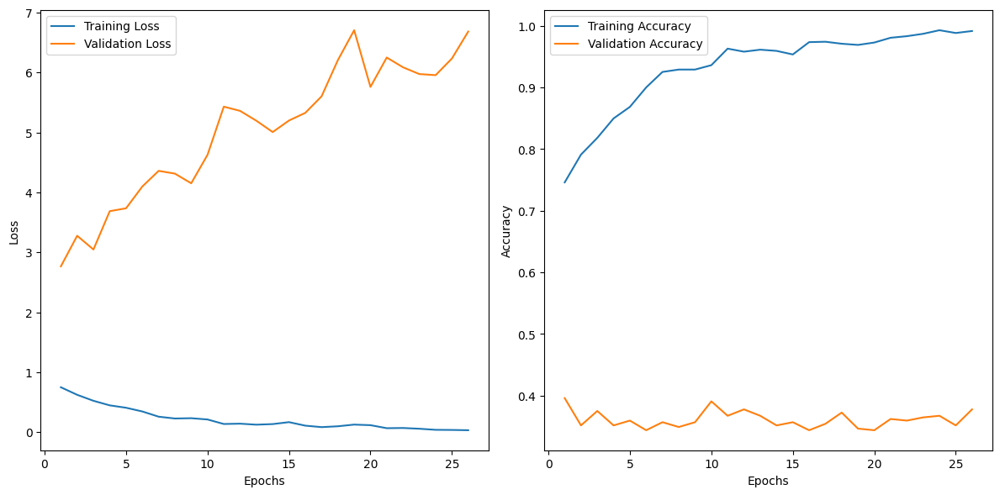

49/49 [==============================] - 5s 101ms/step - loss: 0.0326 - accuracy: 0.9916 - val_loss: 6.6813 - val_accuracy: 0.3776
Epoch 27/50
49/49 [==============================] - ETA: 0s - loss: 0.0298 - accuracy: 0.9916

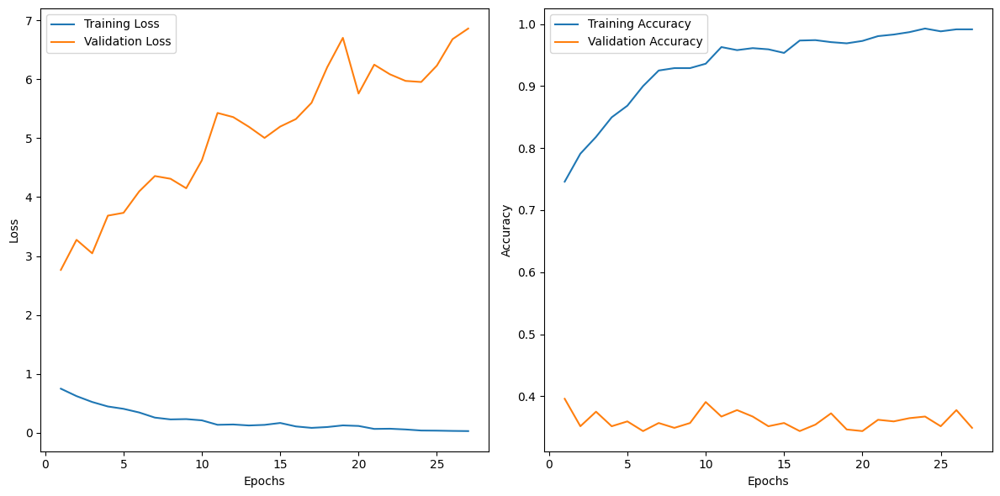

49/49 [==============================] - 5s 108ms/step - loss: 0.0298 - accuracy: 0.9916 - val_loss: 6.8614 - val_accuracy: 0.3490
Epoch 28/50
49/49 [==============================] - ETA: 0s - loss: 0.0594 - accuracy: 0.9845

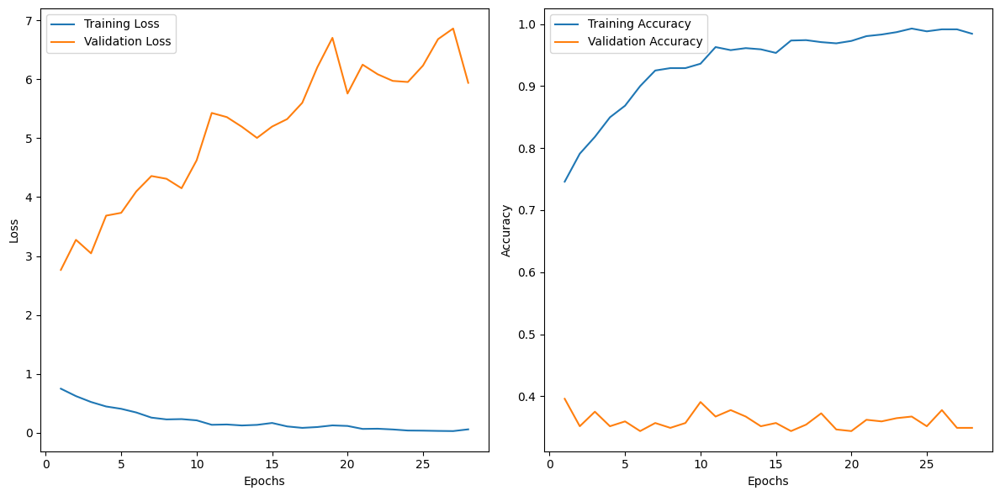

49/49 [==============================] - 5s 100ms/step - loss: 0.0594 - accuracy: 0.9845 - val_loss: 5.9399 - val_accuracy: 0.3490
Epoch 29/50
49/49 [==============================] - ETA: 0s - loss: 0.0501 - accuracy: 0.9884

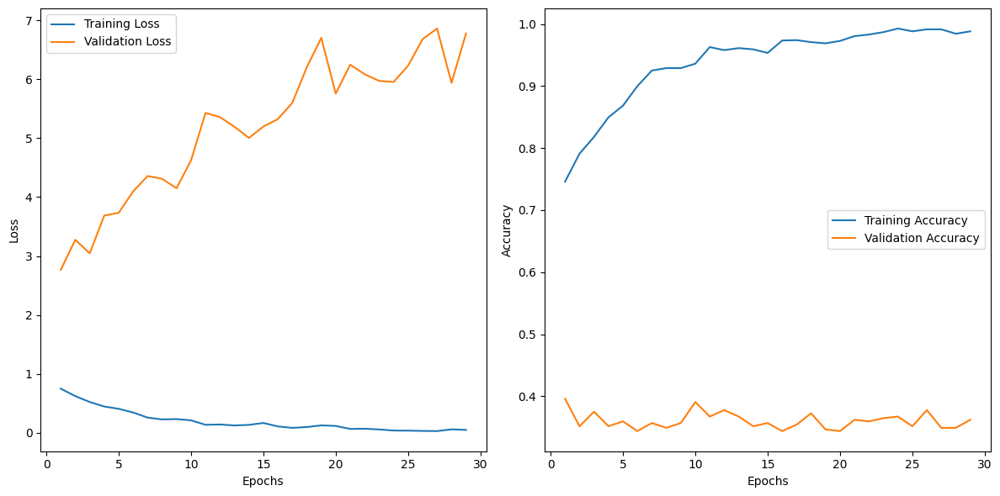

49/49 [==============================] - 5s 98ms/step - loss: 0.0501 - accuracy: 0.9884 - val_loss: 6.7776 - val_accuracy: 0.3620
Epoch 30/50
49/49 [==============================] - ETA: 0s - loss: 0.0418 - accuracy: 0.9890

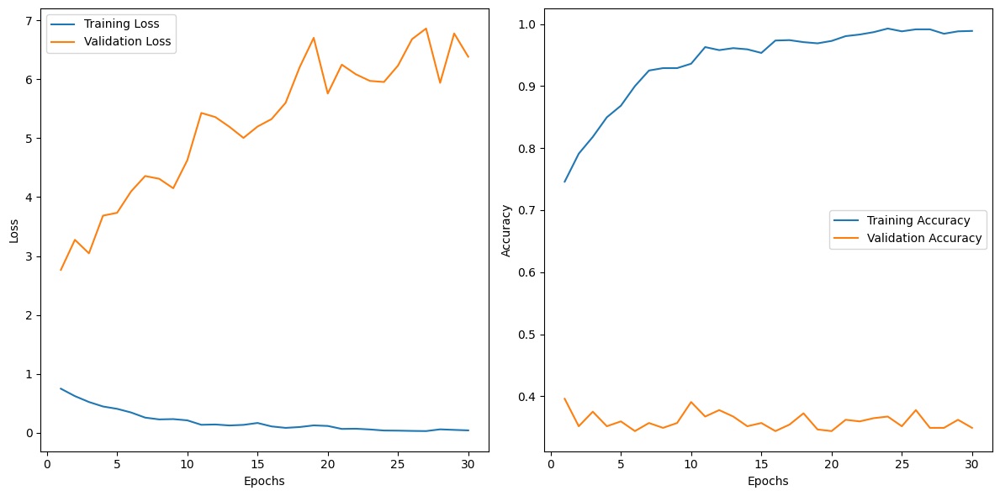

49/49 [==============================] - 5s 97ms/step - loss: 0.0418 - accuracy: 0.9890 - val_loss: 6.3830 - val_accuracy: 0.3490
Epoch 31/50
49/49 [==============================] - ETA: 0s - loss: 0.0324 - accuracy: 0.9884

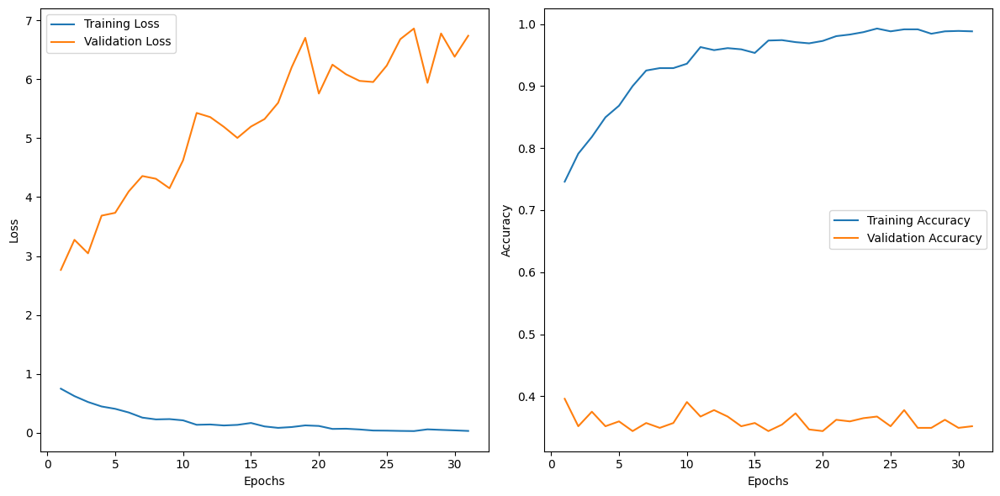

49/49 [==============================] - 5s 101ms/step - loss: 0.0324 - accuracy: 0.9884 - val_loss: 6.7388 - val_accuracy: 0.3516
Epoch 32/50
49/49 [==============================] - ETA: 0s - loss: 0.0299 - accuracy: 0.9955

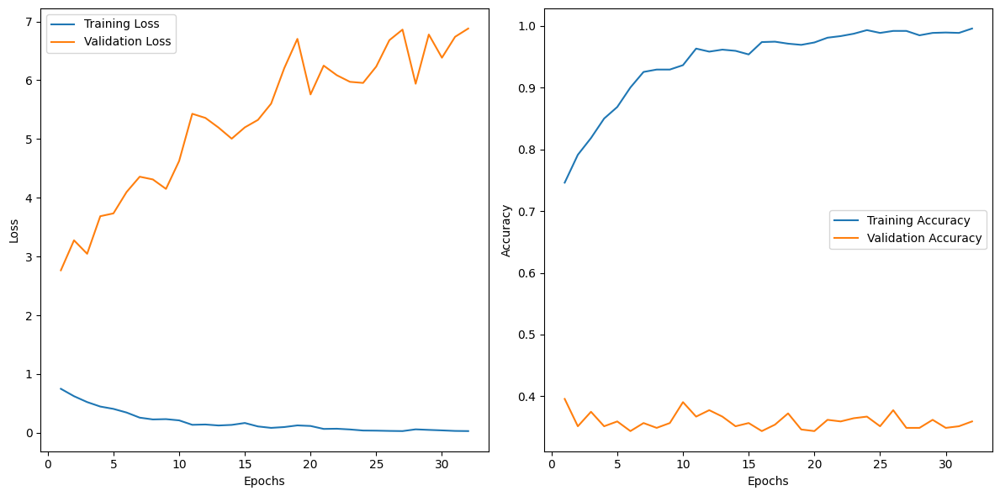

49/49 [==============================] - 5s 99ms/step - loss: 0.0299 - accuracy: 0.9955 - val_loss: 6.8794 - val_accuracy: 0.3594
Epoch 33/50
49/49 [==============================] - ETA: 0s - loss: 0.0760 - accuracy: 0.9813

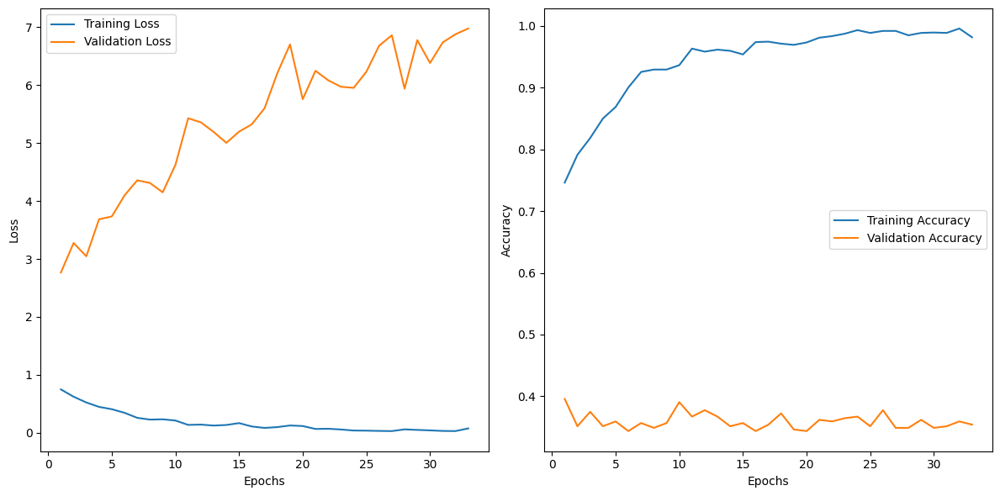

49/49 [==============================] - 5s 104ms/step - loss: 0.0760 - accuracy: 0.9813 - val_loss: 6.9778 - val_accuracy: 0.3542
Epoch 34/50
49/49 [==============================] - ETA: 0s - loss: 0.0711 - accuracy: 0.9845

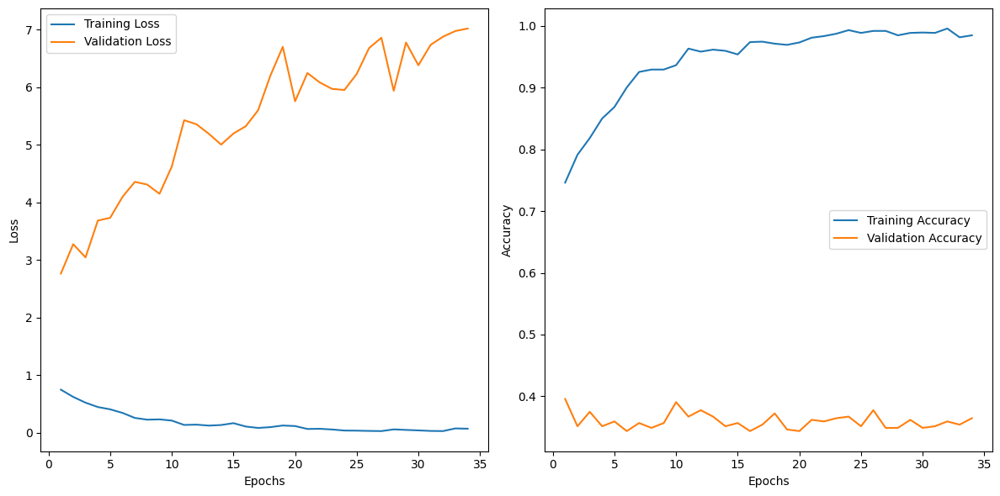

49/49 [==============================] - 5s 109ms/step - loss: 0.0711 - accuracy: 0.9845 - val_loss: 7.0210 - val_accuracy: 0.3646
Epoch 35/50
49/49 [==============================] - ETA: 0s - loss: 0.0647 - accuracy: 0.9839

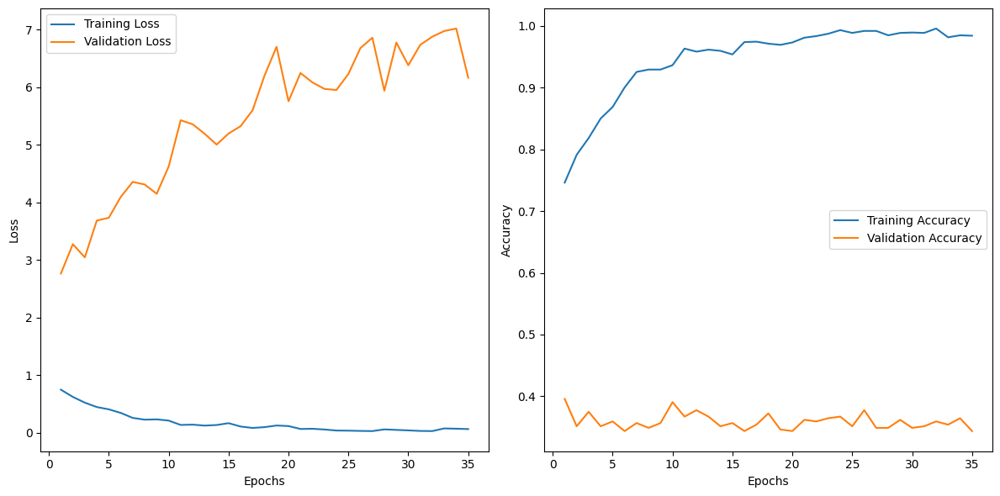

49/49 [==============================] - 5s 104ms/step - loss: 0.0647 - accuracy: 0.9839 - val_loss: 6.1660 - val_accuracy: 0.3438
Epoch 36/50
49/49 [==============================] - ETA: 0s - loss: 0.0545 - accuracy: 0.9839

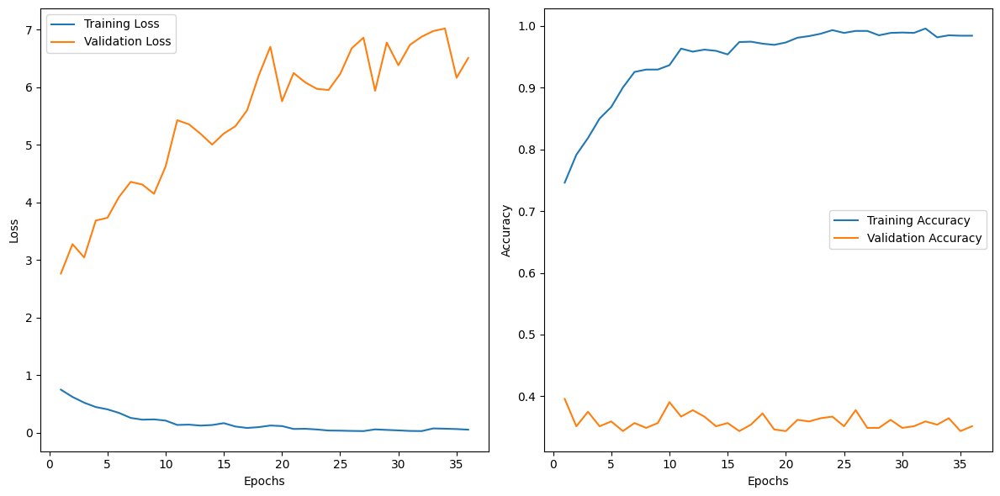

49/49 [==============================] - 5s 108ms/step - loss: 0.0545 - accuracy: 0.9839 - val_loss: 6.5098 - val_accuracy: 0.3516
Epoch 37/50
49/49 [==============================] - ETA: 0s - loss: 0.0537 - accuracy: 0.9890

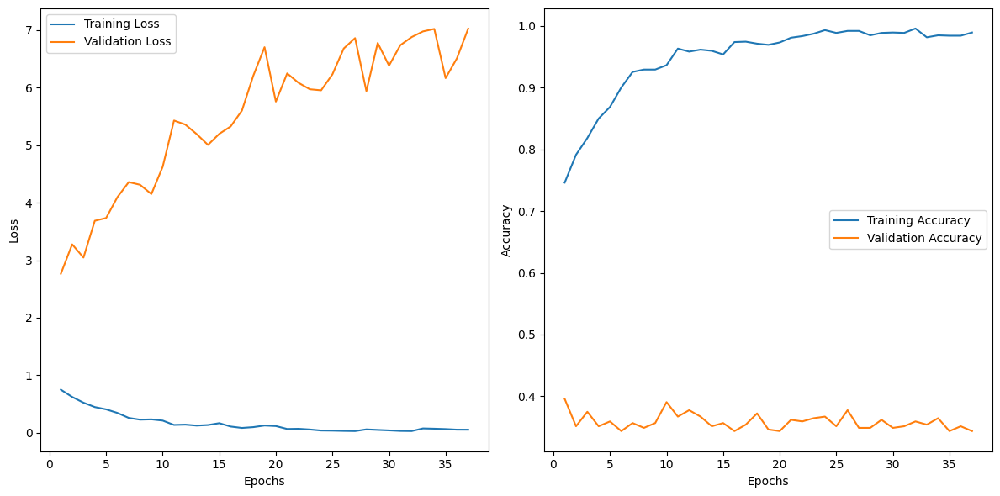

49/49 [==============================] - 5s 104ms/step - loss: 0.0537 - accuracy: 0.9890 - val_loss: 7.0281 - val_accuracy: 0.3438
Epoch 38/50
49/49 [==============================] - ETA: 0s - loss: 0.0433 - accuracy: 0.9923

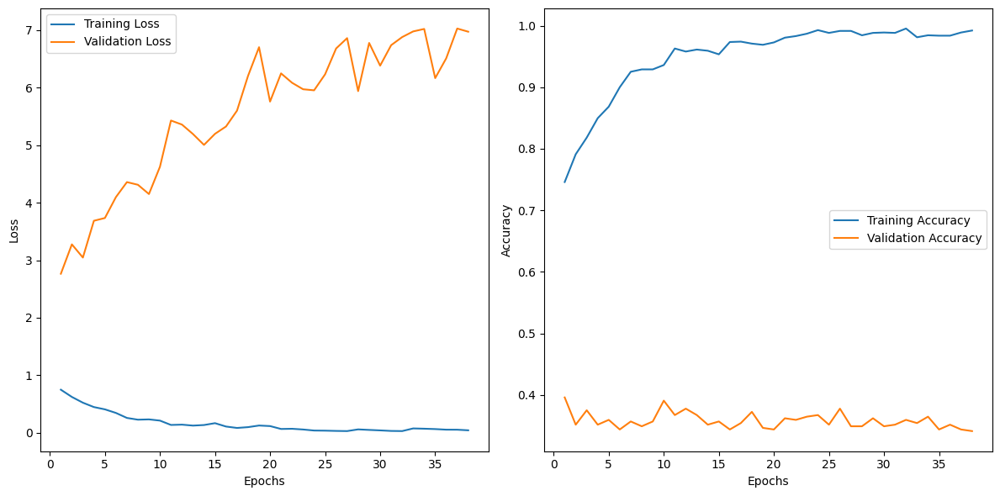

49/49 [==============================] - 5s 102ms/step - loss: 0.0433 - accuracy: 0.9923 - val_loss: 6.9730 - val_accuracy: 0.3411
Epoch 39/50
49/49 [==============================] - ETA: 0s - loss: 0.0192 - accuracy: 0.9929

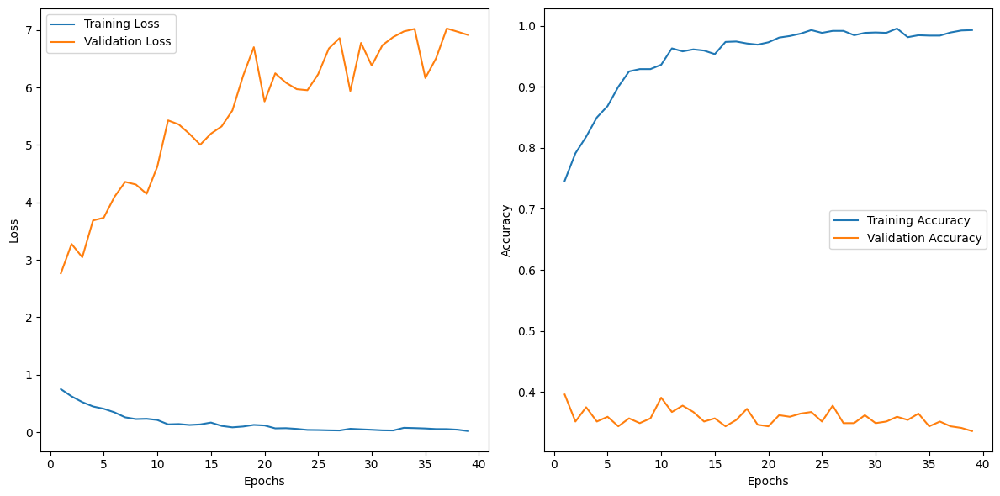

49/49 [==============================] - 5s 105ms/step - loss: 0.0192 - accuracy: 0.9929 - val_loss: 6.9147 - val_accuracy: 0.3359
Epoch 40/50
49/49 [==============================] - ETA: 0s - loss: 0.0222 - accuracy: 0.9948

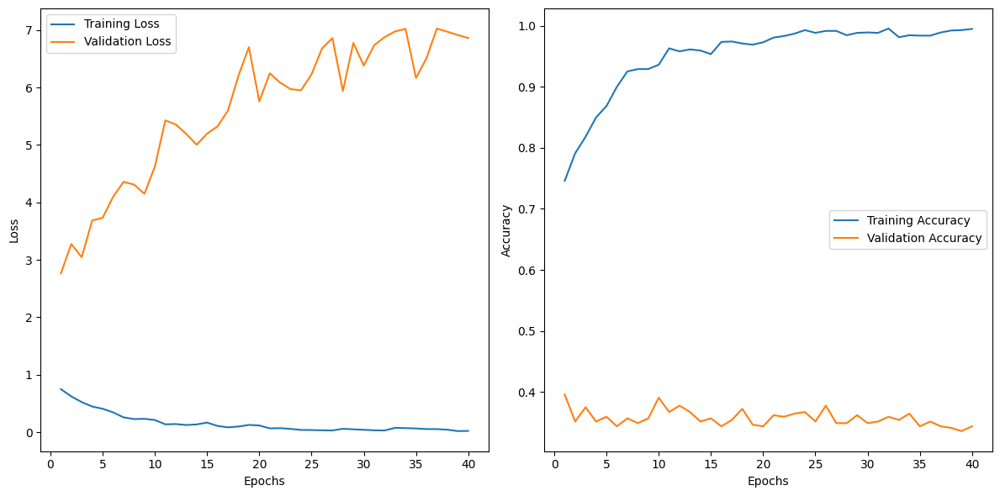

49/49 [==============================] - 5s 106ms/step - loss: 0.0222 - accuracy: 0.9948 - val_loss: 6.8634 - val_accuracy: 0.3438
Epoch 41/50
49/49 [==============================] - ETA: 0s - loss: 0.0417 - accuracy: 0.9877

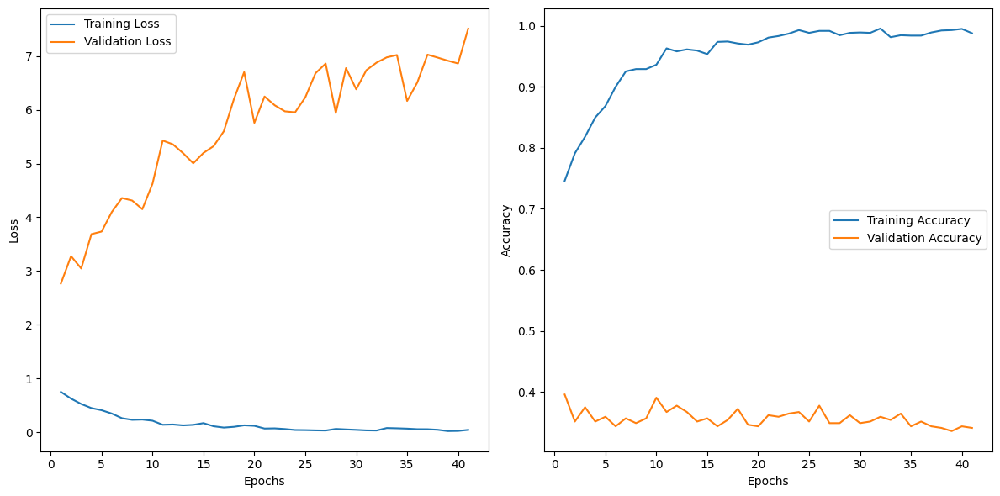

49/49 [==============================] - 5s 99ms/step - loss: 0.0417 - accuracy: 0.9877 - val_loss: 7.5141 - val_accuracy: 0.3411
Epoch 42/50
49/49 [==============================] - ETA: 0s - loss: 0.0302 - accuracy: 0.9917

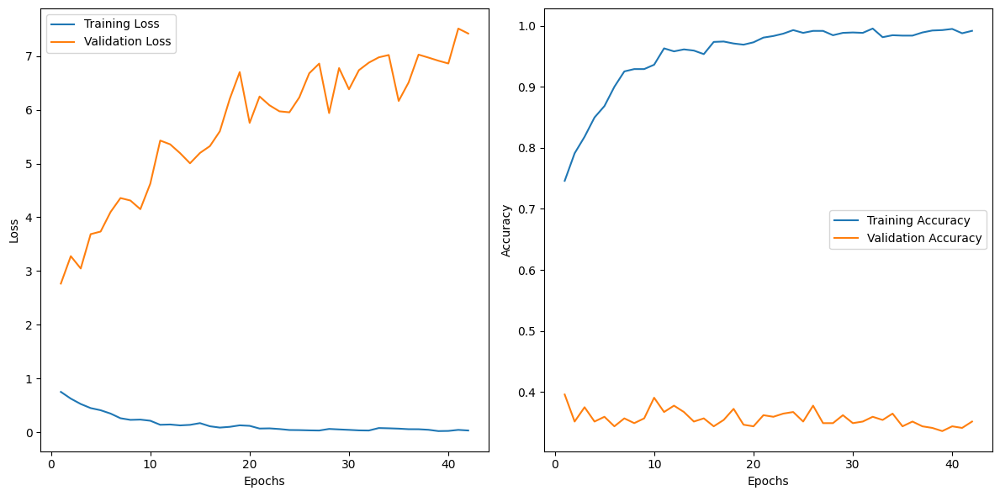

49/49 [==============================] - 5s 97ms/step - loss: 0.0302 - accuracy: 0.9917 - val_loss: 7.4211 - val_accuracy: 0.3516
Epoch 43/50
49/49 [==============================] - ETA: 0s - loss: 0.0593 - accuracy: 0.9852

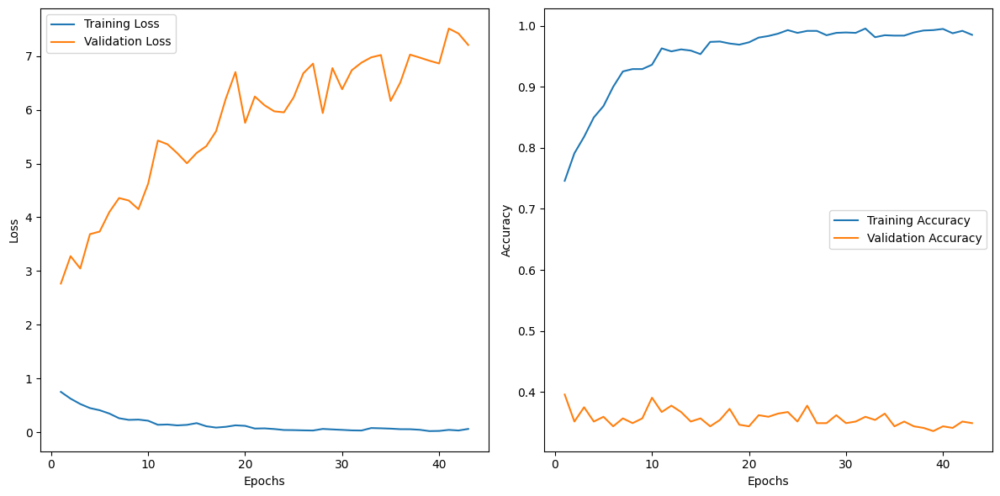

49/49 [==============================] - 5s 97ms/step - loss: 0.0593 - accuracy: 0.9852 - val_loss: 7.2085 - val_accuracy: 0.3490
Epoch 44/50
49/49 [==============================] - ETA: 0s - loss: 0.0564 - accuracy: 0.9832

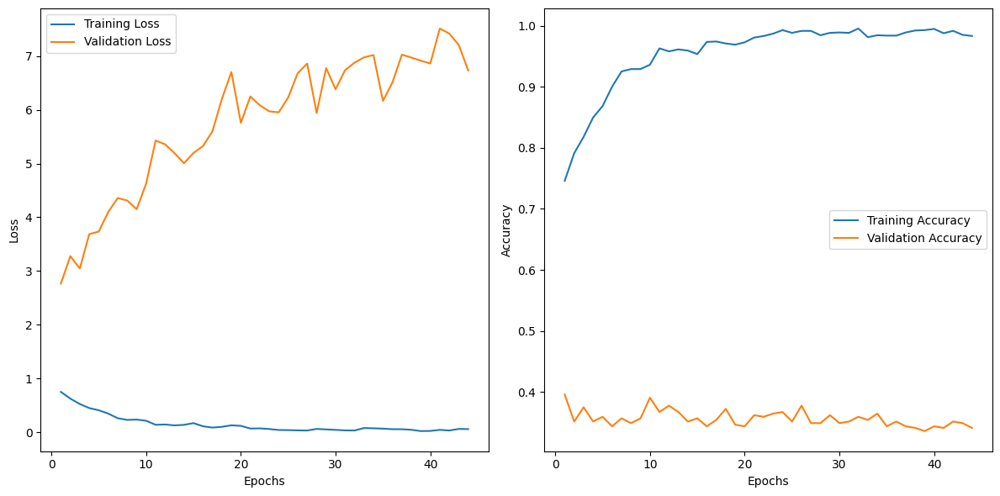

49/49 [==============================] - 5s 100ms/step - loss: 0.0564 - accuracy: 0.9832 - val_loss: 6.7324 - val_accuracy: 0.3411
Epoch 45/50
49/49 [==============================] - ETA: 0s - loss: 0.0542 - accuracy: 0.9884

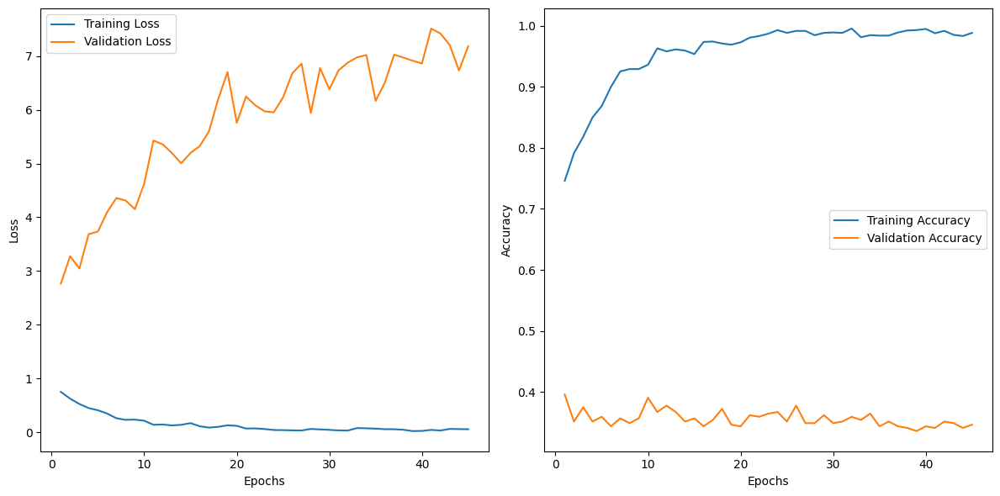

49/49 [==============================] - 5s 100ms/step - loss: 0.0542 - accuracy: 0.9884 - val_loss: 7.1845 - val_accuracy: 0.3464
Epoch 46/50
49/49 [==============================] - ETA: 0s - loss: 0.0191 - accuracy: 0.9929

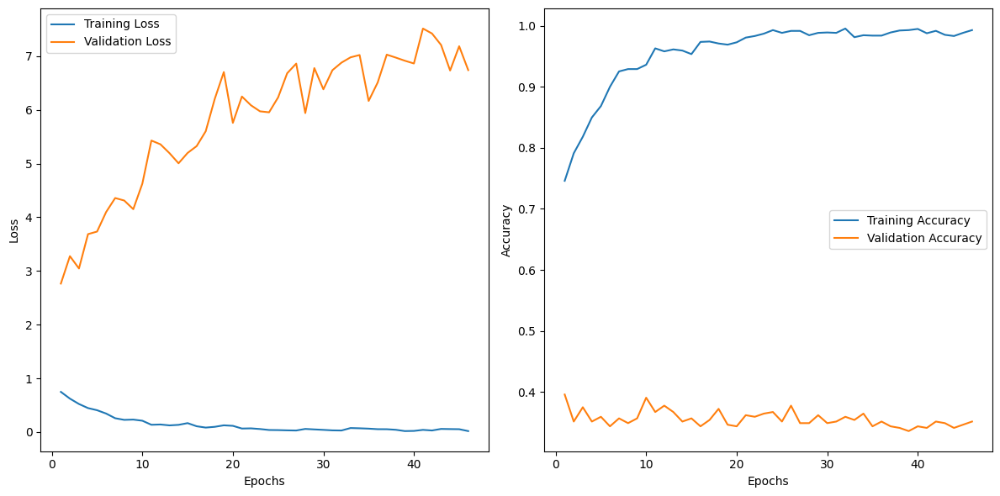

49/49 [==============================] - 5s 108ms/step - loss: 0.0191 - accuracy: 0.9929 - val_loss: 6.7403 - val_accuracy: 0.3516
Epoch 47/50
49/49 [==============================] - ETA: 0s - loss: 0.0207 - accuracy: 0.9923

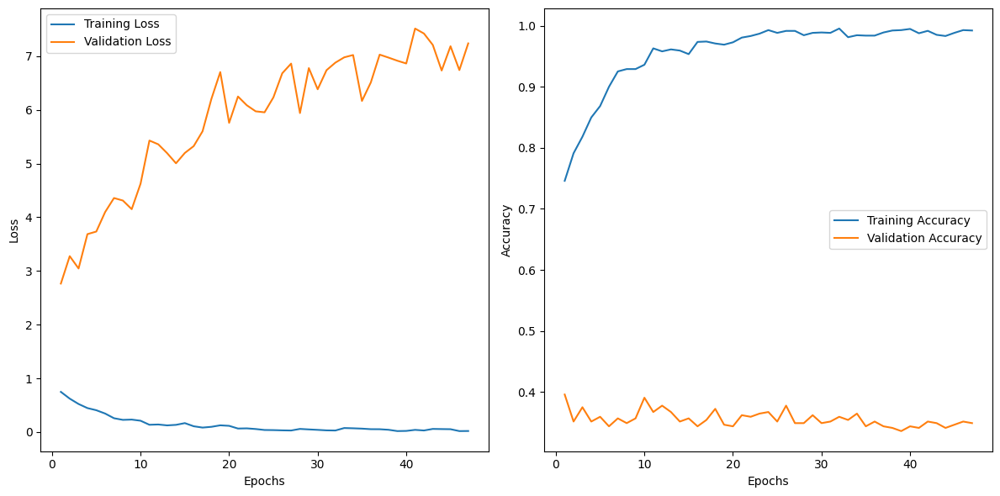

49/49 [==============================] - 5s 106ms/step - loss: 0.0207 - accuracy: 0.9923 - val_loss: 7.2374 - val_accuracy: 0.3490
Epoch 48/50
49/49 [==============================] - ETA: 0s - loss: 0.0526 - accuracy: 0.9852

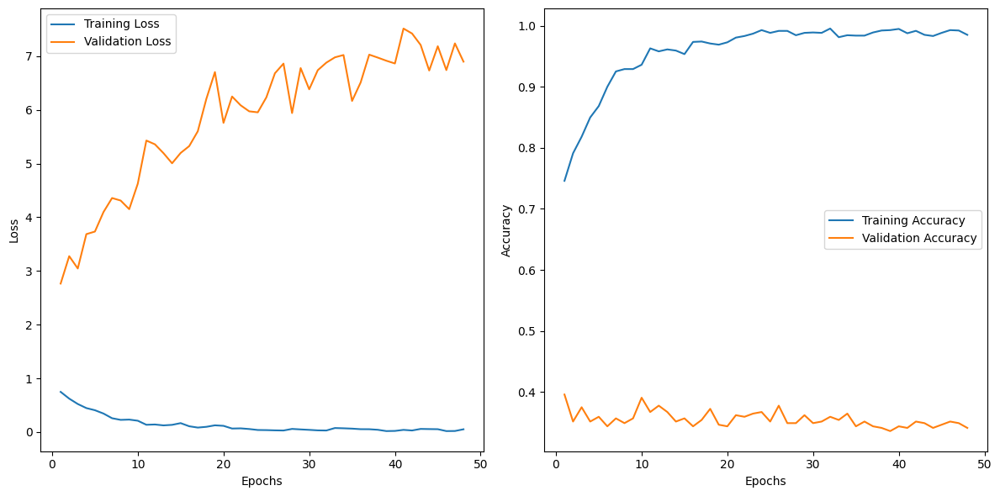

49/49 [==============================] - 5s 108ms/step - loss: 0.0526 - accuracy: 0.9852 - val_loss: 6.8974 - val_accuracy: 0.3411
Epoch 49/50
49/49 [==============================] - ETA: 0s - loss: 0.0581 - accuracy: 0.9871

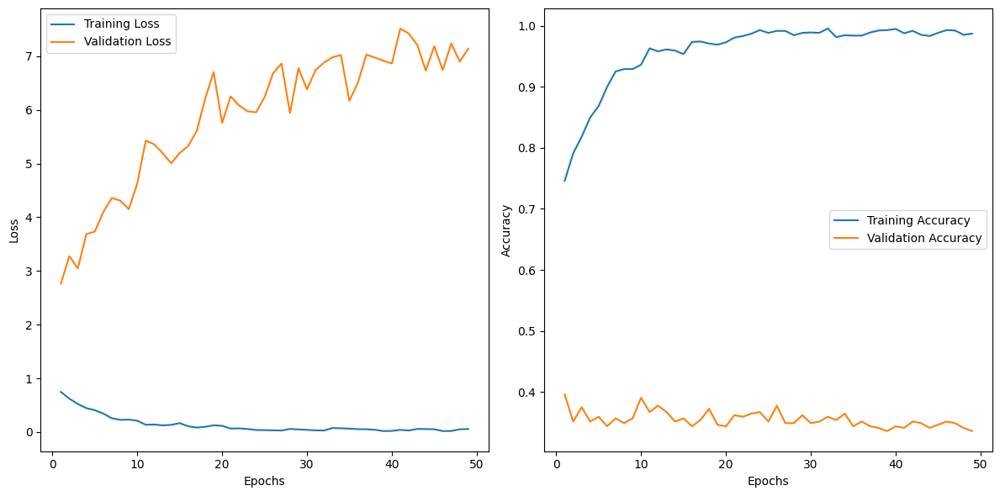

49/49 [==============================] - 5s 106ms/step - loss: 0.0581 - accuracy: 0.9871 - val_loss: 7.1370 - val_accuracy: 0.3359
Epoch 50/50
49/49 [==============================] - ETA: 0s - loss: 0.0427 - accuracy: 0.9871

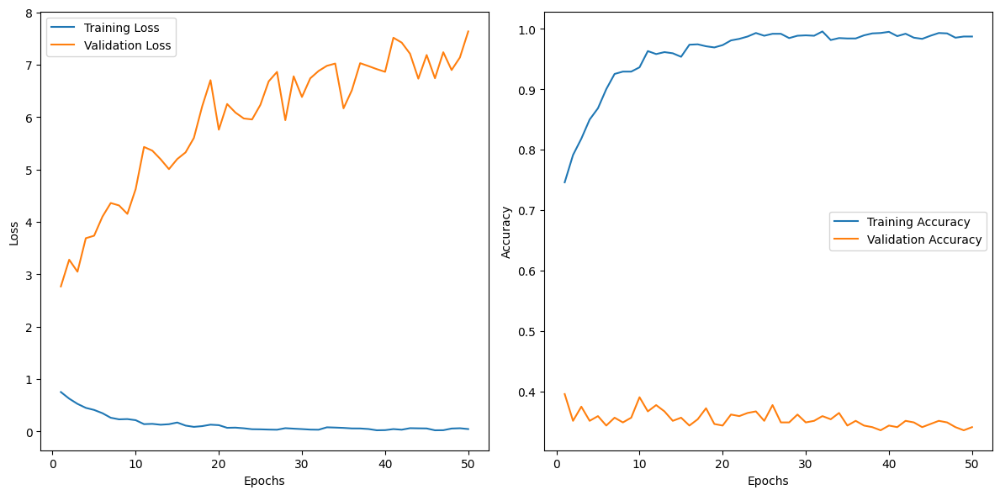

49/49 [==============================] - 5s 105ms/step - loss: 0.0427 - accuracy: 0.9871 - val_loss: 7.6340 - val_accuracy: 0.3411


In [8]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // 32,
    epochs=50,
    validation_data=test_generator,
    validation_steps=test_generator.samples // 32,
    callbacks=[PlotLossAccuracy()]
)

In [9]:
# Save the model
model.save('my_model.h5')


In [10]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model('my_model.h5')


In [13]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(test_generator)
print(f'Test loss: {loss}')
print(f'Test accuracy: {accuracy}')


13/13 [==============================] - 1s 76ms/step - loss: 7.5291 - accuracy: 0.3384
Test loss: 7.529054164886475
Test accuracy: 0.33838382363319397


In [18]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test/Hair Loss Photos Alopecia and other Hair Diseases/aug_0_61.jpg'
img = image.load_img(img_path, target_size=(120, 120))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.  # Normalize the pixel values

# Predict the class probabilities
predictions = model.predict(x)

# Get the class name
class_indices = train_generator.class_indices
predicted_class_index = np.argmax(predictions)
predicted_class_name = list(class_indices.keys())[predicted_class_index]

print("Predicted class:", predicted_class_name)


1/1 [==============================] - 0s 22ms/step
Predicted class: Hair Loss Photos Alopecia and other Hair Diseases


In [20]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test/Psoriasis pictures Lichen Planus and related diseases/aug_0_52.jpg'
img = image.load_img(img_path, target_size=(120, 120))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.  # Normalize the pixel values

# Predict the class probabilities
predictions = model.predict(x)

# Get the class name
class_indices = train_generator.class_indices
predicted_class_index = np.argmax(predictions)
predicted_class_name = list(class_indices.keys())[predicted_class_index]

print("Predicted class:", predicted_class_name)


1/1 [==============================] - 0s 30ms/step
Predicted class: Psoriasis pictures Lichen Planus and related diseases


In [21]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test/Seborrheic Keratoses and other Benign Tumors/aug_0_212.jpg'
img = image.load_img(img_path, target_size=(120, 120))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.  # Normalize the pixel values

# Predict the class probabilities
predictions = model.predict(x)

# Get the class name
class_indices = train_generator.class_indices
predicted_class_index = np.argmax(predictions)
predicted_class_name = list(class_indices.keys())[predicted_class_index]

print("Predicted class:", predicted_class_name)


1/1 [==============================] - 0s 24ms/step
Predicted class: Seborrheic Keratoses and other Benign Tumors


In [22]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test/Tinea Ringworm Candidiasis and other Fungal Infections/aug_0_42.jpg'
img = image.load_img(img_path, target_size=(120, 120))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.  # Normalize the pixel values

# Predict the class probabilities
predictions = model.predict(x)

# Get the class name
class_indices = train_generator.class_indices
predicted_class_index = np.argmax(predictions)
predicted_class_name = list(class_indices.keys())[predicted_class_index]

print("Predicted class:", predicted_class_name)


1/1 [==============================] - 0s 29ms/step
Predicted class: Tinea Ringworm Candidiasis and other Fungal Infections


In [23]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test/Urticaria Hives/aug_0_236.jpg'
img = image.load_img(img_path, target_size=(120, 120))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.  # Normalize the pixel values

# Predict the class probabilities
predictions = model.predict(x)

# Get the class name
class_indices = train_generator.class_indices
predicted_class_index = np.argmax(predictions)
predicted_class_name = list(class_indices.keys())[predicted_class_index]

print("Predicted class:", predicted_class_name)


1/1 [==============================] - 0s 27ms/step
Predicted class: Acne and Rosacea Photos


In [24]:
# Get the ground truth labels for the test dataset
ground_truth = []
for i in range(len(test_generator)):
    _, labels = test_generator[i]
    ground_truth.extend(np.argmax(labels, axis=1))

# Get the predicted labels for the test dataset
predictions = []
for i in range(len(test_generator)):
    images, _ = test_generator[i]
    preds = model.predict(images)
    predictions.extend(np.argmax(preds, axis=1))

# Compare ground truth and predictions
correct_predictions = np.sum(np.array(predictions) == np.array(ground_truth))
total_samples = len(ground_truth)
accuracy = correct_predictions / total_samples

print(f"Total samples: {total_samples}")
print(f"Correct predictions: {correct_predictions}")
print(f"Accuracy: {accuracy}")


1/1 [==============================] - 0s 21ms/step
Total samples: 396
Correct predictions: 134
Accuracy: 0.3383838383838384


In [6]:
from collections import defaultdict
# Data generators
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import numpy as np

# Load the model
model = load_model('my_model.h5')

# Define constants
IMAGE_SIZE = (120, 120)
BATCH_SIZE = 32
NUM_CLASSES = 200
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/train',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'D:/Skin Disease/test',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)
# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Initialize dictionaries to store class-wise counts and accuracies
class_counts = defaultdict(int)
class_correct = defaultdict(int)

# Iterate over the test dataset to get predictions
# Iterate over the test dataset to get predictions
for i in range(len(test_generator)):
    images, labels = test_generator[i]
    preds = model.predict(images)
    predicted_classes = np.argmax(preds, axis=1)
    
    for j in range(len(labels)):
        true_class = np.argmax(labels[j])
        pred_class = predicted_classes[j]
        
        print(f"True Label: {class_labels[true_class]}, Predicted Label: {class_labels[pred_class]}")

# Calculate and print class-wise accuracies
class_accuracies = {}
for label in class_labels:
    class_accuracies[label] = class_correct[label] / class_counts[label] if class_counts[label] > 0 else 0.0

# Find the class with the highest accuracy
max_accuracy_class = max(class_accuracies, key=class_accuracies.get)

# Print class-wise accuracies and counts
for label in class_labels:
    print(f"{label}:")
    print(f"  Count: {class_counts[label]}")
    print(f"  Accuracy: {class_accuracies[label]}")
    print()

print(f"Class with highest accuracy: {max_accuracy_class} ({class_accuracies[max_accuracy_class]})")


Found 1583 images belonging to 8 classes.
Found 396 images belonging to 8 classes.
1/1 [==============================] - 0s 215ms/step
True Label: Hair Loss Photos Alopecia and other Hair Diseases, Predicted Label: Hair Loss Photos Alopecia and other Hair Diseases
True Label: Urticaria Hives, Predicted Label: Seborrheic Keratoses and other Benign Tumors
True Label: Tinea Ringworm Candidiasis and other Fungal Infections, Predicted Label: Urticaria Hives
True Label: Seborrheic Keratoses and other Benign Tumors, Predicted Label: Seborrheic Keratoses and other Benign Tumors
True Label: Tinea Ringworm Candidiasis and other Fungal Infections, Predicted Label: Atopic Dermatitis Photos
True Label: Atopic Dermatitis Photos, Predicted Label: Atopic Dermatitis Photos
True Label: Psoriasis pictures Lichen Planus and related diseases, Predicted Label: Atopic Dermatitis Photos
True Label: Atopic Dermatitis Photos, Predicted Label: Eczema Photos
True Label: Acne and Rosacea Photos, Predicted Label: 

Found 1583 images belonging to 8 classes.
Found 396 images belonging to 8 classes.
Epoch 1/10
49/49 [==============================] - 21s 413ms/step - loss: 3.0326 - accuracy: 0.1844 - val_loss: 1.9793 - val_accuracy: 0.2500
Epoch 2/10
49/49 [==============================] - 17s 337ms/step - loss: 1.9773 - accuracy: 0.2166 - val_loss: 1.9154 - val_accuracy: 0.2578
Epoch 3/10
49/49 [==============================] - 16s 332ms/step - loss: 1.9112 - accuracy: 0.2463 - val_loss: 1.8758 - val_accuracy: 0.3359
Epoch 4/10
49/49 [==============================] - 16s 334ms/step - loss: 1.9088 - accuracy: 0.2502 - val_loss: 1.8613 - val_accuracy: 0.2865
Epoch 5/10
49/49 [==============================] - 16s 339ms/step - loss: 1.8647 - accuracy: 0.2624 - val_loss: 1.8379 - val_accuracy: 0.3177
Epoch 6/10
49/49 [==============================] - 16s 333ms/step - loss: 1.8288 - accuracy: 0.2921 - val_loss: 1.8055 - val_accuracy: 0.3385
Epoch 7/10
49/49 [==============================] - 17s 344

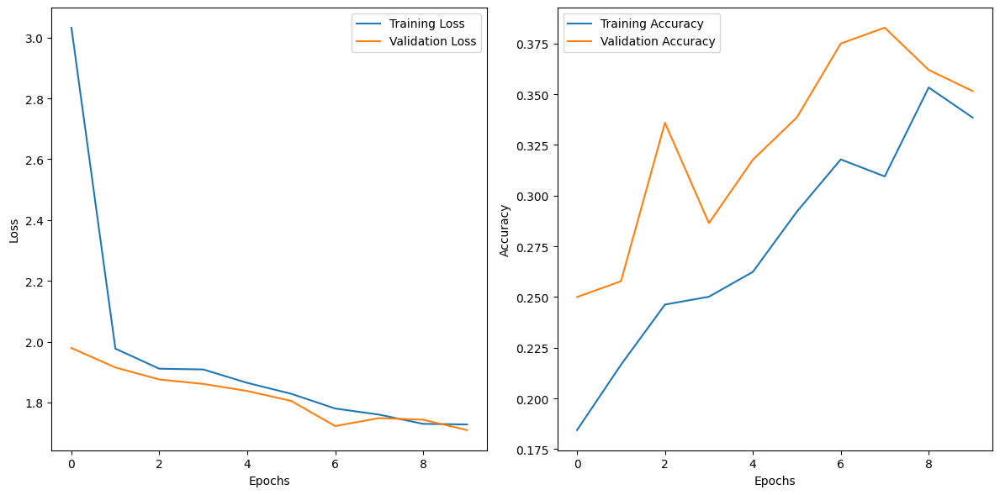

In [8]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt

# Constants
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 8
EPOCHS = 10

# Load the pre-trained VGG16 model without the top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers for classification
model = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Create data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/train',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'D:/Skin Disease/test',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Define callbacks
checkpoint = ModelCheckpoint('vgg16_finetuned.h5', save_best_only=True)
early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=test_generator,
    validation_steps=test_generator.samples // BATCH_SIZE,
    callbacks=[checkpoint, early_stopping]
)

# Evaluate the model
loss, accuracy = model.evaluate(test_generator)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [10]:
import os

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/dermnet/train'

# Non-cancerous classes
non_cancerous_classes = [
    'Acne and Rosacea Photos',
    'Atopic Dermatitis Photos',
    'Bullous Disease Photos',
    'Cellulitis Impetigo and other Bacterial Infections',
    'Eczema Photos',
    'Exanthems and Drug Eruptions',
    'Hair Loss Photos Alopecia and other Hair Diseases',
    'Herpes HPV and other STDs Photos',
    'Light Diseases and Disorders of Pigmentation',
    'Lupus and other Connective Tissue diseases',
    'Nail Fungus and other Nail Disease',
    'Poison Ivy Photos and other Contact Dermatitis',
    'Scabies Lyme Disease and other Infestations and Bites',
    'Systemic Disease',
    'Urticaria Hives',
    'Vascular Tumors',
    'Vasculitis Photos',
    'Warts Molluscum and other Viral Infections'
]

# Dictionary to store counts for each class
class_counts = {}

# Loop through each non-cancerous class
for label in non_cancerous_classes:
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        num_images = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        class_counts[label] = num_images

# Print the counts
for label, count in class_counts.items():
    print(f"{label}: {count} images")


Acne and Rosacea Photos: 840 images
Atopic Dermatitis Photos: 489 images
Bullous Disease Photos: 448 images
Cellulitis Impetigo and other Bacterial Infections: 288 images
Eczema Photos: 1235 images
Exanthems and Drug Eruptions: 404 images
Hair Loss Photos Alopecia and other Hair Diseases: 239 images
Herpes HPV and other STDs Photos: 405 images
Light Diseases and Disorders of Pigmentation: 568 images
Lupus and other Connective Tissue diseases: 420 images
Nail Fungus and other Nail Disease: 1040 images
Poison Ivy Photos and other Contact Dermatitis: 260 images
Scabies Lyme Disease and other Infestations and Bites: 431 images
Systemic Disease: 606 images
Urticaria Hives: 212 images
Vascular Tumors: 482 images
Vasculitis Photos: 416 images
Warts Molluscum and other Viral Infections: 1086 images


In [12]:
import os

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/dermnet/train'

# Non-cancerous classes
non_cancerous_classes = [
    'Acne and Rosacea Photos',
    'Atopic Dermatitis Photos',
    'Bullous Disease Photos',
    'Cellulitis Impetigo and other Bacterial Infections',
    'Eczema Photos',
    'Exanthems and Drug Eruptions',
    'Hair Loss Photos Alopecia and other Hair Diseases',
    'Herpes HPV and other STDs Photos',
    'Light Diseases and Disorders of Pigmentation',
    'Lupus and other Connective Tissue diseases',
    'Nail Fungus and other Nail Disease',
    'Poison Ivy Photos and other Contact Dermatitis',
    'Scabies Lyme Disease and other Infestations and Bites',
    'Systemic Disease',
    'Urticaria Hives',
    'Vascular Tumors',
    'Vasculitis Photos',
    'Warts Molluscum and other Viral Infections'
]

# Dictionary to store classes with images between 400 and 500
classes_400_to_500 = {}

# Loop through each non-cancerous class
for label in non_cancerous_classes:
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        num_images = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        if 400 <= num_images <= 500:
            classes_400_to_500[label] = num_images

# Print the classes with images between 400 and 500
for label, count in classes_400_to_500.items():
    print(f"{label}: {count} images")


Atopic Dermatitis Photos: 489 images
Bullous Disease Photos: 448 images
Exanthems and Drug Eruptions: 404 images
Herpes HPV and other STDs Photos: 405 images
Lupus and other Connective Tissue diseases: 420 images
Scabies Lyme Disease and other Infestations and Bites: 431 images
Vascular Tumors: 482 images
Vasculitis Photos: 416 images


In [13]:
import os

# Directory containing folders, each with images
input_dir = 'D:/Skin Disease/dermnet/test'

# Non-cancerous classes
non_cancerous_classes = [
    'Acne and Rosacea Photos',
    'Atopic Dermatitis Photos',
    'Bullous Disease Photos',
    'Cellulitis Impetigo and other Bacterial Infections',
    'Eczema Photos',
    'Exanthems and Drug Eruptions',
    'Hair Loss Photos Alopecia and other Hair Diseases',
    'Herpes HPV and other STDs Photos',
    'Light Diseases and Disorders of Pigmentation',
    'Lupus and other Connective Tissue diseases',
    'Nail Fungus and other Nail Disease',
    'Poison Ivy Photos and other Contact Dermatitis',
    'Scabies Lyme Disease and other Infestations and Bites',
    'Systemic Disease',
    'Urticaria Hives',
    'Vascular Tumors',
    'Vasculitis Photos',
    'Warts Molluscum and other Viral Infections'
]

# Dictionary to store counts for each class
class_counts = {}

# Loop through each non-cancerous class
for label in non_cancerous_classes:
    folder_path = os.path.join(input_dir, label)
    if os.path.isdir(folder_path):
        num_images = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        class_counts[label] = num_images

# Print the counts
for label, count in class_counts.items():
    print(f"{label}: {count} images")


Acne and Rosacea Photos: 312 images
Atopic Dermatitis Photos: 123 images
Bullous Disease Photos: 113 images
Cellulitis Impetigo and other Bacterial Infections: 73 images
Eczema Photos: 309 images
Exanthems and Drug Eruptions: 101 images
Hair Loss Photos Alopecia and other Hair Diseases: 60 images
Herpes HPV and other STDs Photos: 102 images
Light Diseases and Disorders of Pigmentation: 143 images
Lupus and other Connective Tissue diseases: 105 images
Nail Fungus and other Nail Disease: 261 images
Poison Ivy Photos and other Contact Dermatitis: 65 images
Scabies Lyme Disease and other Infestations and Bites: 108 images
Systemic Disease: 152 images
Urticaria Hives: 53 images
Vascular Tumors: 121 images
Vasculitis Photos: 105 images
Warts Molluscum and other Viral Infections: 272 images


In [14]:
import os
import shutil

# Source folder path
source_folder_path = 'D:/Skin Disease/dermnet/train'

# Destination folder path
destination_folder_path = 'D:/Skin Disease/train_new'

# Classes to move
classes_to_move = [
    'Atopic Dermatitis Photos', 'Bullous Disease Photos', 'Exanthems and Drug Eruptions',
    'Herpes HPV and other STDs Photos', 'Lupus and other Connective Tissue diseases',
    'Scabies Lyme Disease and other Infestations and Bites', 'Vascular Tumors', 'Vasculitis Photos'
]

# Move images of specified classes to the destination folder
for class_name in classes_to_move:
    class_folder_path = os.path.join(source_folder_path, class_name)
    if os.path.exists(class_folder_path):
        images = os.listdir(class_folder_path)
        for img in images:
            src = os.path.join(class_folder_path, img)
            dst = os.path.join(destination_folder_path, class_name, img)
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.move(src, dst)
            print(f"Moved {src} to {dst}")
    else:
        print(f"Folder not found for class: {class_name}")


Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03DermatitisLids.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03DermatitisLids.jpg
Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03Eczema0310.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03Eczema0310.jpg
Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03EczemaAreolae021223.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03EczemaAreolae021223.jpg
Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03ichthyosis020127.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03ichthyosis020127.jpg
Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03ichthyosis030127.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03ichthyosis030127.jpg
Moved D:/Skin Disease/dermnet/train\Atopic Dermatitis Photos\03ichthyosis040127.jpg to D:/Skin Disease/train_new\Atopic Dermatitis Photos\03ichthyosis040127.jpg
Moved D:/Skin Disease/dermnet/train\Atopic D

In [15]:
import os
import shutil

# Source folder path
source_folder_path = 'D:/Skin Disease/dermnet/test'

# Destination folder path
destination_folder_path = 'D:/Skin Disease/test_new'

# Classes to move
classes_to_move = [
    'Atopic Dermatitis Photos', 'Bullous Disease Photos', 'Exanthems and Drug Eruptions',
    'Herpes HPV and other STDs Photos', 'Lupus and other Connective Tissue diseases',
    'Scabies Lyme Disease and other Infestations and Bites', 'Vascular Tumors', 'Vasculitis Photos'
]

# Move images of specified classes to the destination folder
for class_name in classes_to_move:
    class_folder_path = os.path.join(source_folder_path, class_name)
    if os.path.exists(class_folder_path):
        images = os.listdir(class_folder_path)
        for img in images:
            src = os.path.join(class_folder_path, img)
            dst = os.path.join(destination_folder_path, class_name, img)
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.move(src, dst)
            print(f"Moved {src} to {dst}")
    else:
        print(f"Folder not found for class: {class_name}")


Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\03DermatitisAreola45.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\03DermatitisAreola45.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\03DermatitisLids1.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\03DermatitisLids1.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\03EczemaAreolae1.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\03EczemaAreolae1.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\03ichthyosis0213061.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\03ichthyosis0213061.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\03ichthyosis050127.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\03ichthyosis050127.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis Photos\05atopic0110053.jpg to D:/Skin Disease/test_new\Atopic Dermatitis Photos\05atopic0110053.jpg
Moved D:/Skin Disease/dermnet/test\Atopic Dermatitis

Found 3495 images belonging to 8 classes.
Found 878 images belonging to 8 classes.
Epoch 1/10
109/109 [==============================] - 78s 710ms/step - loss: 2.5123 - accuracy: 0.1787 - val_loss: 1.9793 - val_accuracy: 0.2037
Epoch 2/10
109/109 [==============================] - 36s 332ms/step - loss: 1.9890 - accuracy: 0.2157 - val_loss: 1.9341 - val_accuracy: 0.2454
Epoch 3/10
109/109 [==============================] - 38s 350ms/step - loss: 1.9645 - accuracy: 0.2160 - val_loss: 1.9011 - val_accuracy: 0.2500
Epoch 4/10
109/109 [==============================] - 38s 347ms/step - loss: 1.9429 - accuracy: 0.2206 - val_loss: 1.8693 - val_accuracy: 0.2882
Epoch 5/10
109/109 [==============================] - 37s 336ms/step - loss: 1.9209 - accuracy: 0.2284 - val_loss: 1.9017 - val_accuracy: 0.3125
Epoch 6/10
109/109 [==============================] - 36s 331ms/step - loss: 1.9079 - accuracy: 0.2408 - val_loss: 1.8410 - val_accuracy: 0.3403
Epoch 7/10
109/109 [===========================

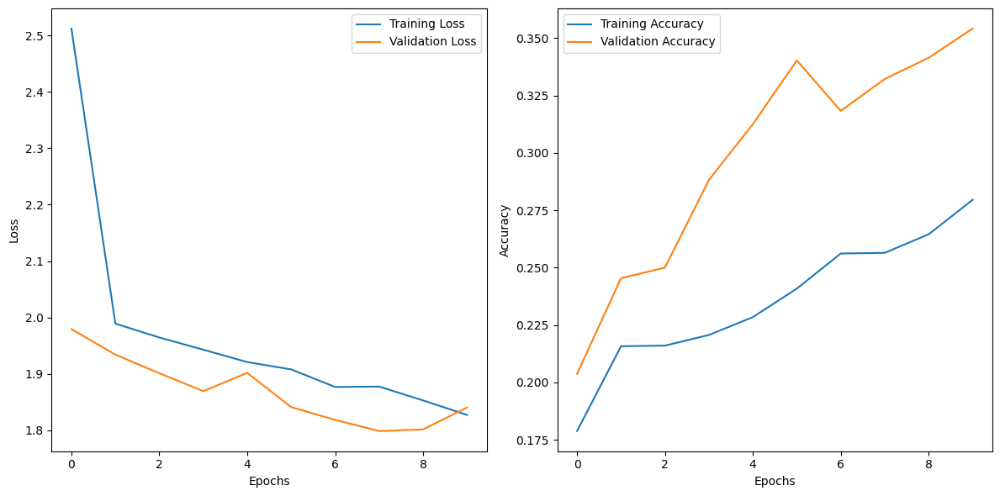

In [16]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt

# Constants
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 8
EPOCHS = 10

# Load the pre-trained VGG16 model without the top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers for classification
model = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Create data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/train_new',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'D:/Skin Disease/test_new',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Define callbacks
checkpoint = ModelCheckpoint('vgg16_finetuned_new.h5', save_best_only=True)
early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=test_generator,
    validation_steps=test_generator.samples // BATCH_SIZE,
    callbacks=[checkpoint, early_stopping]
)

# Evaluate the model
loss, accuracy = model.evaluate(test_generator)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [17]:
from tensorflow.keras.models import load_model

# Load the model
model1 = load_model('D:/Skin Disease/vgg16_finetuned_new.h5')

In [23]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load an image
img_path = 'D:/Skin Disease/test_new/Vasculitis Photos/vasculitis-9.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255.0  # Normalize the pixel values

# Make predictions
predictions = model1.predict(x)
predicted_class = np.argmax(predictions[0])

# Get the class label
class_labels = list(train_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

print(f"Predicted class: {predicted_label}")

1/1 [==============================] - 0s 27ms/step
Predicted class: Atopic Dermatitis Photos


Found 1583 images belonging to 8 classes.
Found 396 images belonging to 8 classes.
Epoch 1/100
49/49 [==============================] - ETA: 0s - loss: 2.0409 - accuracy: 0.1986

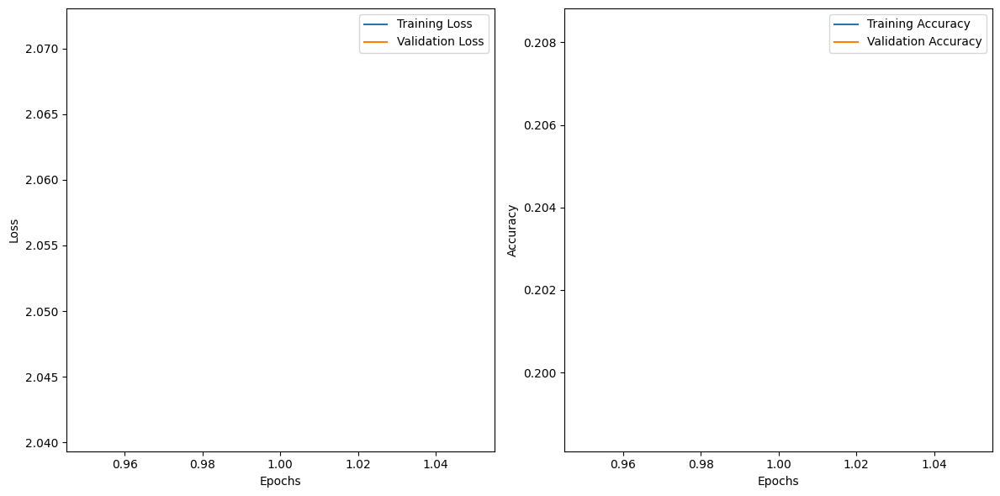

49/49 [==============================] - 7s 116ms/step - loss: 2.0409 - accuracy: 0.1986 - val_loss: 2.0715 - val_accuracy: 0.2083
Epoch 2/100
49/49 [==============================] - ETA: 0s - loss: 1.9166 - accuracy: 0.2663

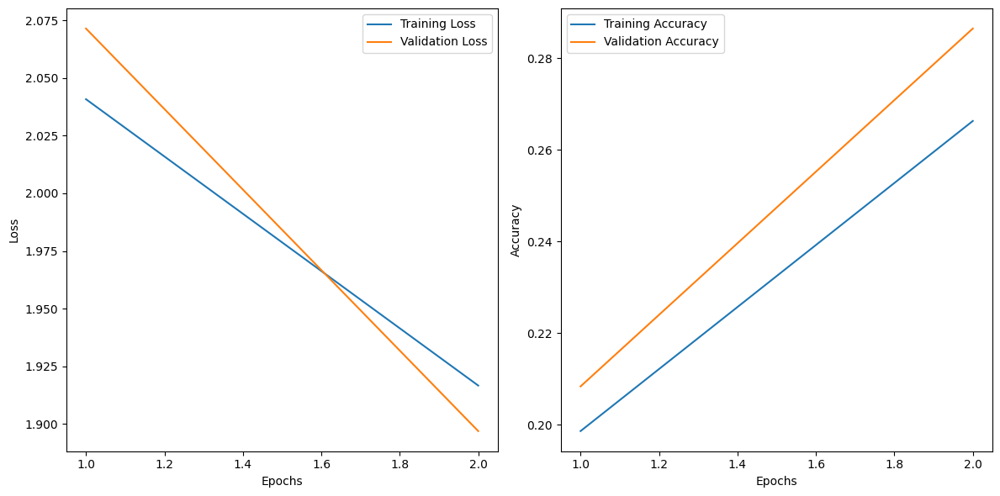

49/49 [==============================] - 5s 106ms/step - loss: 1.9166 - accuracy: 0.2663 - val_loss: 1.8968 - val_accuracy: 0.2865
Epoch 3/100
49/49 [==============================] - ETA: 0s - loss: 1.7988 - accuracy: 0.3179

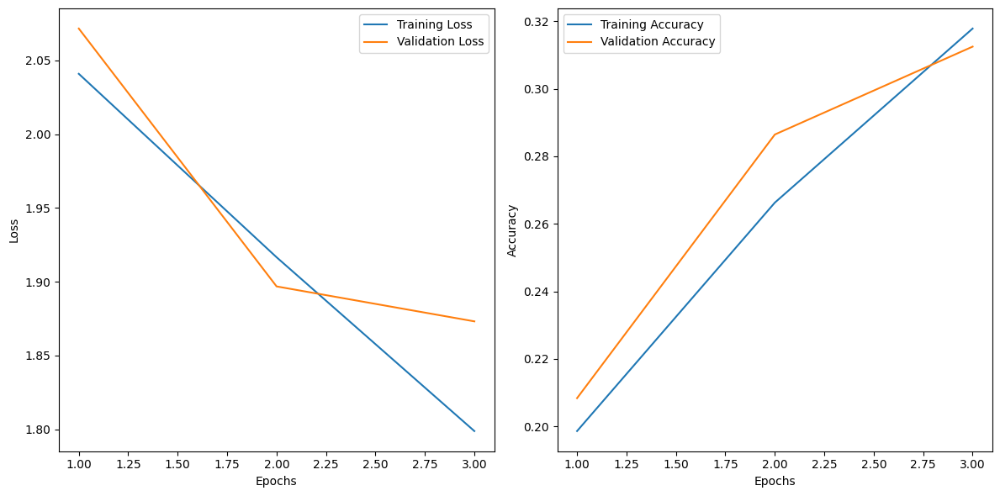

49/49 [==============================] - 5s 104ms/step - loss: 1.7988 - accuracy: 0.3179 - val_loss: 1.8731 - val_accuracy: 0.3125
Epoch 4/100
49/49 [==============================] - ETA: 0s - loss: 1.7271 - accuracy: 0.3688

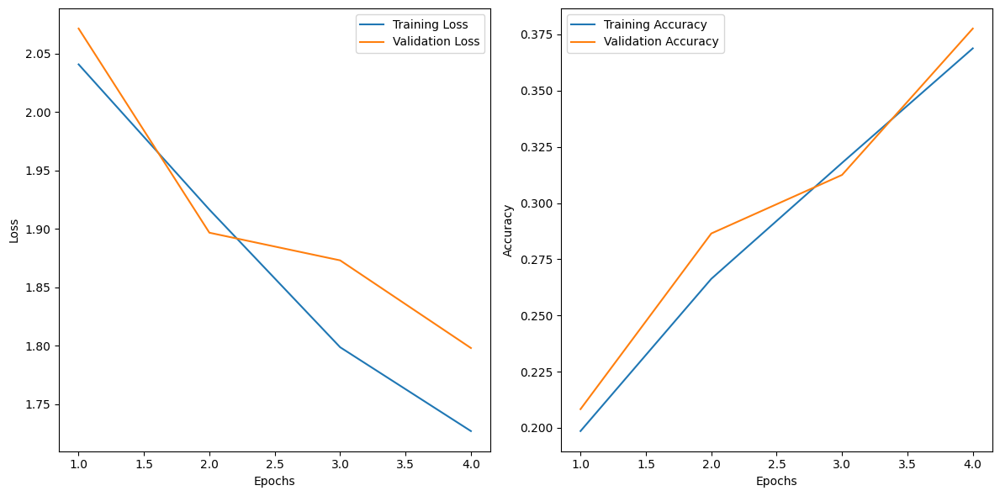

49/49 [==============================] - 5s 107ms/step - loss: 1.7271 - accuracy: 0.3688 - val_loss: 1.7981 - val_accuracy: 0.3776
Epoch 5/100
49/49 [==============================] - ETA: 0s - loss: 1.6014 - accuracy: 0.4094

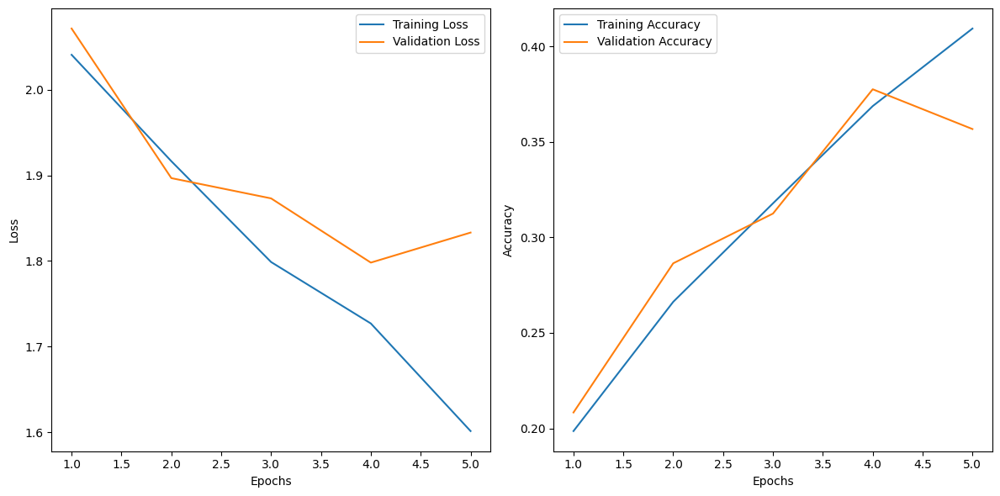

49/49 [==============================] - 5s 97ms/step - loss: 1.6014 - accuracy: 0.4094 - val_loss: 1.8332 - val_accuracy: 0.3568
Epoch 6/100
49/49 [==============================] - ETA: 0s - loss: 1.4133 - accuracy: 0.5068

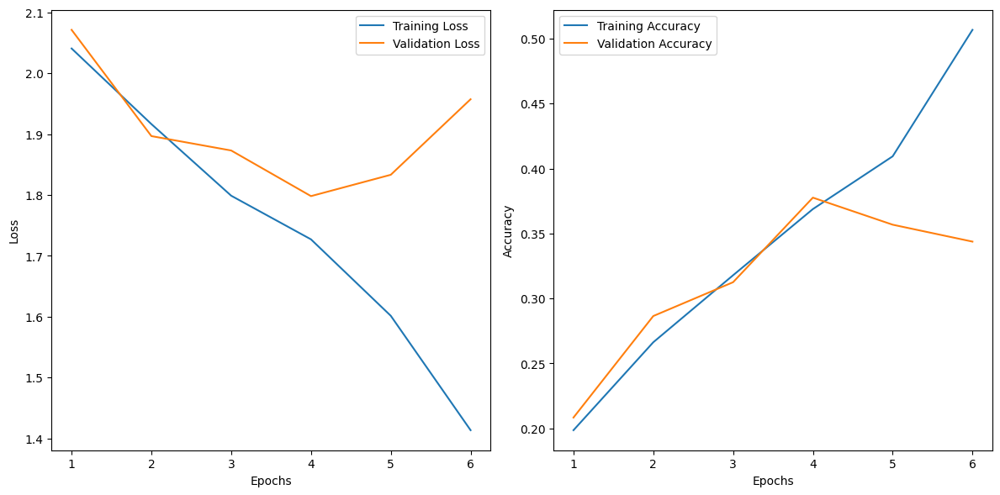

49/49 [==============================] - 5s 100ms/step - loss: 1.4133 - accuracy: 0.5068 - val_loss: 1.9574 - val_accuracy: 0.3438
Epoch 7/100
49/49 [==============================] - ETA: 0s - loss: 1.2265 - accuracy: 0.5467

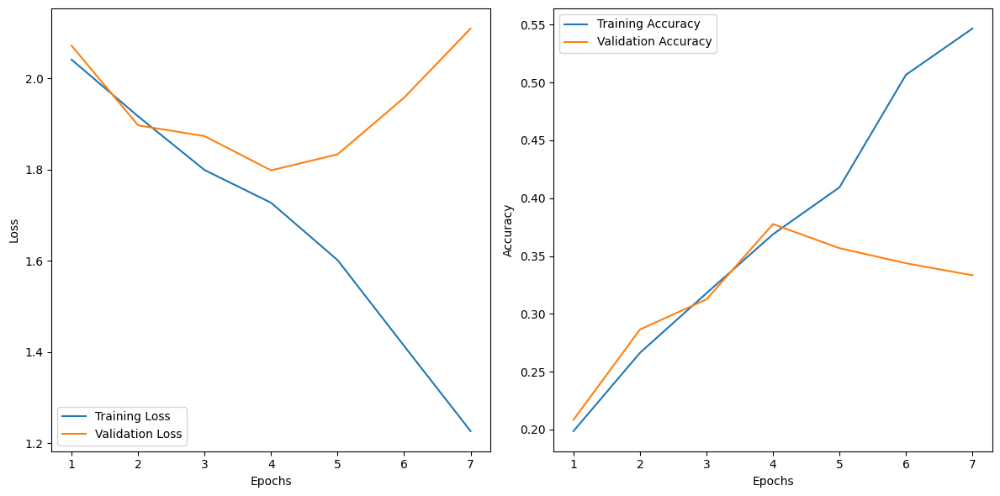

49/49 [==============================] - 5s 100ms/step - loss: 1.2265 - accuracy: 0.5467 - val_loss: 2.1091 - val_accuracy: 0.3333
Epoch 8/100
49/49 [==============================] - ETA: 0s - loss: 1.0532 - accuracy: 0.6235

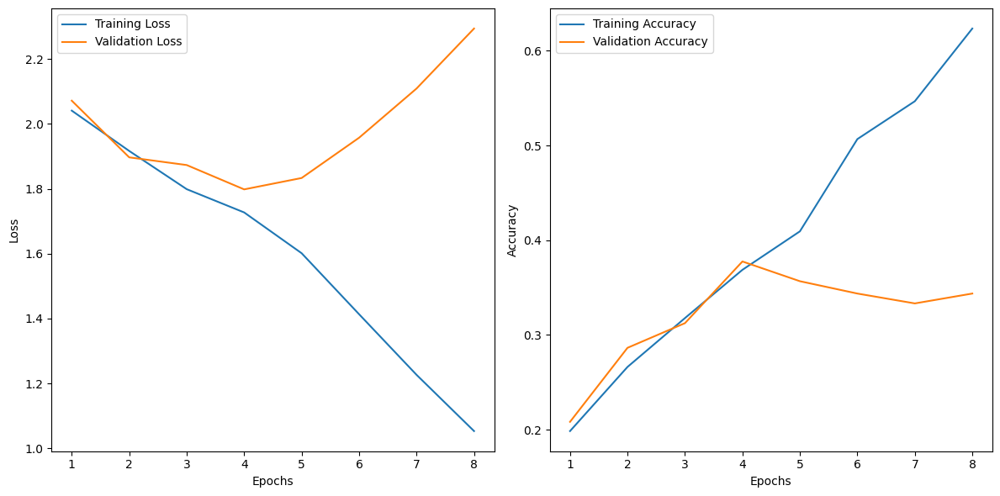

49/49 [==============================] - 5s 101ms/step - loss: 1.0532 - accuracy: 0.6235 - val_loss: 2.2939 - val_accuracy: 0.3438
Epoch 9/100
49/49 [==============================] - ETA: 0s - loss: 0.8831 - accuracy: 0.7015

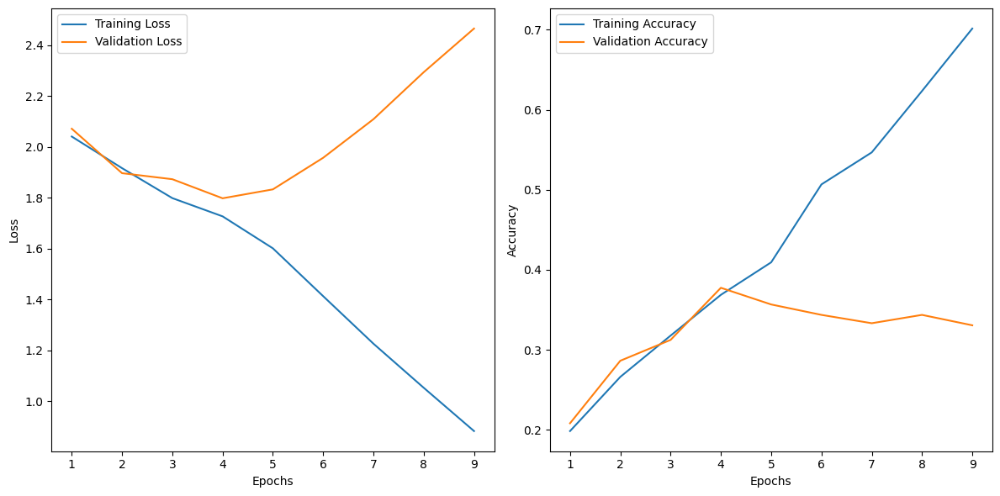

49/49 [==============================] - 5s 107ms/step - loss: 0.8831 - accuracy: 0.7015 - val_loss: 2.4654 - val_accuracy: 0.3307
Epoch 10/100
49/49 [==============================] - ETA: 0s - loss: 0.7392 - accuracy: 0.7382

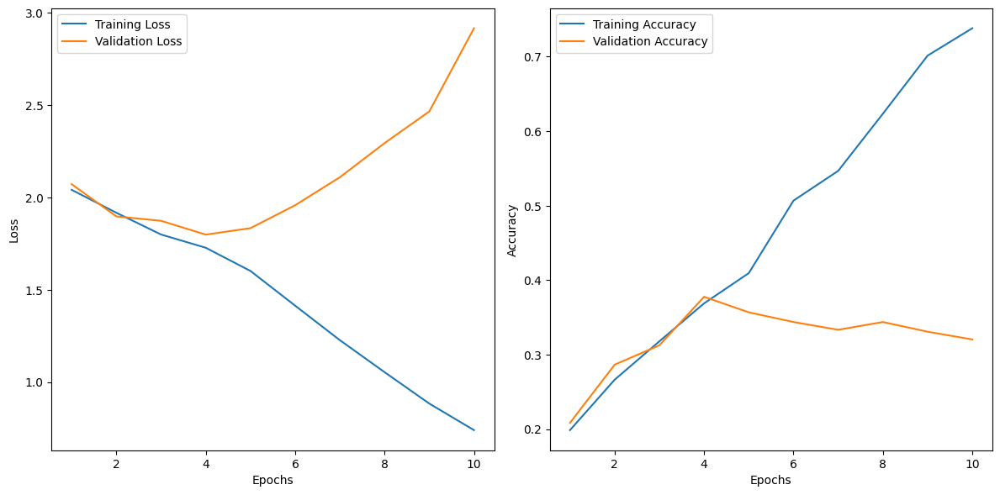

49/49 [==============================] - 5s 105ms/step - loss: 0.7392 - accuracy: 0.7382 - val_loss: 2.9161 - val_accuracy: 0.3203
Epoch 11/100
49/49 [==============================] - ETA: 0s - loss: 0.5494 - accuracy: 0.8240

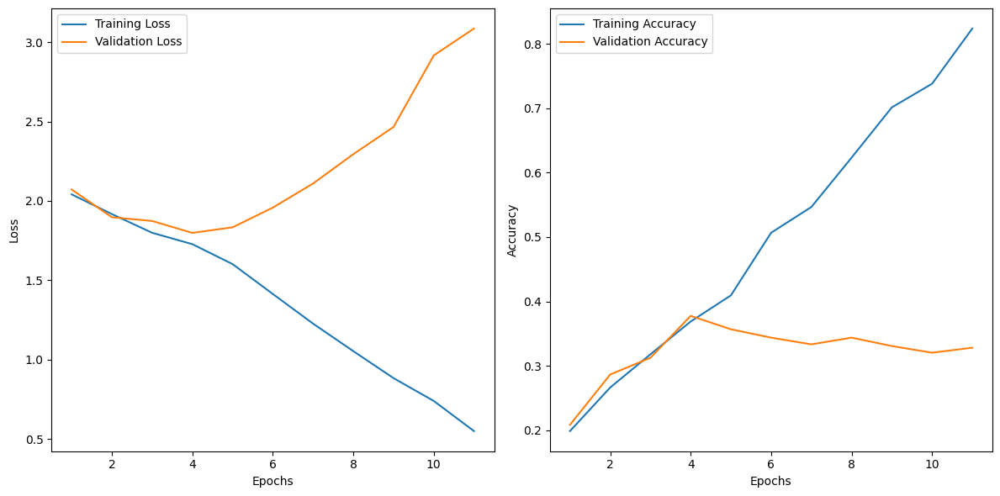

49/49 [==============================] - 5s 103ms/step - loss: 0.5494 - accuracy: 0.8240 - val_loss: 3.0856 - val_accuracy: 0.3281
Epoch 12/100
49/49 [==============================] - ETA: 0s - loss: 0.4716 - accuracy: 0.8440

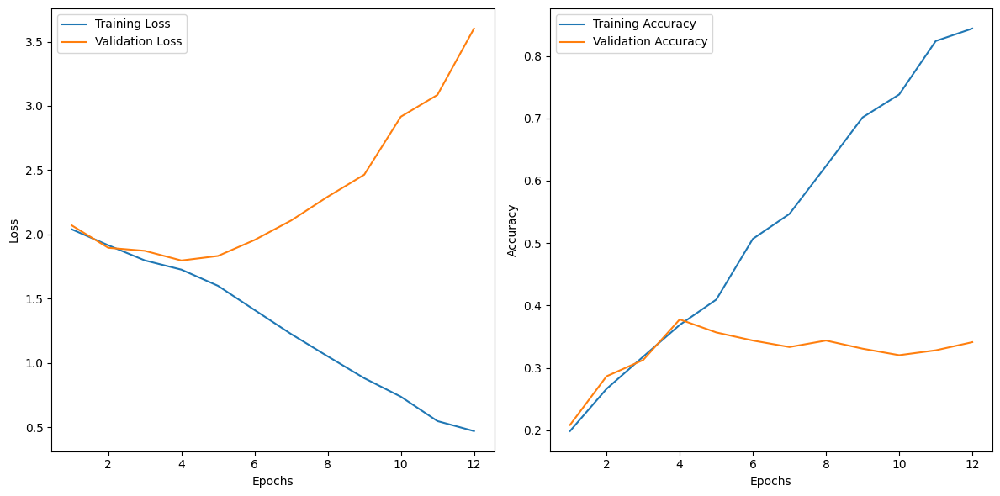

49/49 [==============================] - 5s 104ms/step - loss: 0.4716 - accuracy: 0.8440 - val_loss: 3.6017 - val_accuracy: 0.3411
Epoch 13/100
49/49 [==============================] - ETA: 0s - loss: 0.3928 - accuracy: 0.8698

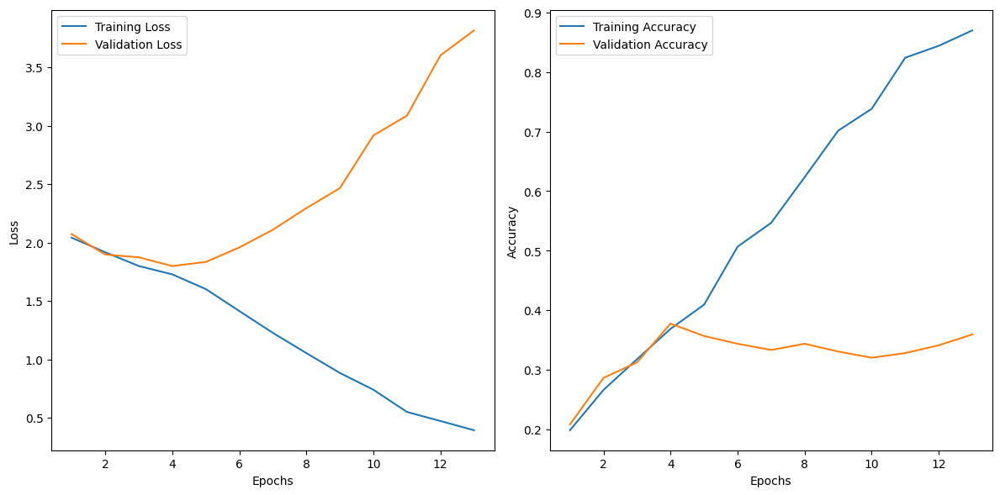

49/49 [==============================] - 5s 110ms/step - loss: 0.3928 - accuracy: 0.8698 - val_loss: 3.8152 - val_accuracy: 0.3594
Epoch 14/100
49/49 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.9117

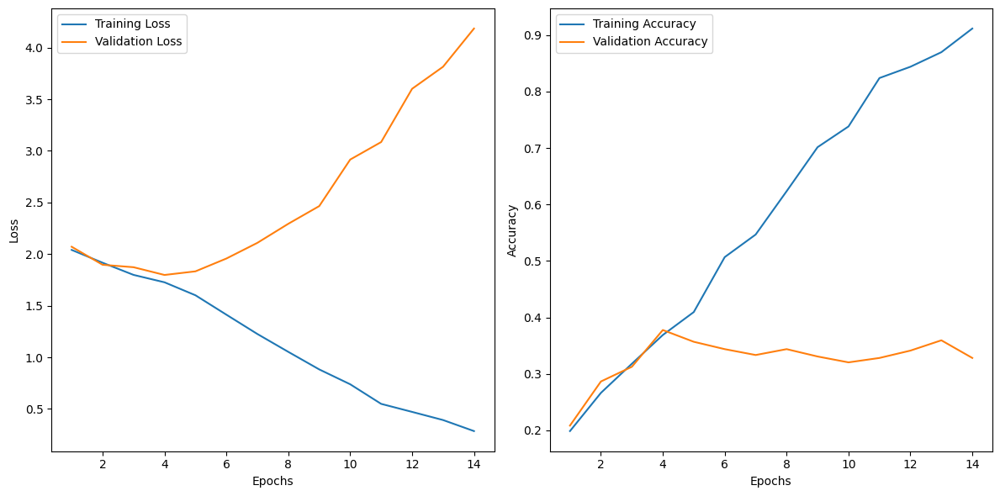

49/49 [==============================] - 5s 111ms/step - loss: 0.2857 - accuracy: 0.9117 - val_loss: 4.1854 - val_accuracy: 0.3281
Epoch 15/100
49/49 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.9110

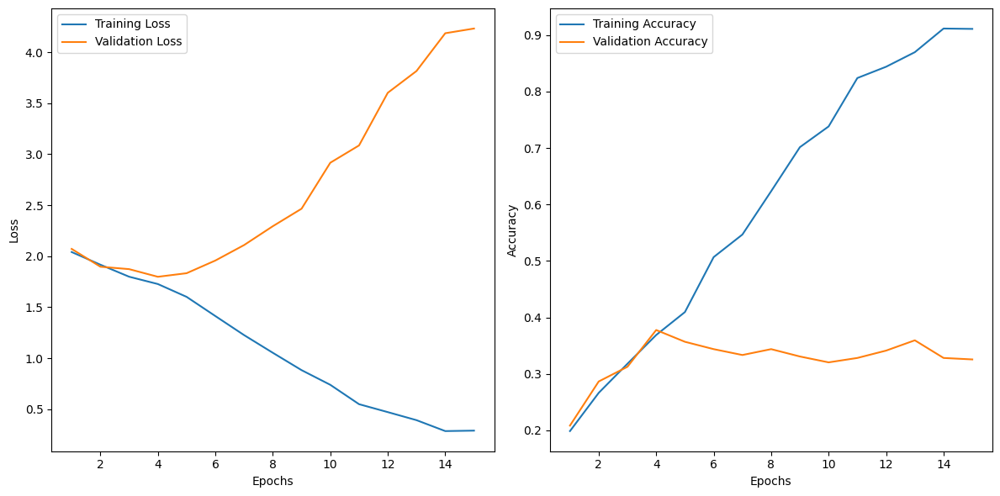

49/49 [==============================] - 6s 122ms/step - loss: 0.2902 - accuracy: 0.9110 - val_loss: 4.2315 - val_accuracy: 0.3255
Epoch 16/100
49/49 [==============================] - ETA: 0s - loss: 0.2447 - accuracy: 0.9252

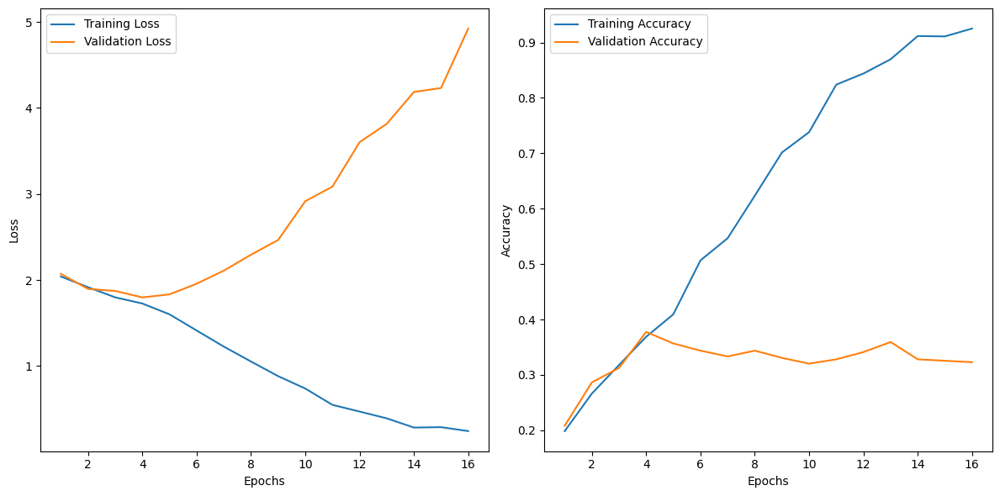

49/49 [==============================] - 6s 114ms/step - loss: 0.2447 - accuracy: 0.9252 - val_loss: 4.9225 - val_accuracy: 0.3229
Epoch 17/100
49/49 [==============================] - ETA: 0s - loss: 0.2481 - accuracy: 0.9323

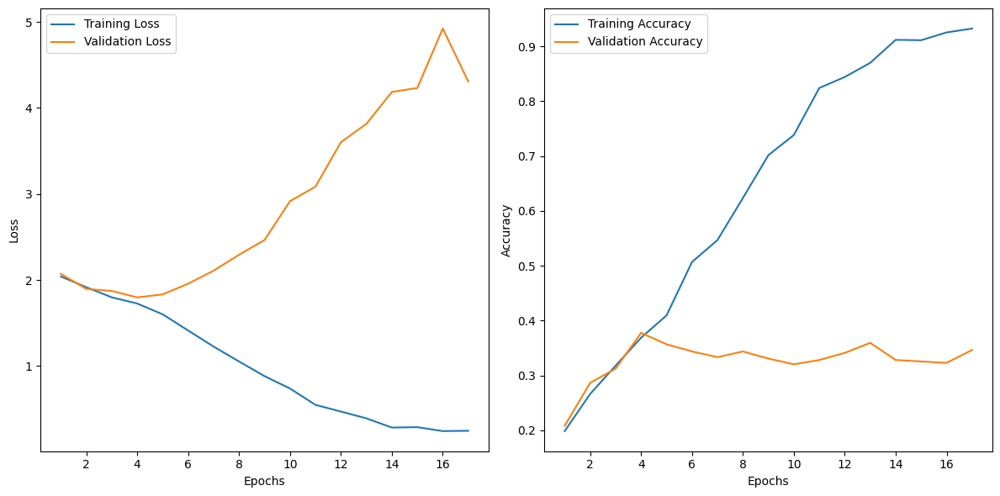

49/49 [==============================] - 6s 116ms/step - loss: 0.2481 - accuracy: 0.9323 - val_loss: 4.3080 - val_accuracy: 0.3464
Epoch 18/100
49/49 [==============================] - ETA: 0s - loss: 0.1477 - accuracy: 0.9523

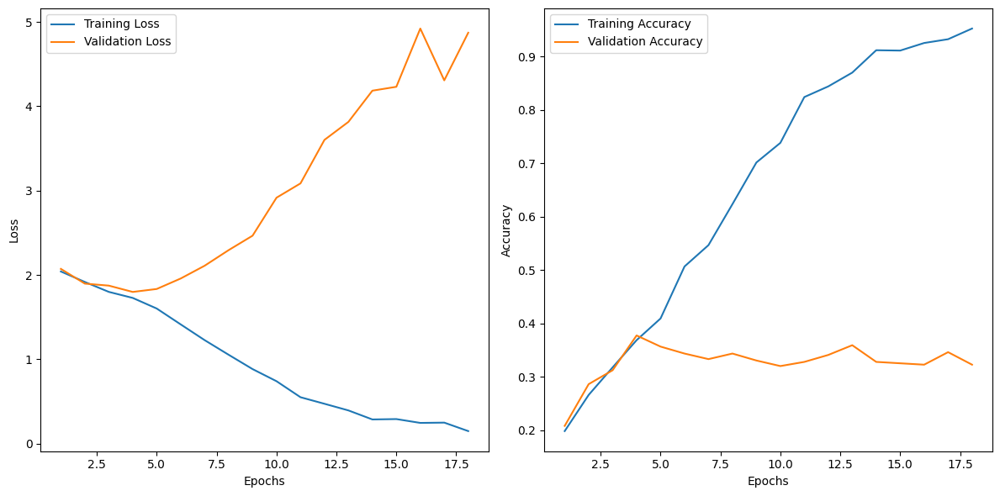

49/49 [==============================] - 6s 115ms/step - loss: 0.1477 - accuracy: 0.9523 - val_loss: 4.8726 - val_accuracy: 0.3229
Epoch 19/100
49/49 [==============================] - ETA: 0s - loss: 0.1138 - accuracy: 0.9710

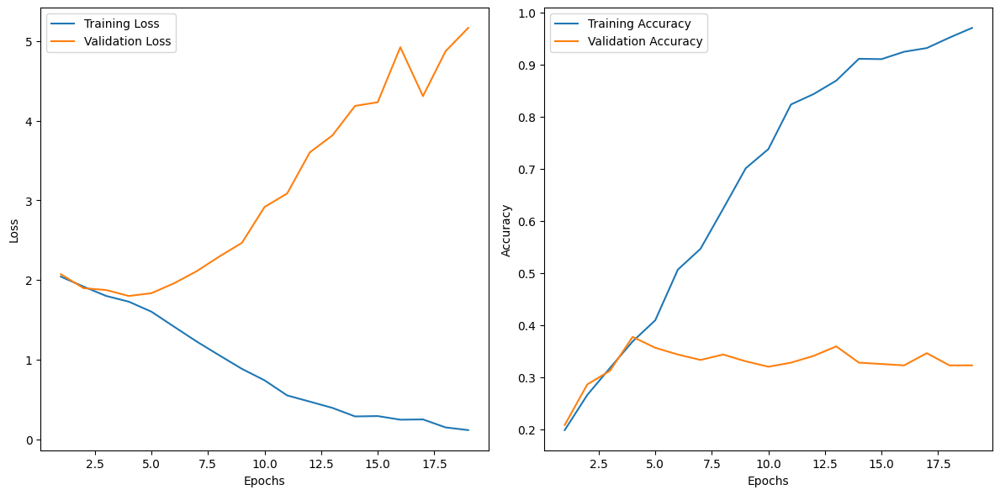

49/49 [==============================] - 5s 102ms/step - loss: 0.1138 - accuracy: 0.9710 - val_loss: 5.1649 - val_accuracy: 0.3229
Epoch 20/100
49/49 [==============================] - ETA: 0s - loss: 0.1244 - accuracy: 0.9645

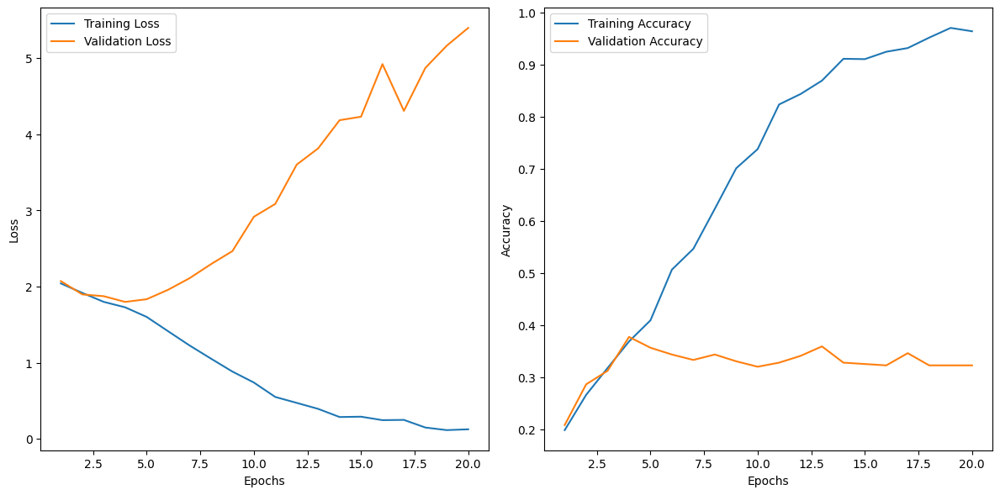

49/49 [==============================] - 5s 100ms/step - loss: 0.1244 - accuracy: 0.9645 - val_loss: 5.3982 - val_accuracy: 0.3229
Epoch 21/100
49/49 [==============================] - ETA: 0s - loss: 0.1031 - accuracy: 0.9729

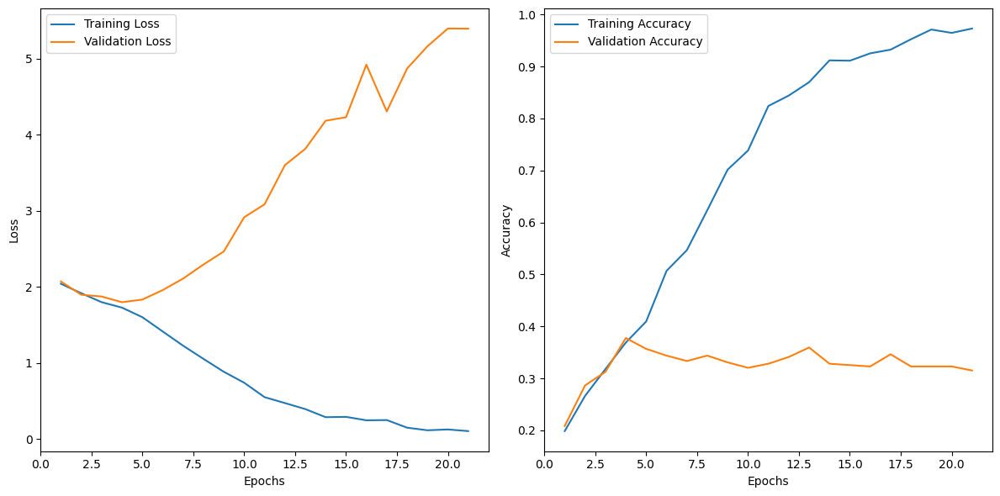

49/49 [==============================] - 5s 102ms/step - loss: 0.1031 - accuracy: 0.9729 - val_loss: 5.3966 - val_accuracy: 0.3151
Epoch 22/100
49/49 [==============================] - ETA: 0s - loss: 0.0905 - accuracy: 0.9742

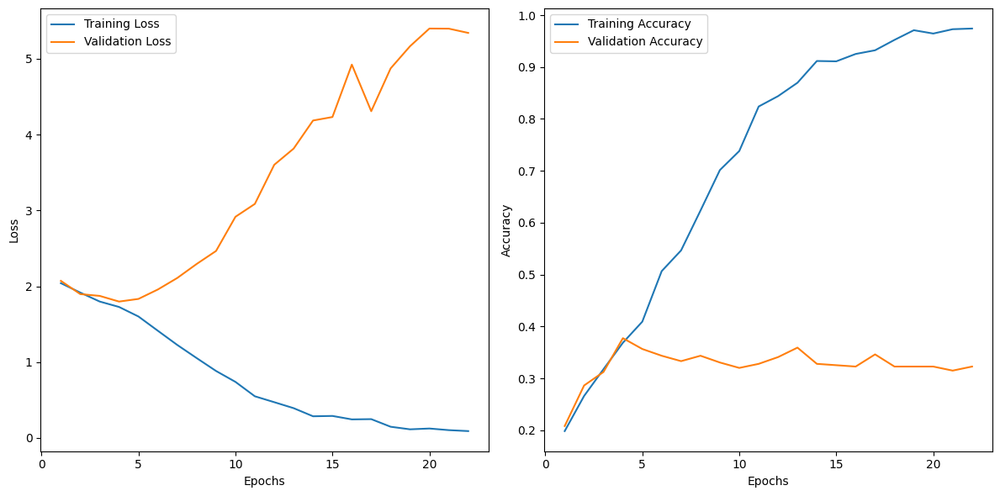

49/49 [==============================] - 6s 113ms/step - loss: 0.0905 - accuracy: 0.9742 - val_loss: 5.3405 - val_accuracy: 0.3229
Epoch 23/100
49/49 [==============================] - ETA: 0s - loss: 0.0803 - accuracy: 0.9794

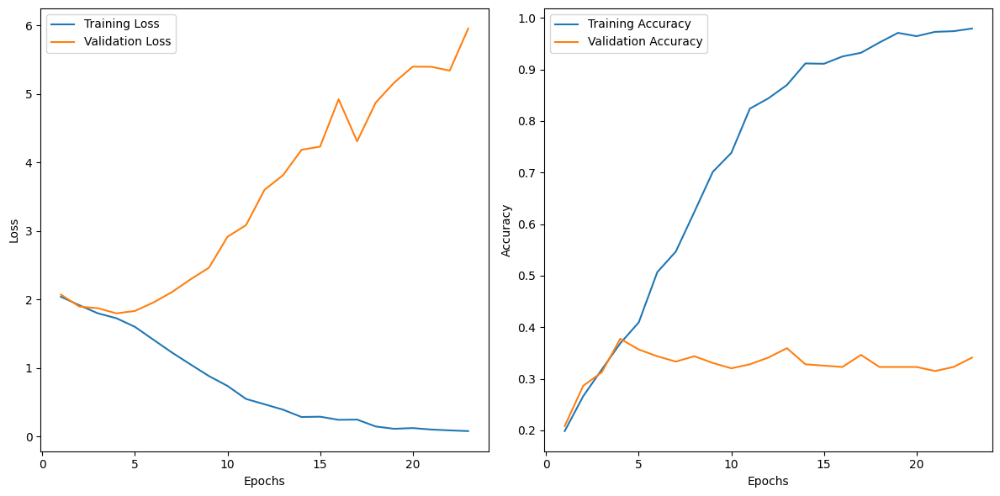

49/49 [==============================] - 5s 103ms/step - loss: 0.0803 - accuracy: 0.9794 - val_loss: 5.9545 - val_accuracy: 0.3411
Epoch 24/100
49/49 [==============================] - ETA: 0s - loss: 0.0608 - accuracy: 0.9826

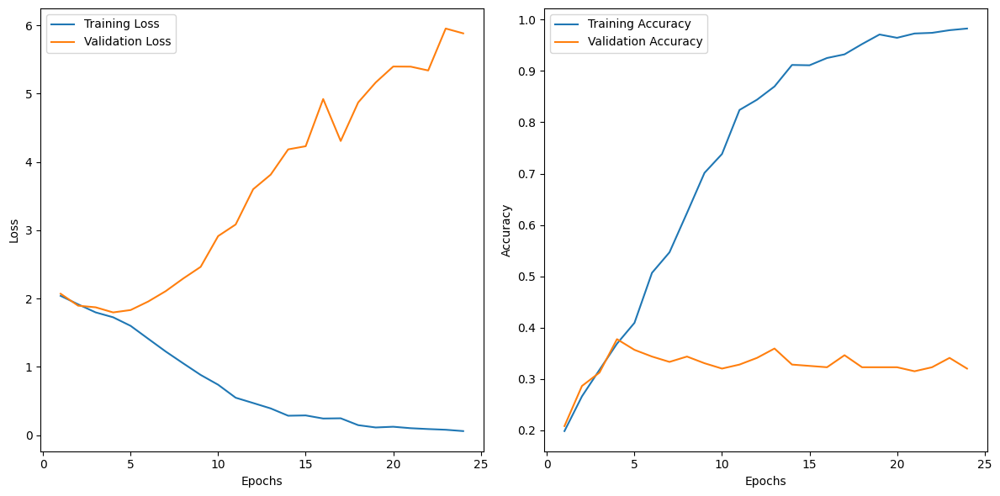

49/49 [==============================] - 5s 104ms/step - loss: 0.0608 - accuracy: 0.9826 - val_loss: 5.8840 - val_accuracy: 0.3203
Epoch 25/100
49/49 [==============================] - ETA: 0s - loss: 0.0708 - accuracy: 0.9826

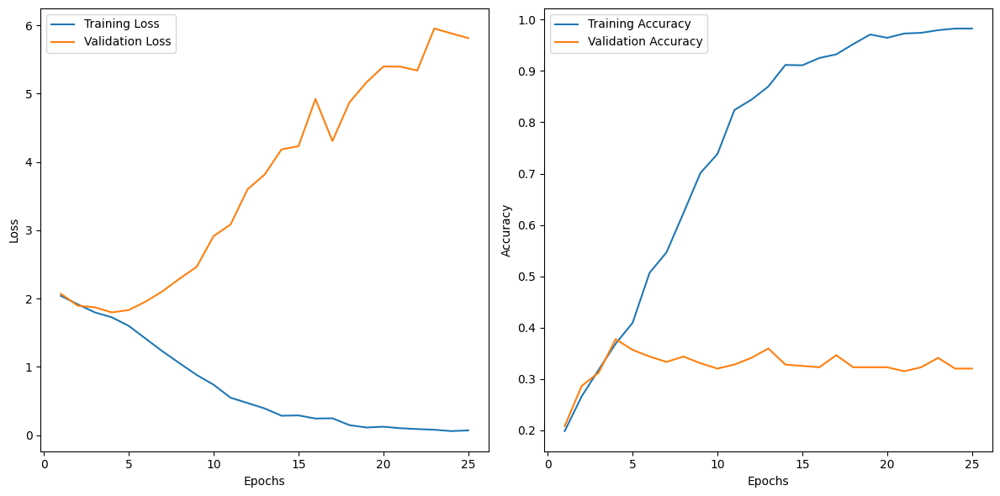

49/49 [==============================] - 5s 105ms/step - loss: 0.0708 - accuracy: 0.9826 - val_loss: 5.8143 - val_accuracy: 0.3203
Epoch 26/100
49/49 [==============================] - ETA: 0s - loss: 0.0583 - accuracy: 0.9871

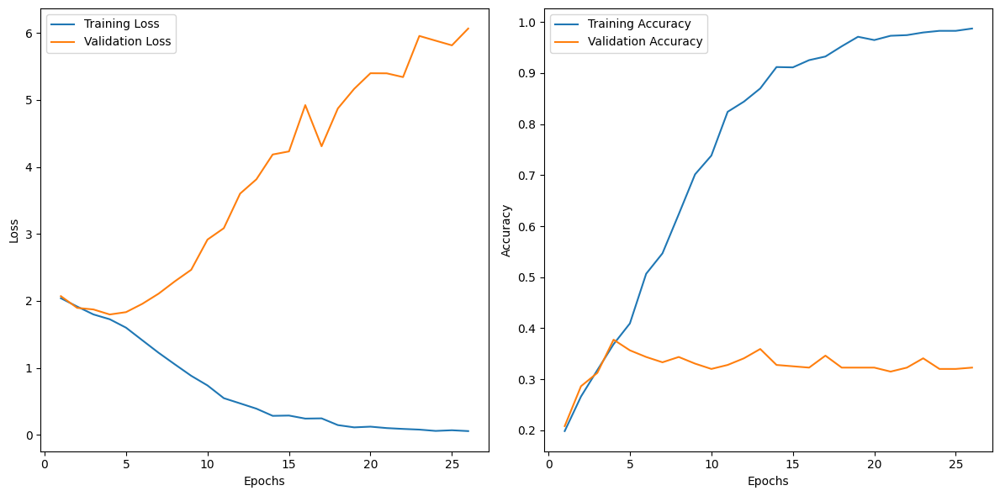

49/49 [==============================] - 5s 102ms/step - loss: 0.0583 - accuracy: 0.9871 - val_loss: 6.0651 - val_accuracy: 0.3229
Epoch 27/100
49/49 [==============================] - ETA: 0s - loss: 0.0562 - accuracy: 0.9884

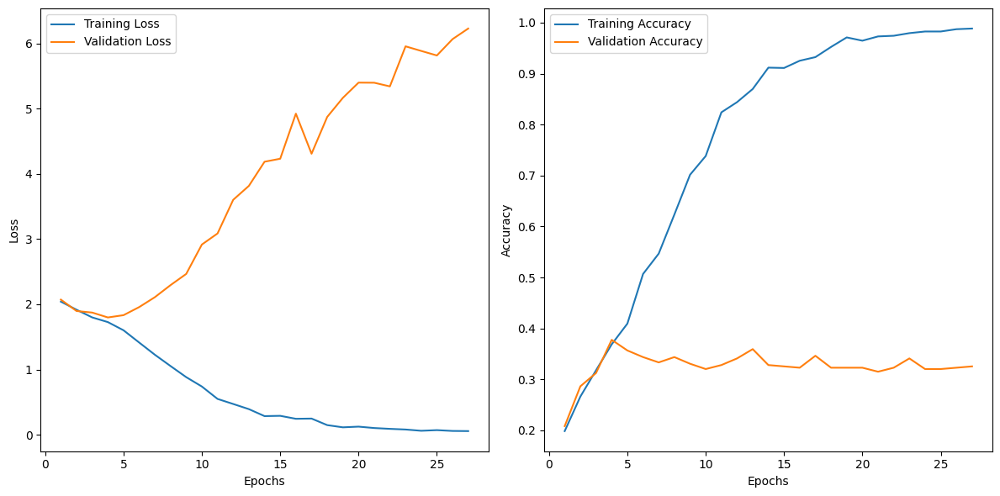

49/49 [==============================] - 5s 103ms/step - loss: 0.0562 - accuracy: 0.9884 - val_loss: 6.2274 - val_accuracy: 0.3255
Epoch 28/100
49/49 [==============================] - ETA: 0s - loss: 0.0806 - accuracy: 0.9794

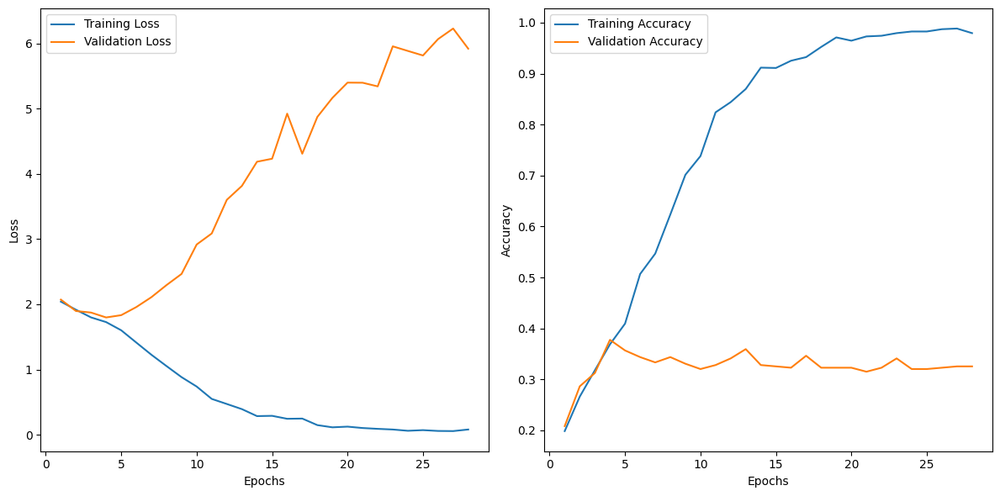

49/49 [==============================] - 5s 105ms/step - loss: 0.0806 - accuracy: 0.9794 - val_loss: 5.9188 - val_accuracy: 0.3255
Epoch 29/100
49/49 [==============================] - ETA: 0s - loss: 0.0715 - accuracy: 0.9807

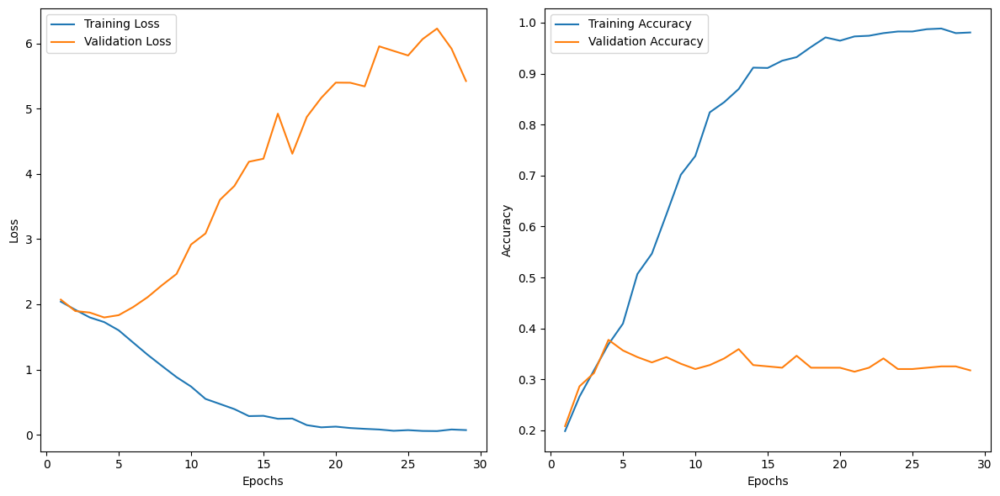

49/49 [==============================] - 5s 103ms/step - loss: 0.0715 - accuracy: 0.9807 - val_loss: 5.4225 - val_accuracy: 0.3177
Epoch 30/100
49/49 [==============================] - ETA: 0s - loss: 0.0457 - accuracy: 0.9884

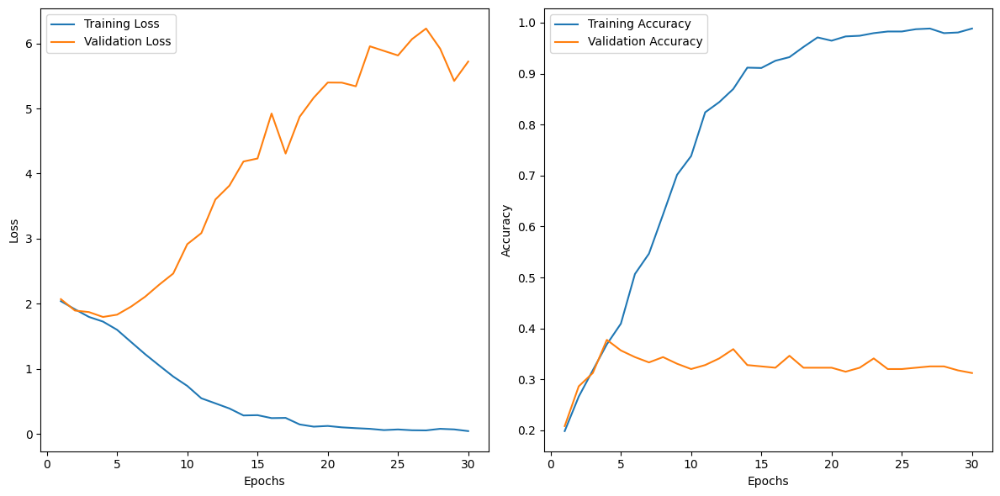

49/49 [==============================] - 5s 108ms/step - loss: 0.0457 - accuracy: 0.9884 - val_loss: 5.7202 - val_accuracy: 0.3125
Epoch 31/100
49/49 [==============================] - ETA: 0s - loss: 0.0851 - accuracy: 0.9807

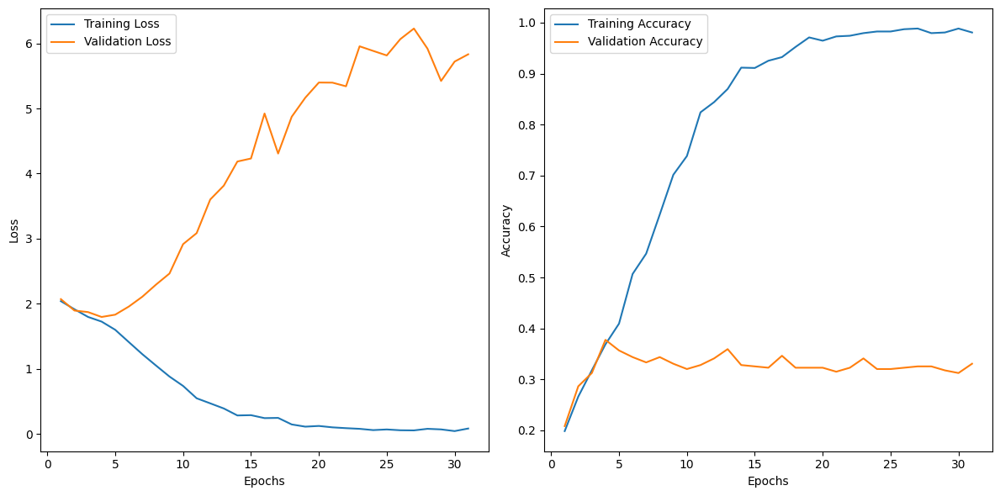

49/49 [==============================] - 5s 105ms/step - loss: 0.0851 - accuracy: 0.9807 - val_loss: 5.8317 - val_accuracy: 0.3307
Epoch 32/100
49/49 [==============================] - ETA: 0s - loss: 0.0533 - accuracy: 0.9890

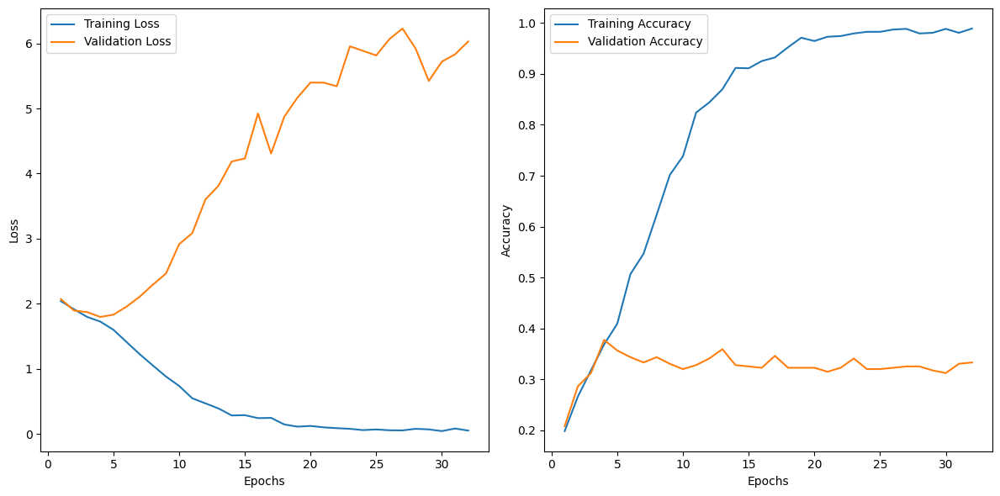

49/49 [==============================] - 5s 106ms/step - loss: 0.0533 - accuracy: 0.9890 - val_loss: 6.0285 - val_accuracy: 0.3333
Epoch 33/100
49/49 [==============================] - ETA: 0s - loss: 0.0481 - accuracy: 0.9884

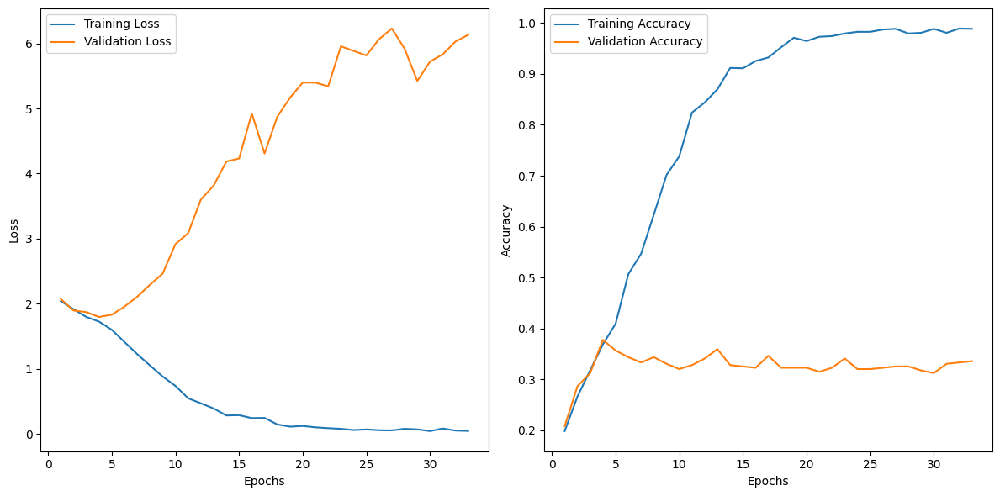

49/49 [==============================] - 5s 110ms/step - loss: 0.0481 - accuracy: 0.9884 - val_loss: 6.1305 - val_accuracy: 0.3359
Epoch 34/100
49/49 [==============================] - ETA: 0s - loss: 0.0775 - accuracy: 0.9809

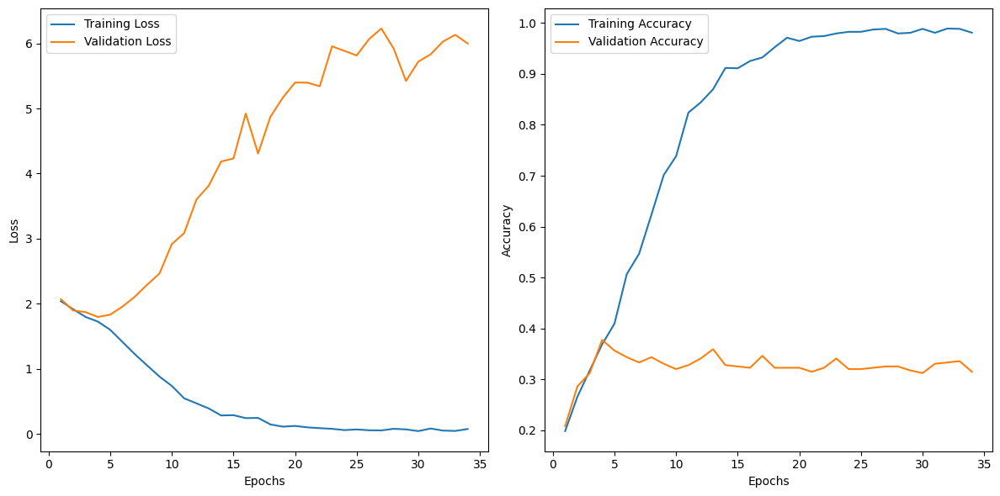

49/49 [==============================] - 6s 113ms/step - loss: 0.0775 - accuracy: 0.9809 - val_loss: 5.9976 - val_accuracy: 0.3151
Epoch 35/100
49/49 [==============================] - ETA: 0s - loss: 0.0648 - accuracy: 0.9884

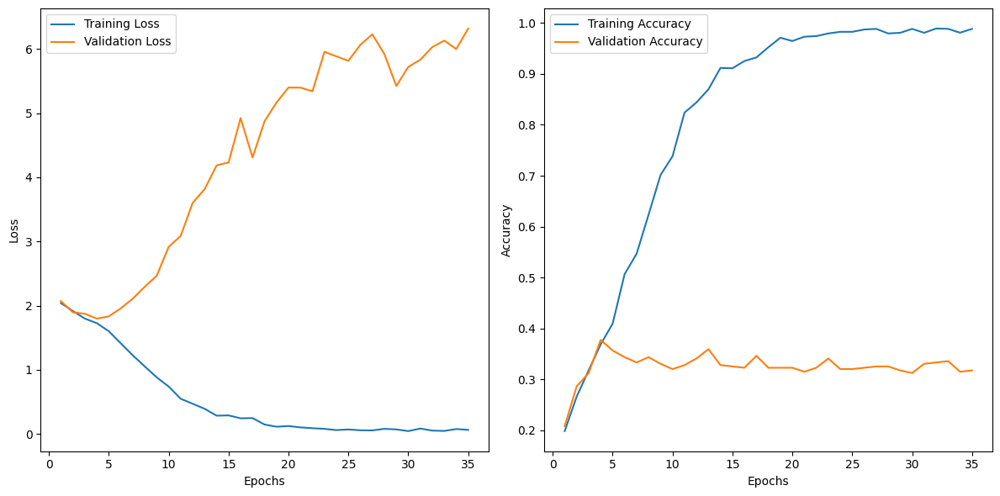

49/49 [==============================] - 6s 113ms/step - loss: 0.0648 - accuracy: 0.9884 - val_loss: 6.3175 - val_accuracy: 0.3177
Epoch 36/100
49/49 [==============================] - ETA: 0s - loss: 0.0498 - accuracy: 0.9858

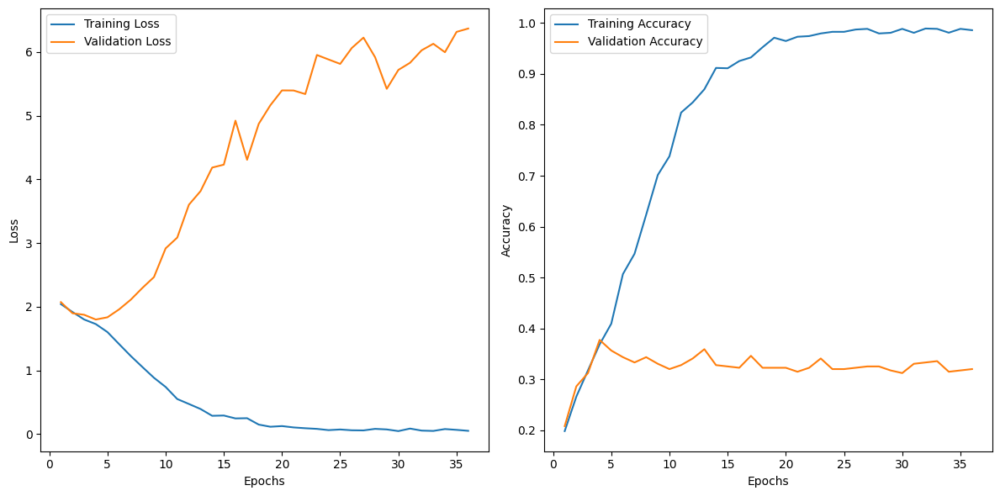

49/49 [==============================] - 6s 121ms/step - loss: 0.0498 - accuracy: 0.9858 - val_loss: 6.3700 - val_accuracy: 0.3203
Epoch 37/100
49/49 [==============================] - ETA: 0s - loss: 0.0425 - accuracy: 0.9903

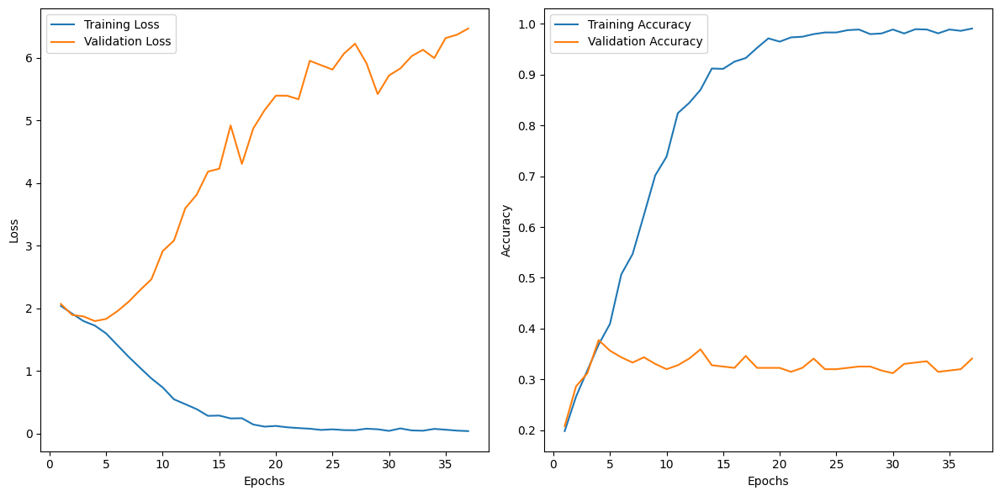

49/49 [==============================] - 6s 114ms/step - loss: 0.0425 - accuracy: 0.9903 - val_loss: 6.4694 - val_accuracy: 0.3411
Epoch 38/100
49/49 [==============================] - ETA: 0s - loss: 0.0403 - accuracy: 0.9890

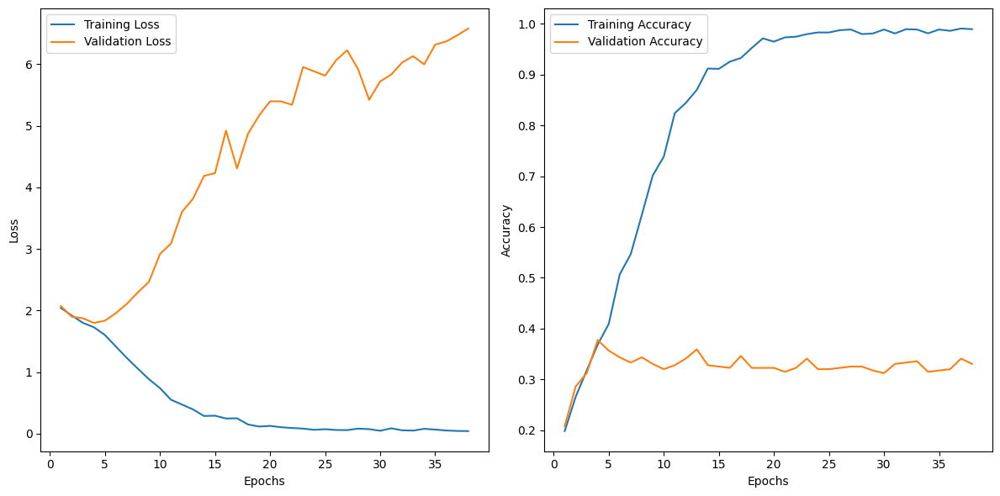

49/49 [==============================] - 6s 114ms/step - loss: 0.0403 - accuracy: 0.9890 - val_loss: 6.5797 - val_accuracy: 0.3307
Epoch 39/100
49/49 [==============================] - ETA: 0s - loss: 0.0410 - accuracy: 0.9865

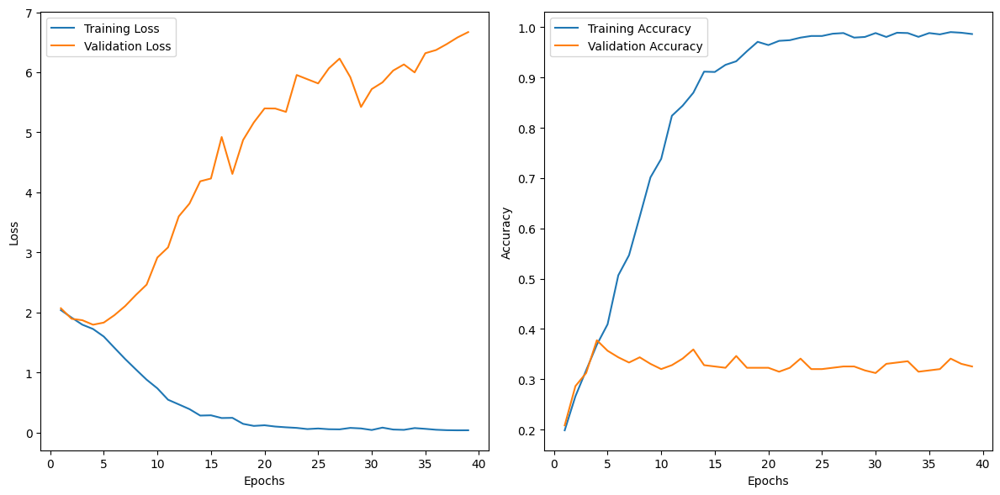

49/49 [==============================] - 5s 106ms/step - loss: 0.0410 - accuracy: 0.9865 - val_loss: 6.6687 - val_accuracy: 0.3255
Epoch 40/100
49/49 [==============================] - ETA: 0s - loss: 0.0601 - accuracy: 0.9884

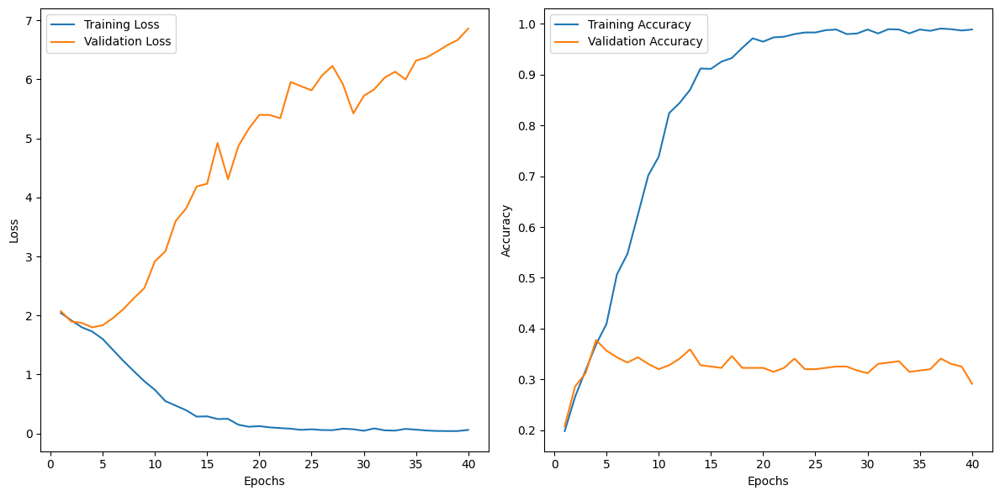

49/49 [==============================] - 5s 106ms/step - loss: 0.0601 - accuracy: 0.9884 - val_loss: 6.8613 - val_accuracy: 0.2917
Epoch 41/100
49/49 [==============================] - ETA: 0s - loss: 0.0407 - accuracy: 0.9884

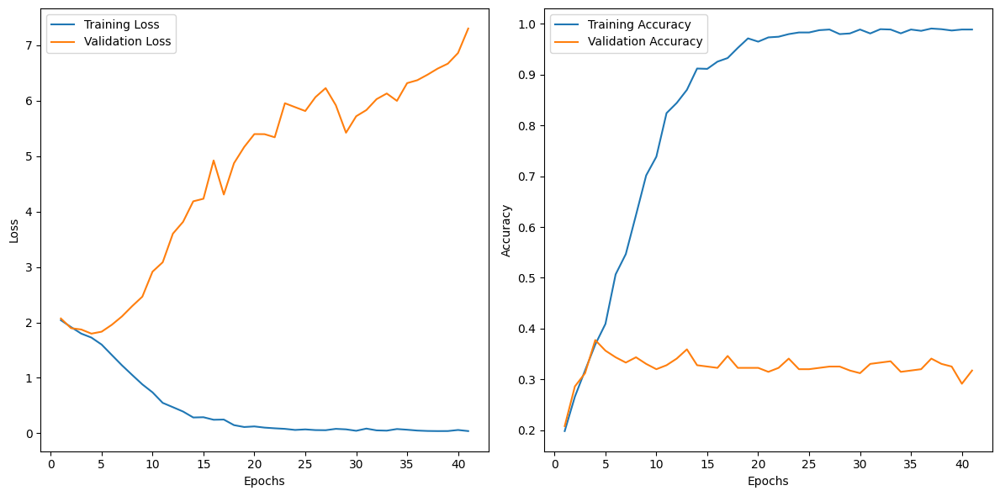

49/49 [==============================] - 5s 104ms/step - loss: 0.0407 - accuracy: 0.9884 - val_loss: 7.3022 - val_accuracy: 0.3177
Epoch 42/100
49/49 [==============================] - ETA: 0s - loss: 0.0498 - accuracy: 0.9884

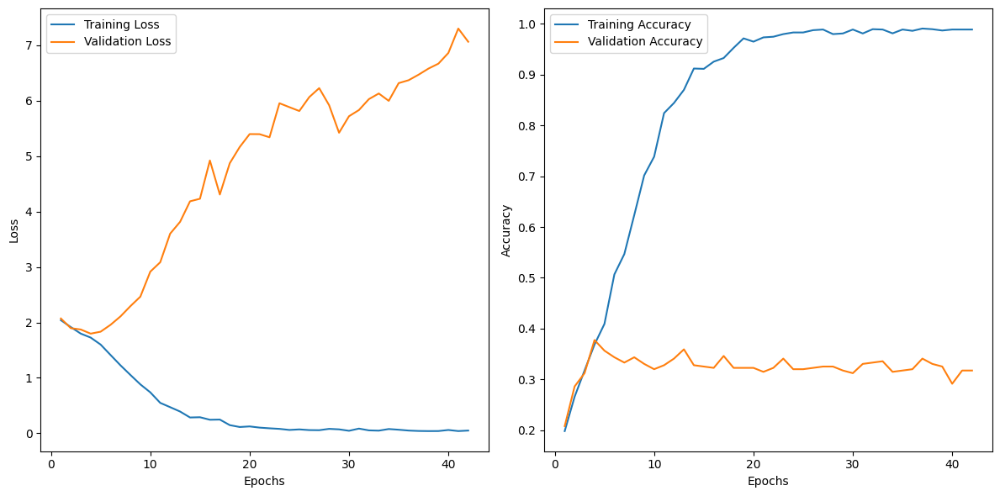

49/49 [==============================] - 5s 105ms/step - loss: 0.0498 - accuracy: 0.9884 - val_loss: 7.0640 - val_accuracy: 0.3177
Epoch 43/100
49/49 [==============================] - ETA: 0s - loss: 0.0246 - accuracy: 0.9948

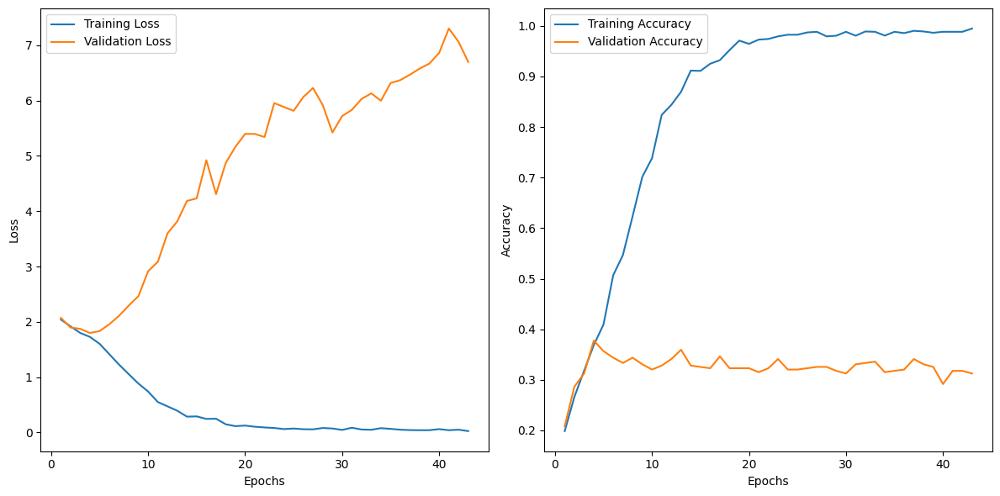

49/49 [==============================] - 5s 102ms/step - loss: 0.0246 - accuracy: 0.9948 - val_loss: 6.6976 - val_accuracy: 0.3125
Epoch 44/100
49/49 [==============================] - ETA: 0s - loss: 0.0272 - accuracy: 0.9923

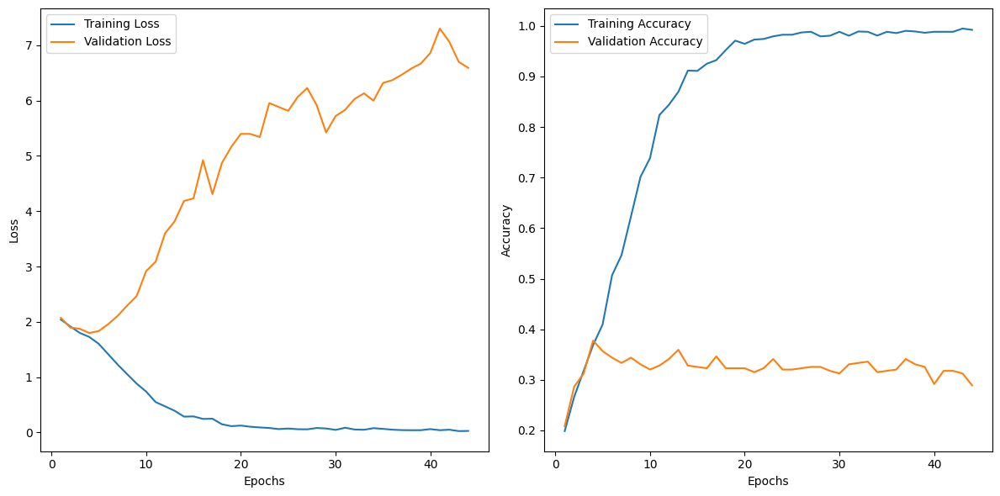

49/49 [==============================] - 5s 98ms/step - loss: 0.0272 - accuracy: 0.9923 - val_loss: 6.5920 - val_accuracy: 0.2891
Epoch 45/100
49/49 [==============================] - ETA: 0s - loss: 0.0398 - accuracy: 0.9897

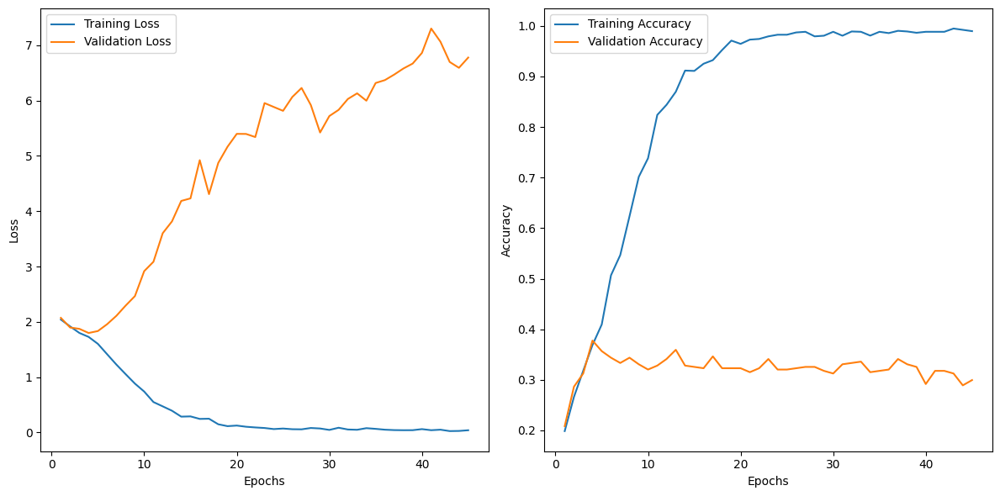

49/49 [==============================] - 5s 99ms/step - loss: 0.0398 - accuracy: 0.9897 - val_loss: 6.7775 - val_accuracy: 0.2995
Epoch 46/100
49/49 [==============================] - ETA: 0s - loss: 0.0234 - accuracy: 0.9942

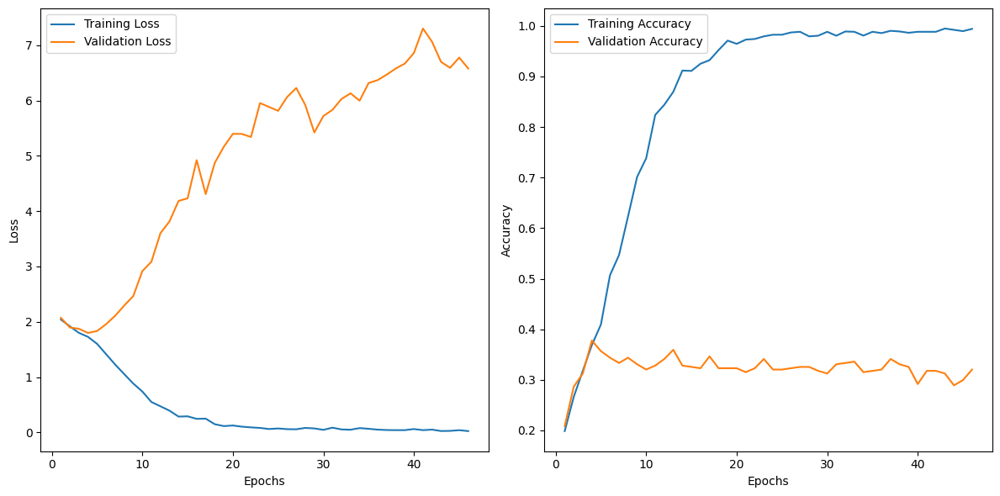

49/49 [==============================] - 5s 100ms/step - loss: 0.0234 - accuracy: 0.9942 - val_loss: 6.5801 - val_accuracy: 0.3203
Epoch 47/100
49/49 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9948

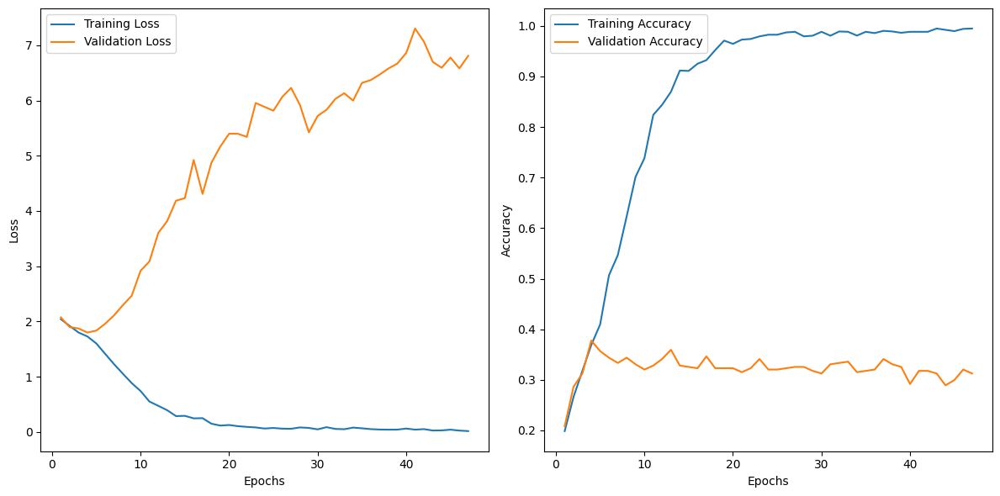

49/49 [==============================] - 5s 100ms/step - loss: 0.0143 - accuracy: 0.9948 - val_loss: 6.8085 - val_accuracy: 0.3125
Epoch 48/100
49/49 [==============================] - ETA: 0s - loss: 0.0350 - accuracy: 0.9884

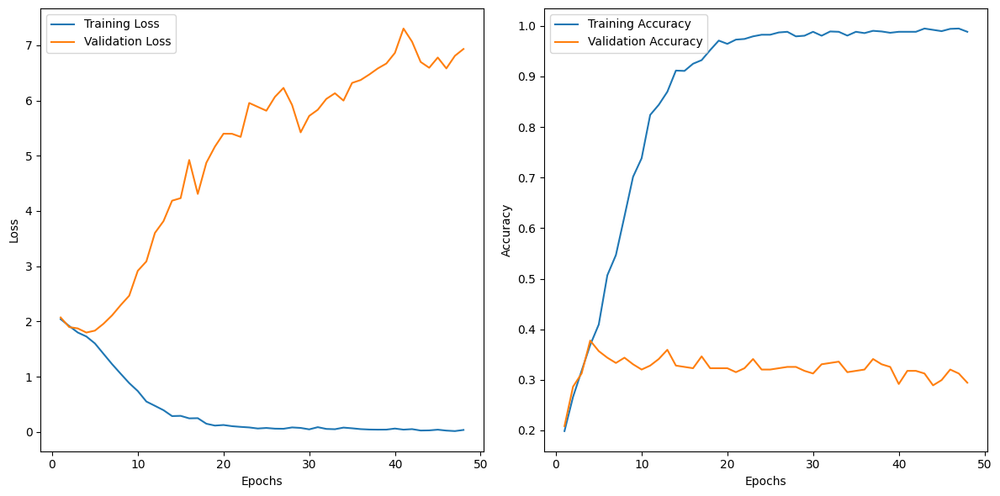

49/49 [==============================] - 5s 100ms/step - loss: 0.0350 - accuracy: 0.9884 - val_loss: 6.9321 - val_accuracy: 0.2943
Epoch 49/100
49/49 [==============================] - ETA: 0s - loss: 0.0452 - accuracy: 0.9903

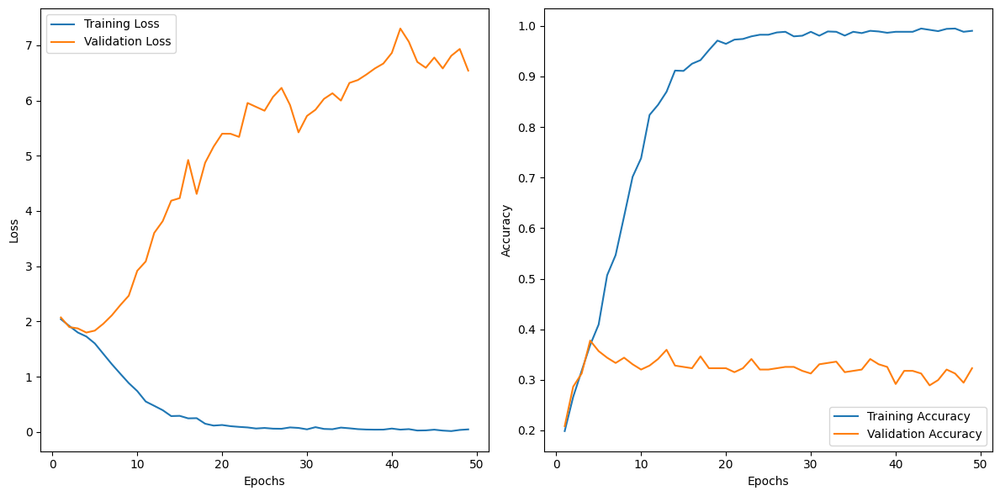

49/49 [==============================] - 5s 100ms/step - loss: 0.0452 - accuracy: 0.9903 - val_loss: 6.5406 - val_accuracy: 0.3229
Epoch 50/100
49/49 [==============================] - ETA: 0s - loss: 0.0605 - accuracy: 0.9807

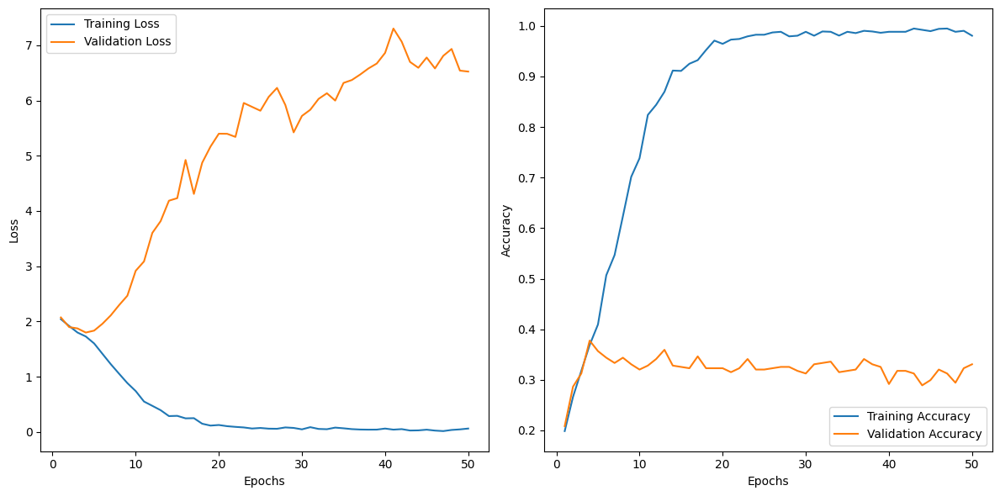

49/49 [==============================] - 5s 99ms/step - loss: 0.0605 - accuracy: 0.9807 - val_loss: 6.5232 - val_accuracy: 0.3307
Epoch 51/100
49/49 [==============================] - ETA: 0s - loss: 0.0367 - accuracy: 0.9884

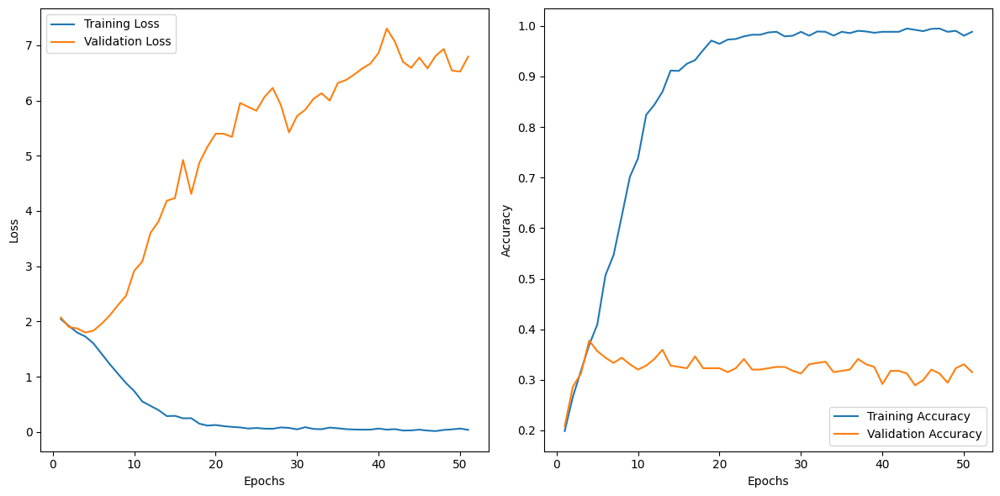

49/49 [==============================] - 5s 100ms/step - loss: 0.0367 - accuracy: 0.9884 - val_loss: 6.7942 - val_accuracy: 0.3151
Epoch 52/100
49/49 [==============================] - ETA: 0s - loss: 0.0265 - accuracy: 0.9903

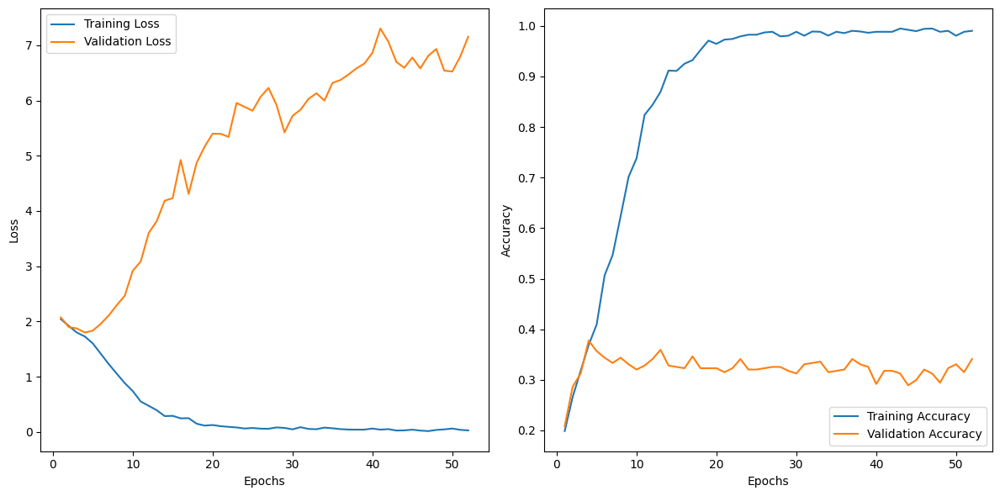

49/49 [==============================] - 5s 100ms/step - loss: 0.0265 - accuracy: 0.9903 - val_loss: 7.1540 - val_accuracy: 0.3411
Epoch 53/100
49/49 [==============================] - ETA: 0s - loss: 0.0132 - accuracy: 0.9974

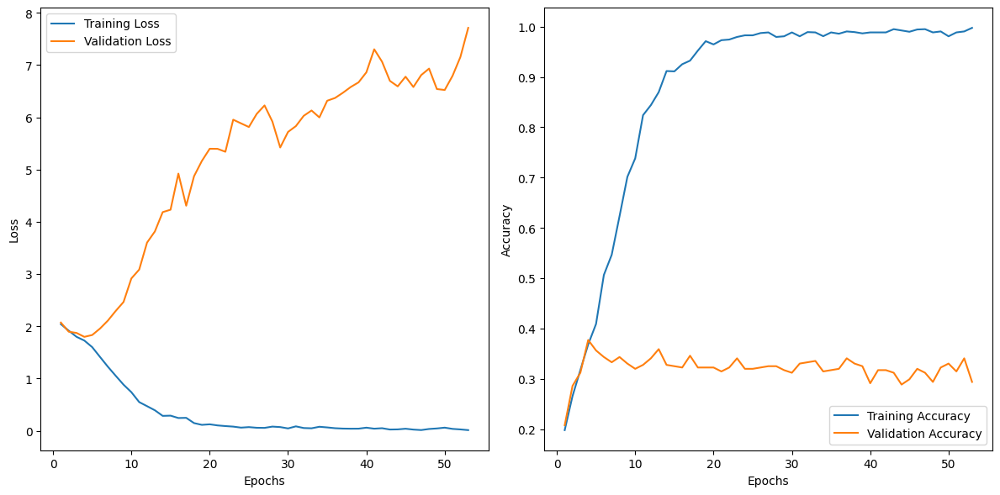

49/49 [==============================] - 5s 98ms/step - loss: 0.0132 - accuracy: 0.9974 - val_loss: 7.7118 - val_accuracy: 0.2943
Epoch 54/100
49/49 [==============================] - ETA: 0s - loss: 0.0406 - accuracy: 0.9916

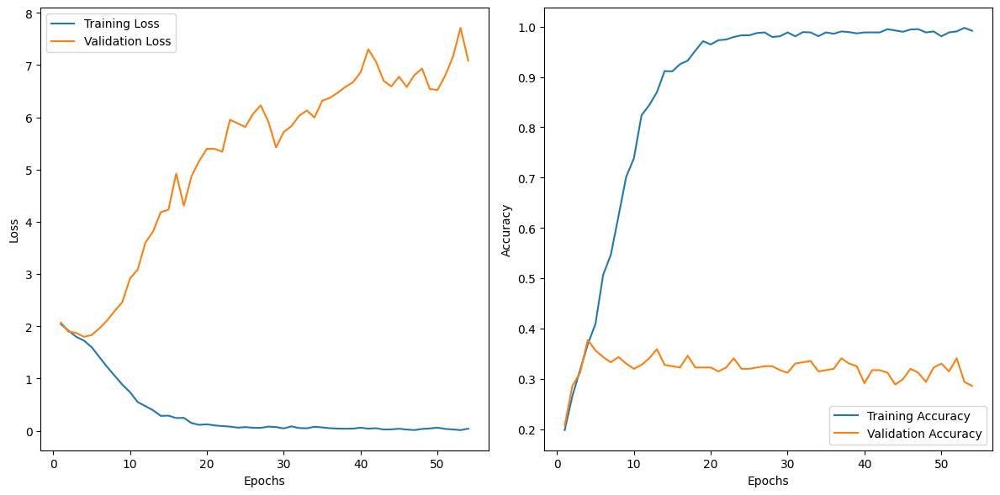

49/49 [==============================] - 5s 104ms/step - loss: 0.0406 - accuracy: 0.9916 - val_loss: 7.0862 - val_accuracy: 0.2865
Epoch 55/100
49/49 [==============================] - ETA: 0s - loss: 0.0189 - accuracy: 0.9955

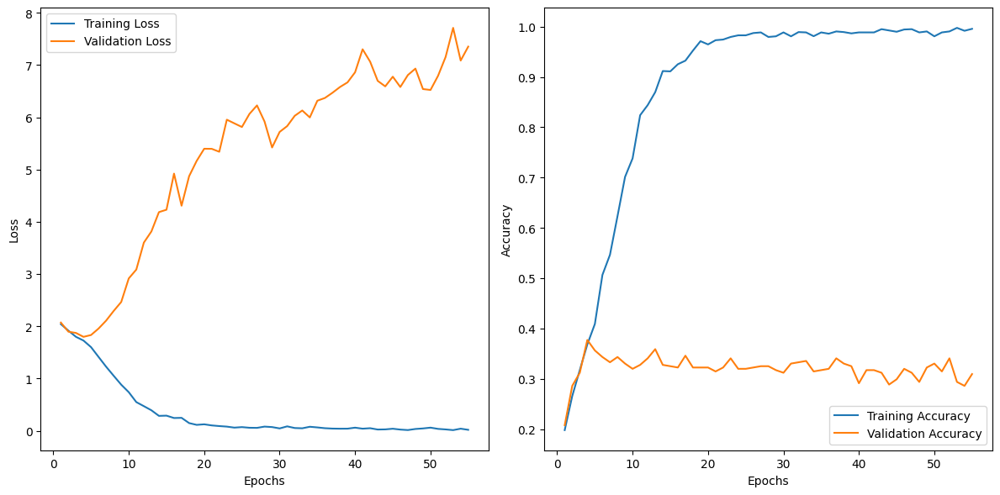

49/49 [==============================] - 5s 104ms/step - loss: 0.0189 - accuracy: 0.9955 - val_loss: 7.3526 - val_accuracy: 0.3099
Epoch 56/100
49/49 [==============================] - ETA: 0s - loss: 0.0258 - accuracy: 0.9948

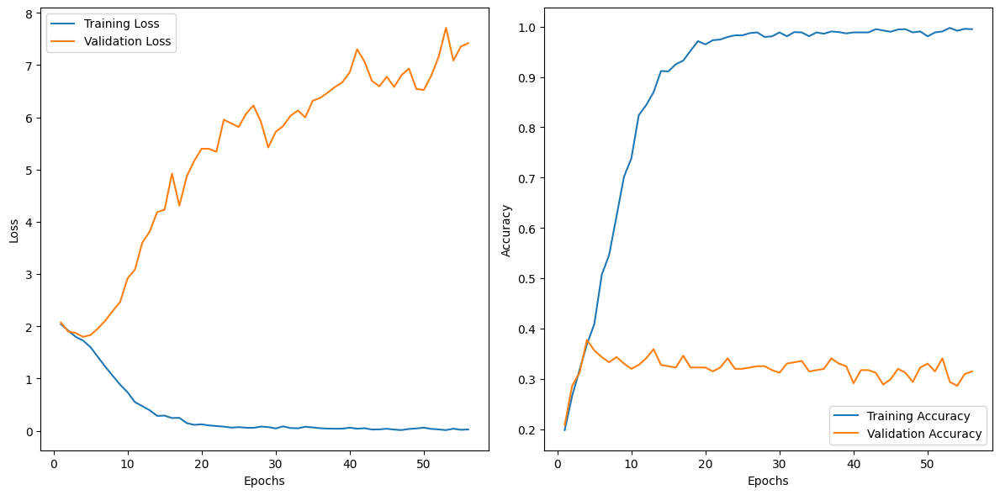

49/49 [==============================] - 5s 102ms/step - loss: 0.0258 - accuracy: 0.9948 - val_loss: 7.4195 - val_accuracy: 0.3151
Epoch 57/100
49/49 [==============================] - ETA: 0s - loss: 0.0331 - accuracy: 0.9955

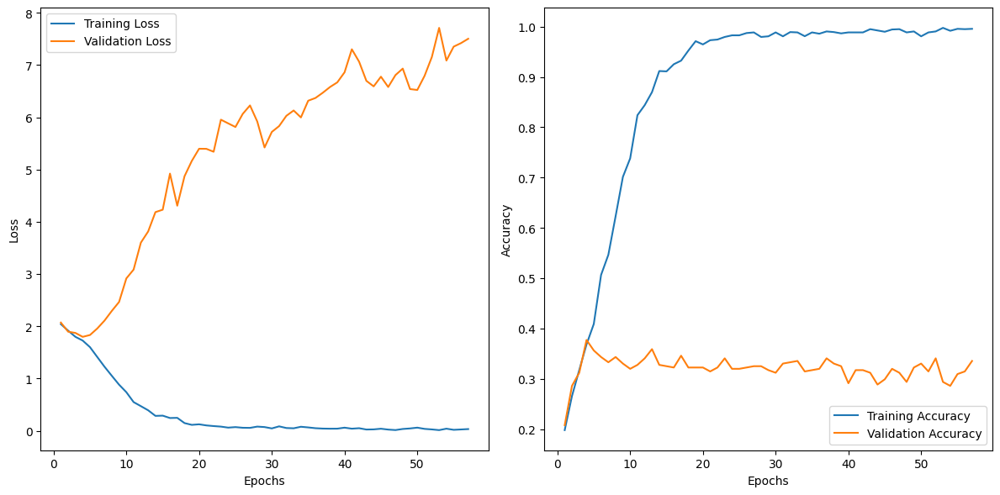

49/49 [==============================] - 5s 103ms/step - loss: 0.0331 - accuracy: 0.9955 - val_loss: 7.5033 - val_accuracy: 0.3359
Epoch 58/100
49/49 [==============================] - ETA: 0s - loss: 0.0453 - accuracy: 0.9929

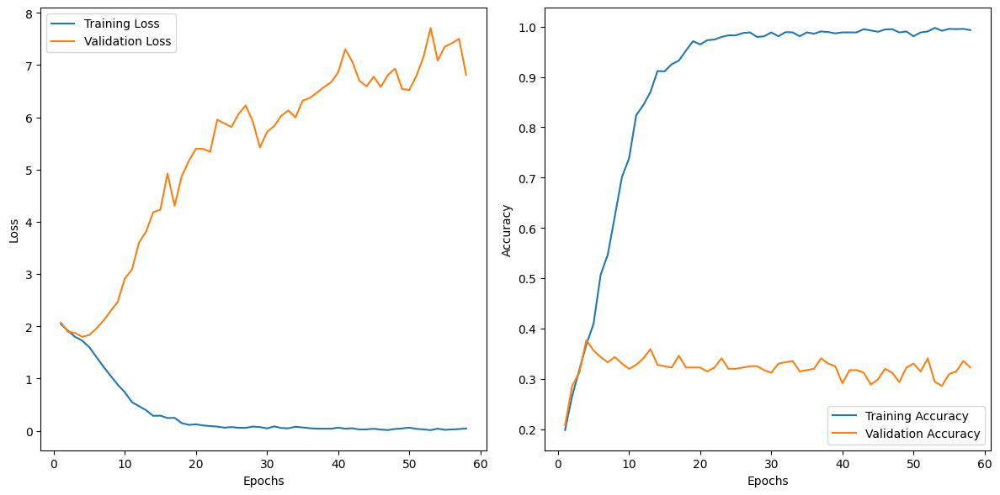

49/49 [==============================] - 5s 104ms/step - loss: 0.0453 - accuracy: 0.9929 - val_loss: 6.8110 - val_accuracy: 0.3229
Epoch 59/100
49/49 [==============================] - ETA: 0s - loss: 0.0150 - accuracy: 0.9961

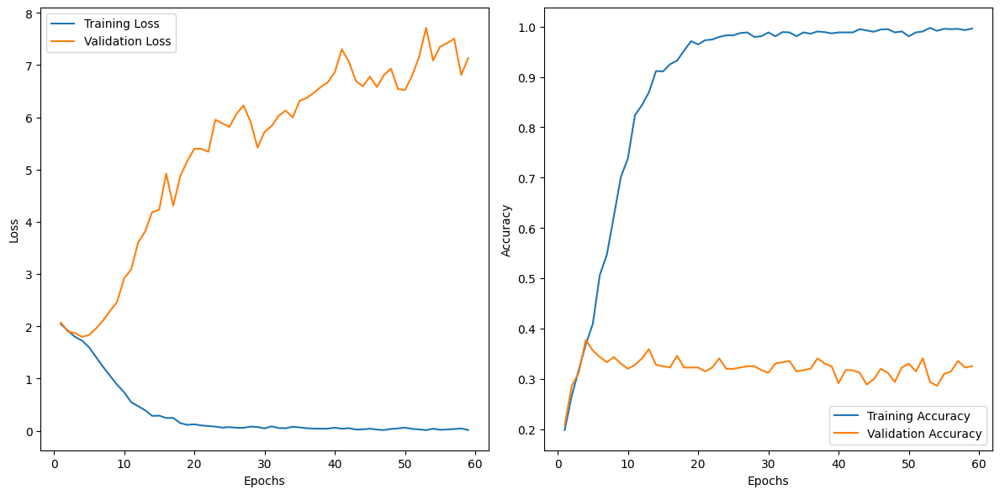

49/49 [==============================] - 5s 106ms/step - loss: 0.0150 - accuracy: 0.9961 - val_loss: 7.1343 - val_accuracy: 0.3255
Epoch 60/100
49/49 [==============================] - ETA: 0s - loss: 0.0103 - accuracy: 0.9955

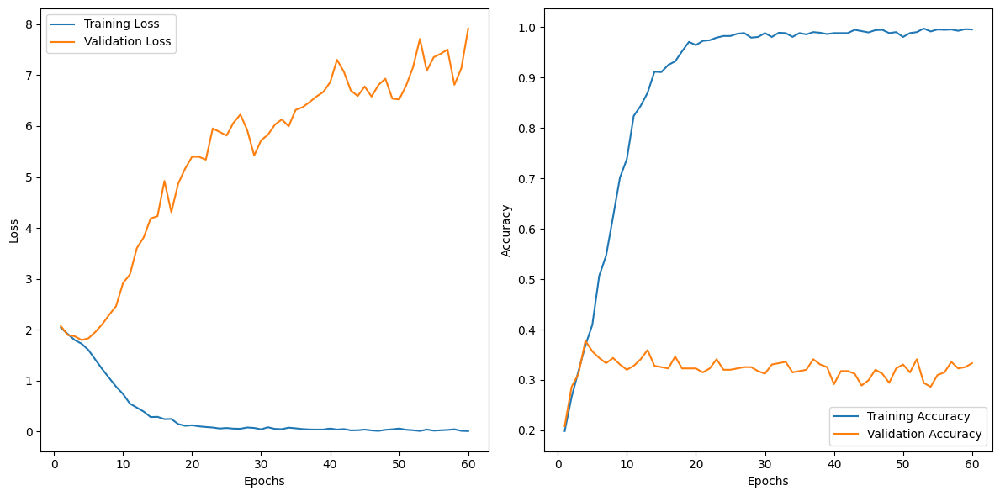

49/49 [==============================] - 5s 103ms/step - loss: 0.0103 - accuracy: 0.9955 - val_loss: 7.9160 - val_accuracy: 0.3333
Epoch 61/100
49/49 [==============================] - ETA: 0s - loss: 0.0218 - accuracy: 0.9942

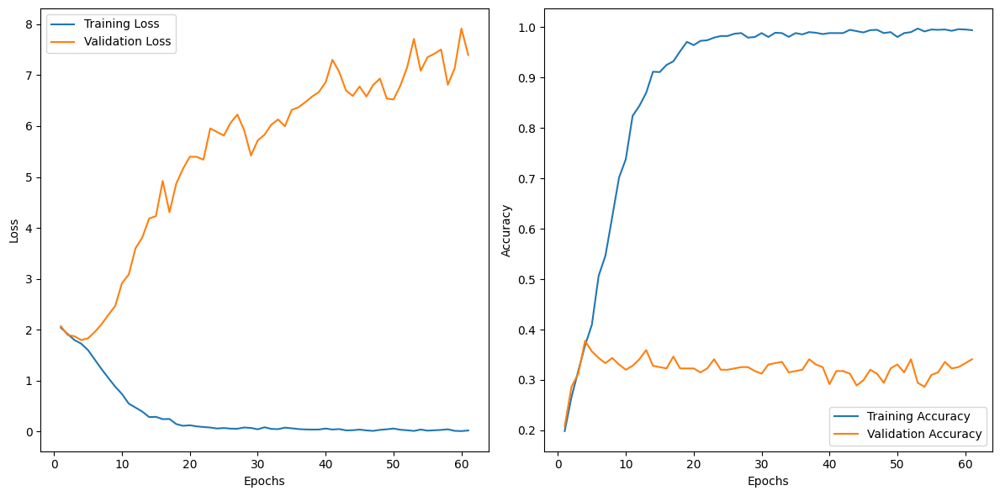

49/49 [==============================] - 5s 105ms/step - loss: 0.0218 - accuracy: 0.9942 - val_loss: 7.3970 - val_accuracy: 0.3411
Epoch 62/100
49/49 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 0.9987

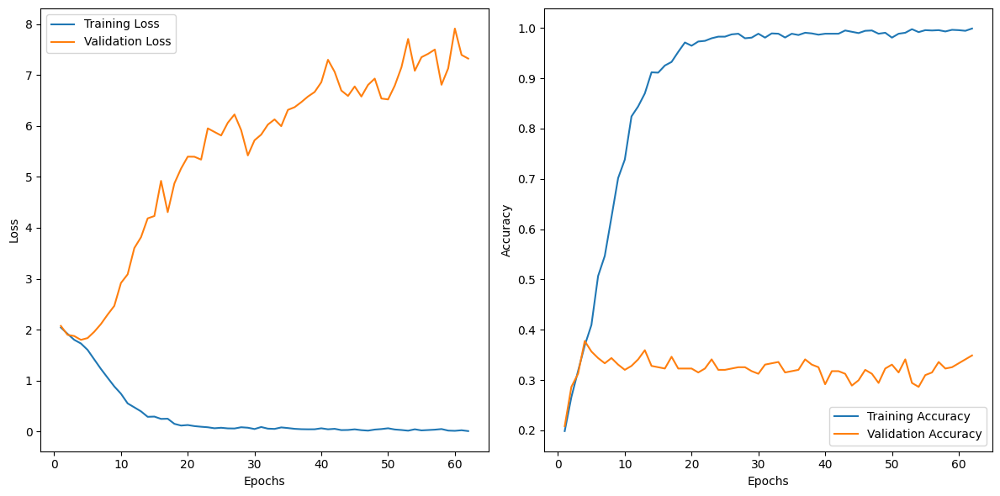

49/49 [==============================] - 5s 103ms/step - loss: 0.0052 - accuracy: 0.9987 - val_loss: 7.3259 - val_accuracy: 0.3490
Epoch 63/100
49/49 [==============================] - ETA: 0s - loss: 0.0160 - accuracy: 0.9942

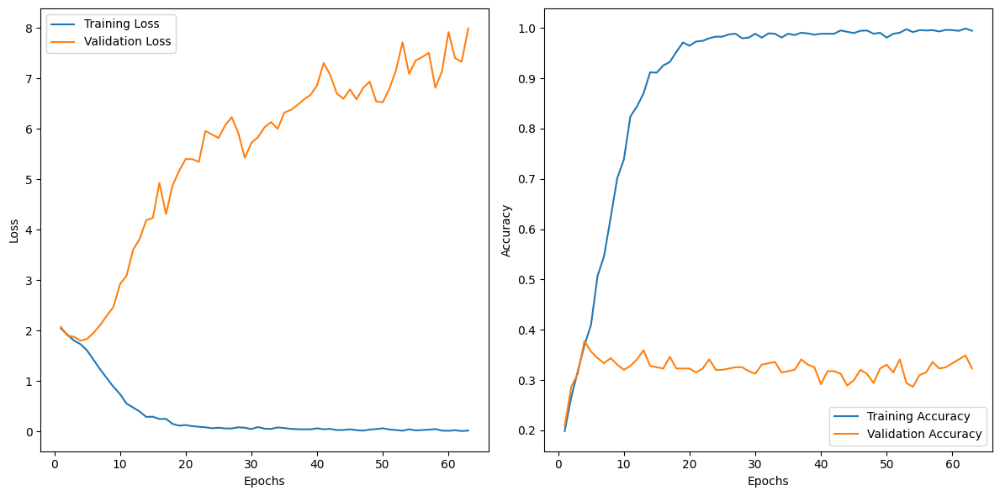

49/49 [==============================] - 5s 103ms/step - loss: 0.0160 - accuracy: 0.9942 - val_loss: 7.9850 - val_accuracy: 0.3229
Epoch 64/100
49/49 [==============================] - ETA: 0s - loss: 0.0357 - accuracy: 0.9936

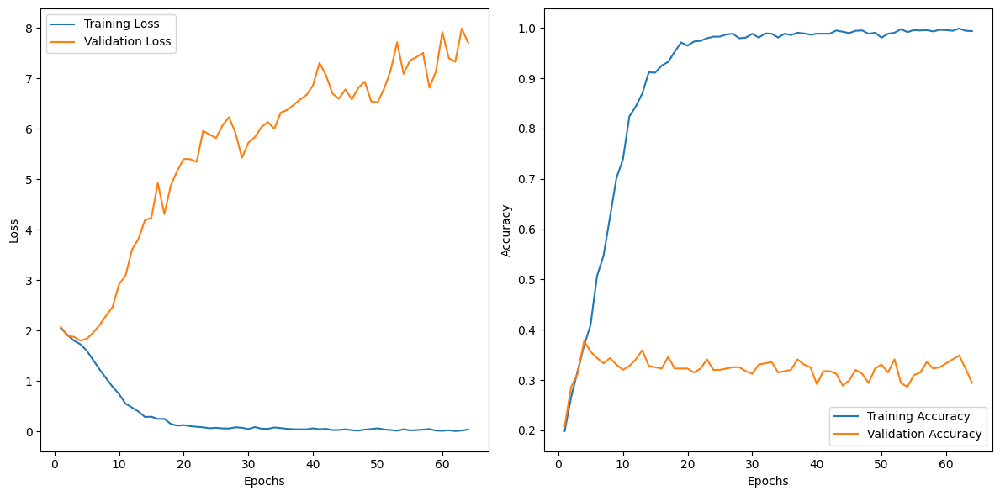

49/49 [==============================] - 5s 102ms/step - loss: 0.0357 - accuracy: 0.9936 - val_loss: 7.7027 - val_accuracy: 0.2943
Epoch 65/100
49/49 [==============================] - ETA: 0s - loss: 0.0174 - accuracy: 0.9942

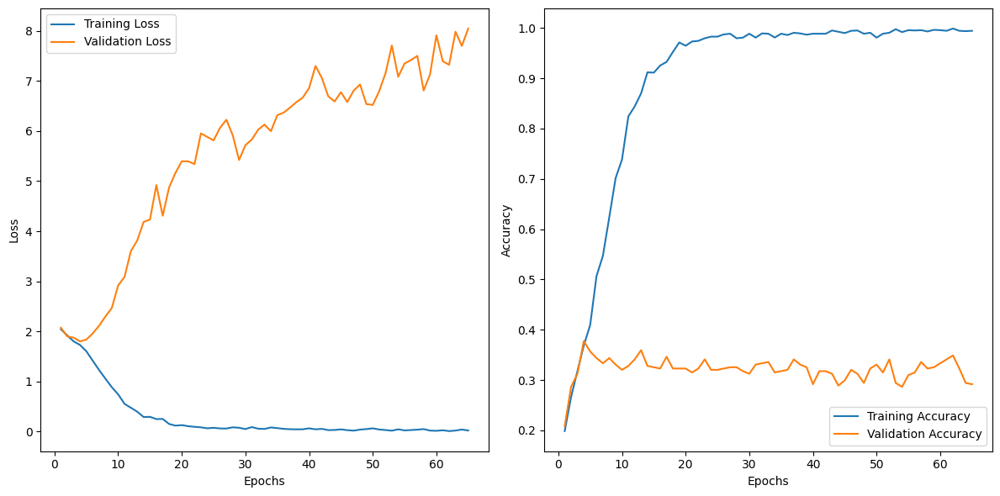

49/49 [==============================] - 5s 102ms/step - loss: 0.0174 - accuracy: 0.9942 - val_loss: 8.0500 - val_accuracy: 0.2917
Epoch 66/100
49/49 [==============================] - ETA: 0s - loss: 0.0172 - accuracy: 0.9961

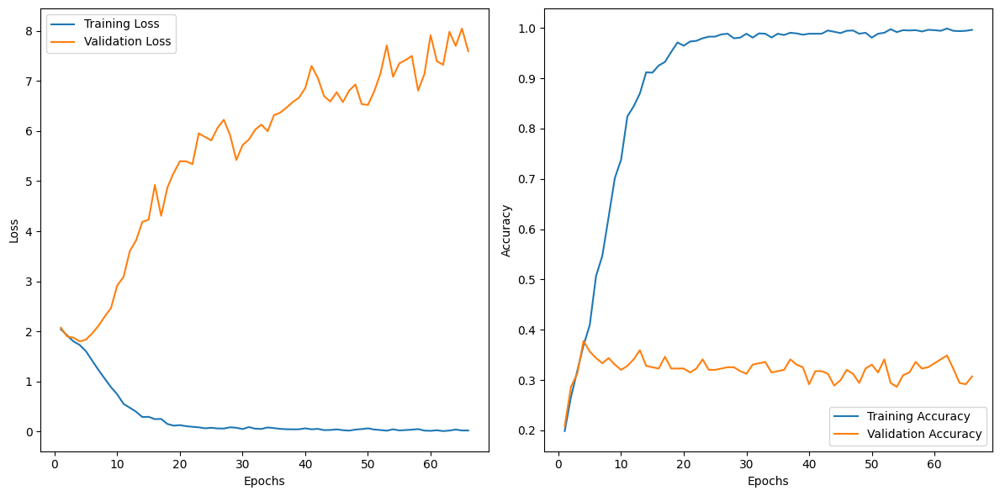

49/49 [==============================] - 5s 103ms/step - loss: 0.0172 - accuracy: 0.9961 - val_loss: 7.5989 - val_accuracy: 0.3073
Epoch 67/100
49/49 [==============================] - ETA: 0s - loss: 0.0113 - accuracy: 0.9955

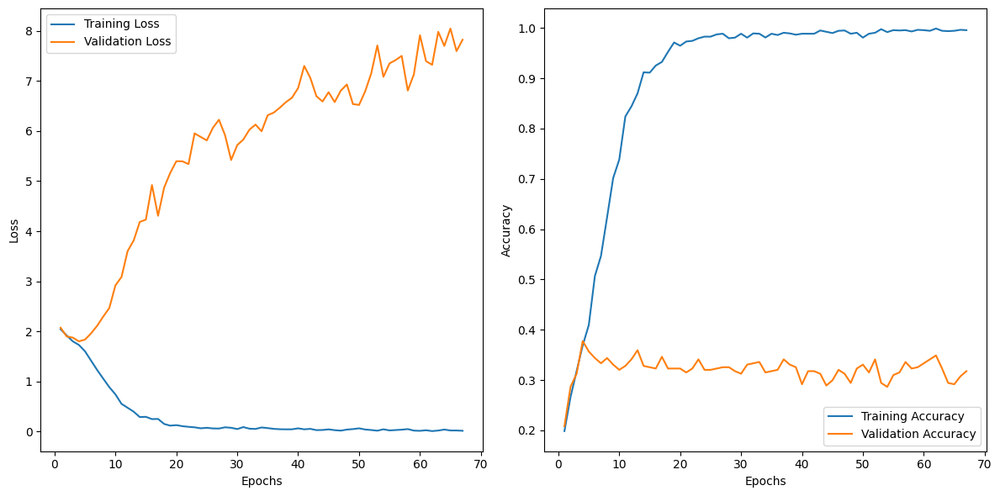

49/49 [==============================] - 5s 111ms/step - loss: 0.0113 - accuracy: 0.9955 - val_loss: 7.8265 - val_accuracy: 0.3177
Epoch 68/100
49/49 [==============================] - ETA: 0s - loss: 0.0091 - accuracy: 0.9968

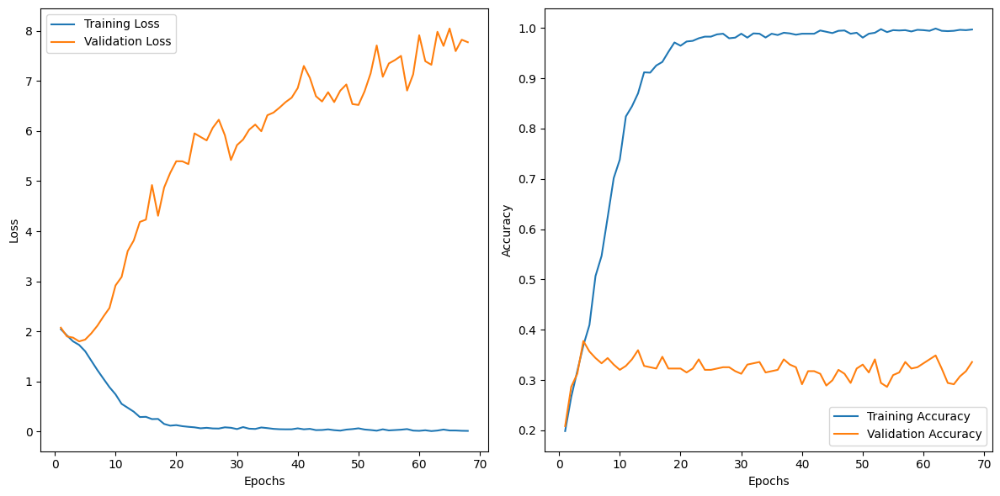

49/49 [==============================] - 5s 106ms/step - loss: 0.0091 - accuracy: 0.9968 - val_loss: 7.7767 - val_accuracy: 0.3359
Epoch 69/100
49/49 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 0.9987

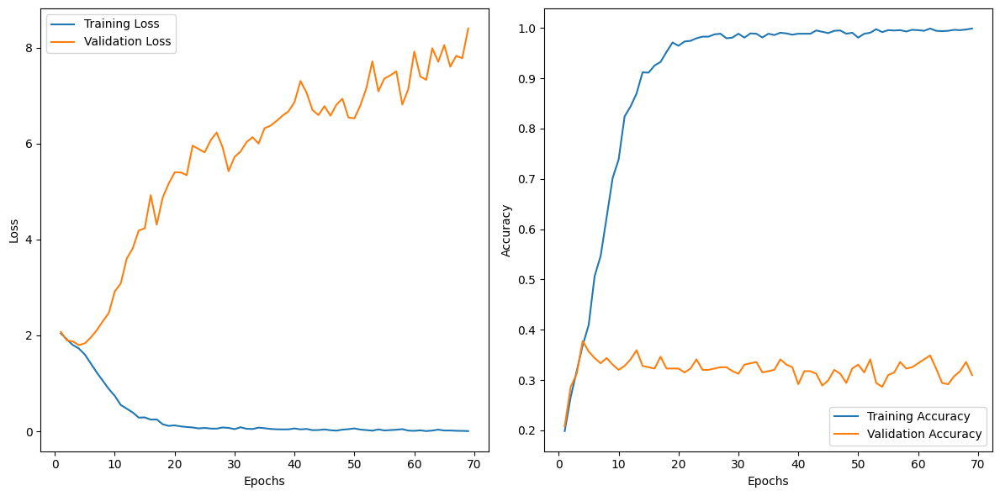

49/49 [==============================] - 5s 100ms/step - loss: 0.0058 - accuracy: 0.9987 - val_loss: 8.3954 - val_accuracy: 0.3099
Epoch 70/100
49/49 [==============================] - ETA: 0s - loss: 0.0154 - accuracy: 0.9968

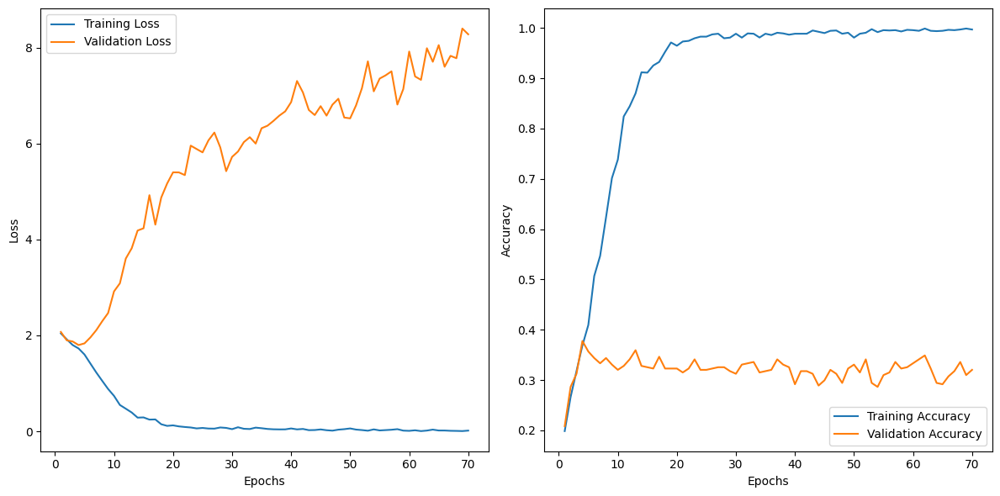

49/49 [==============================] - 5s 101ms/step - loss: 0.0154 - accuracy: 0.9968 - val_loss: 8.2754 - val_accuracy: 0.3203
Epoch 71/100
49/49 [==============================] - ETA: 0s - loss: 0.0225 - accuracy: 0.9955

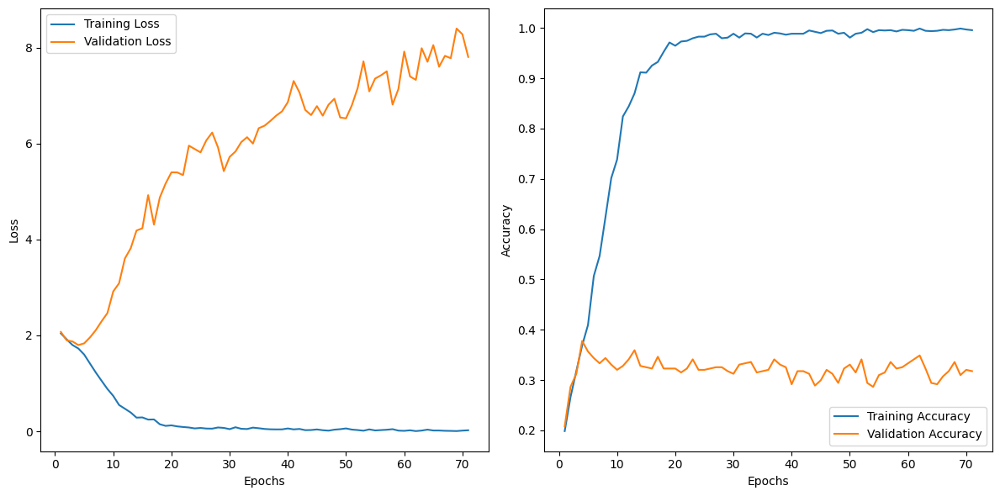

49/49 [==============================] - 5s 101ms/step - loss: 0.0225 - accuracy: 0.9955 - val_loss: 7.8037 - val_accuracy: 0.3177
Epoch 72/100
49/49 [==============================] - ETA: 0s - loss: 0.0131 - accuracy: 0.9968

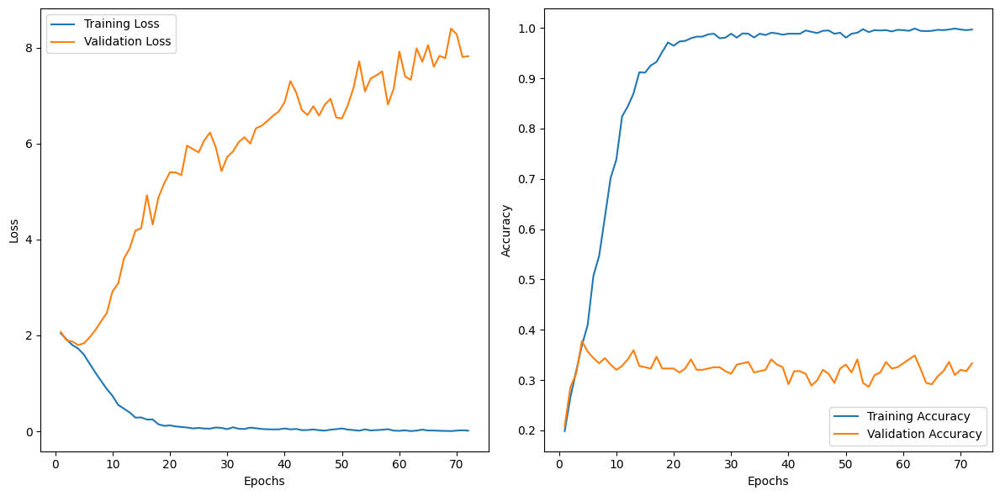

49/49 [==============================] - 5s 101ms/step - loss: 0.0131 - accuracy: 0.9968 - val_loss: 7.8180 - val_accuracy: 0.3333
Epoch 73/100
49/49 [==============================] - ETA: 0s - loss: 0.0086 - accuracy: 0.9968

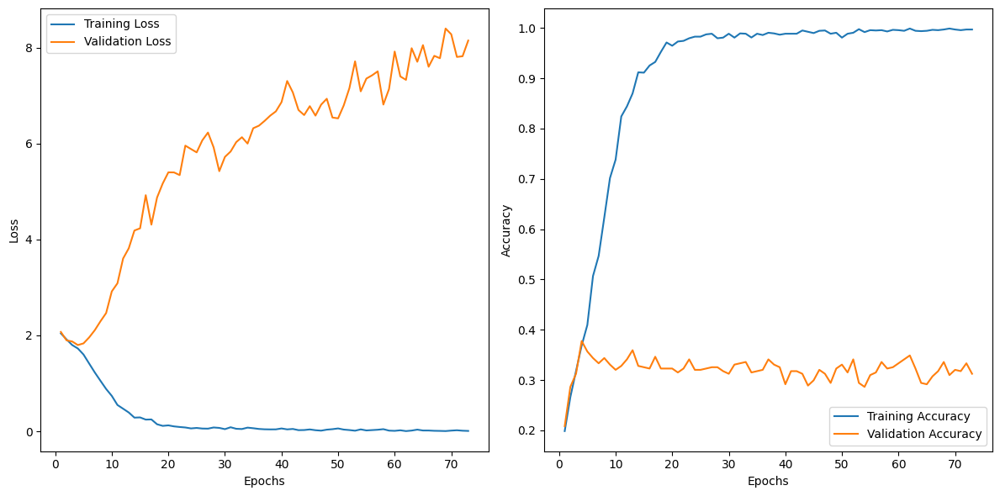

49/49 [==============================] - 5s 101ms/step - loss: 0.0086 - accuracy: 0.9968 - val_loss: 8.1448 - val_accuracy: 0.3125
Epoch 74/100
49/49 [==============================] - ETA: 0s - loss: 0.0570 - accuracy: 0.9884

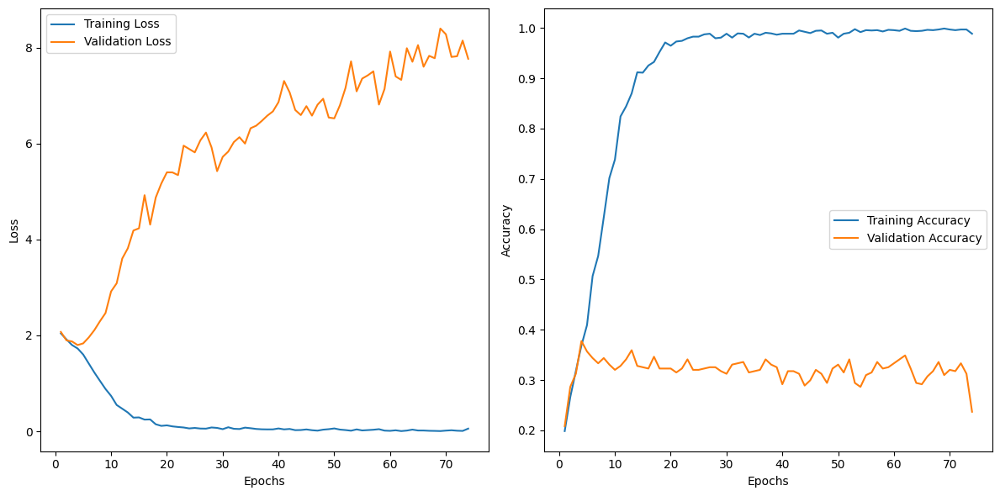

49/49 [==============================] - 5s 104ms/step - loss: 0.0570 - accuracy: 0.9884 - val_loss: 7.7649 - val_accuracy: 0.2370
Epoch 75/100
49/49 [==============================] - ETA: 0s - loss: 0.0699 - accuracy: 0.9839

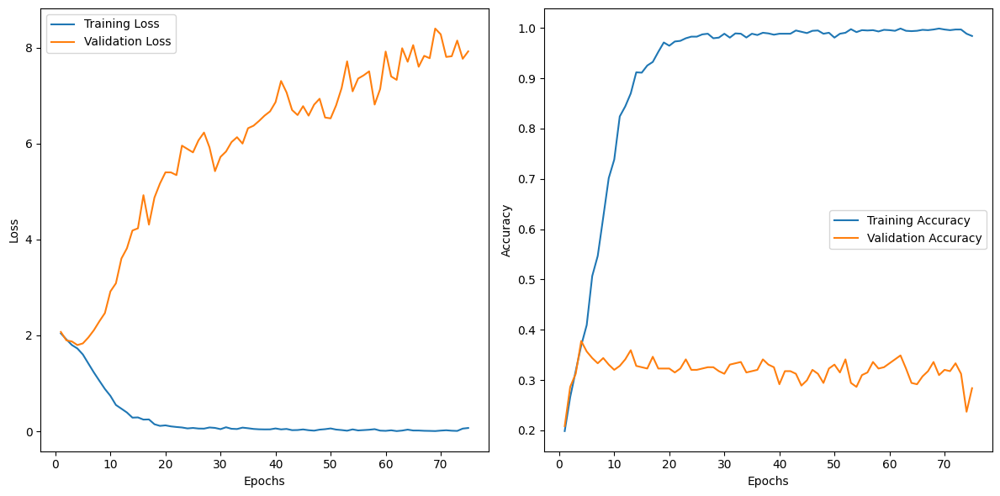

49/49 [==============================] - 6s 112ms/step - loss: 0.0699 - accuracy: 0.9839 - val_loss: 7.9196 - val_accuracy: 0.2839
Epoch 76/100
49/49 [==============================] - ETA: 0s - loss: 0.0693 - accuracy: 0.9852

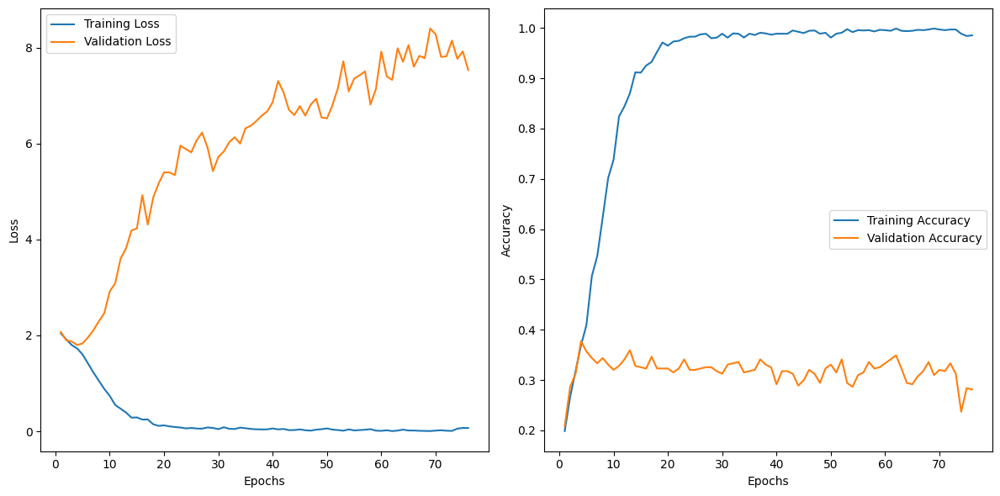

49/49 [==============================] - 5s 111ms/step - loss: 0.0693 - accuracy: 0.9852 - val_loss: 7.5312 - val_accuracy: 0.2812
Epoch 77/100
49/49 [==============================] - ETA: 0s - loss: 0.0481 - accuracy: 0.9890

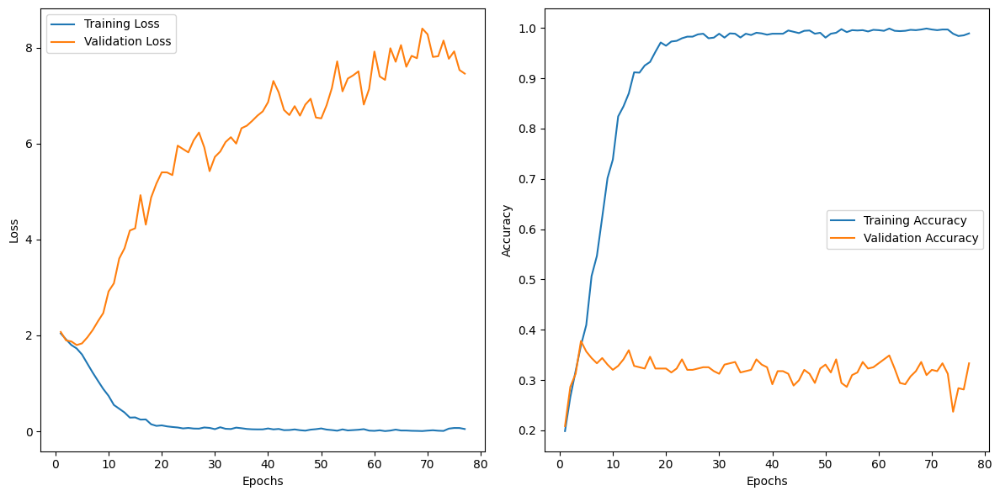

49/49 [==============================] - 5s 108ms/step - loss: 0.0481 - accuracy: 0.9890 - val_loss: 7.4554 - val_accuracy: 0.3333
Epoch 78/100
49/49 [==============================] - ETA: 0s - loss: 0.0361 - accuracy: 0.9897

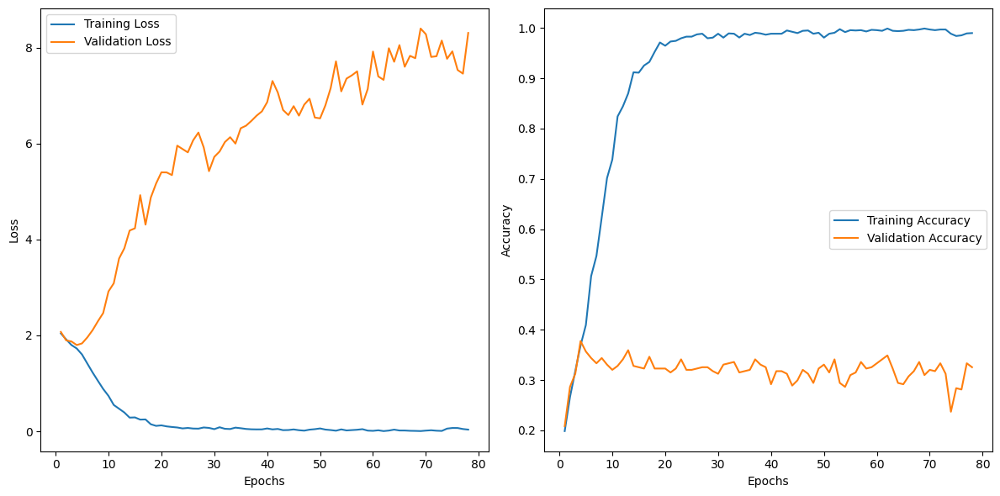

49/49 [==============================] - 5s 100ms/step - loss: 0.0361 - accuracy: 0.9897 - val_loss: 8.3035 - val_accuracy: 0.3255
Epoch 79/100
49/49 [==============================] - ETA: 0s - loss: 0.0145 - accuracy: 0.9948

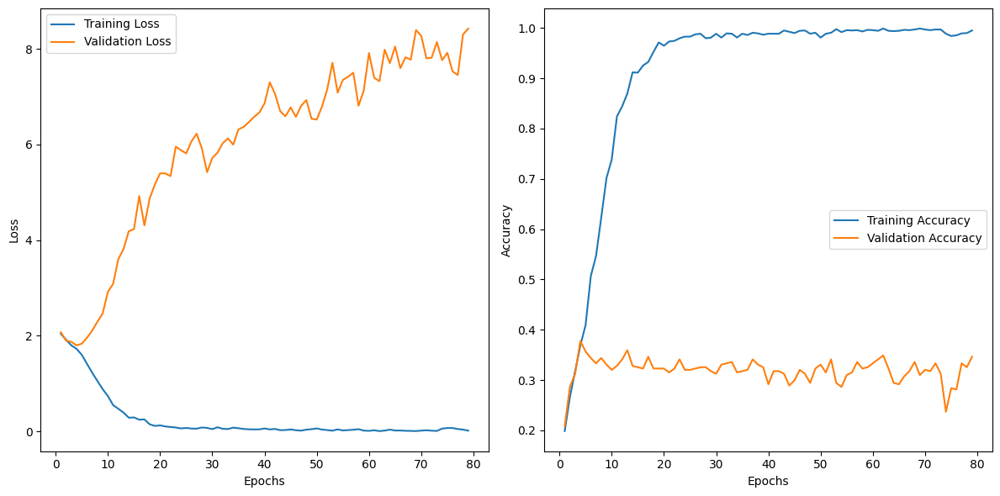

49/49 [==============================] - 5s 105ms/step - loss: 0.0145 - accuracy: 0.9948 - val_loss: 8.4278 - val_accuracy: 0.3464
Epoch 80/100
49/49 [==============================] - ETA: 0s - loss: 0.0277 - accuracy: 0.9916

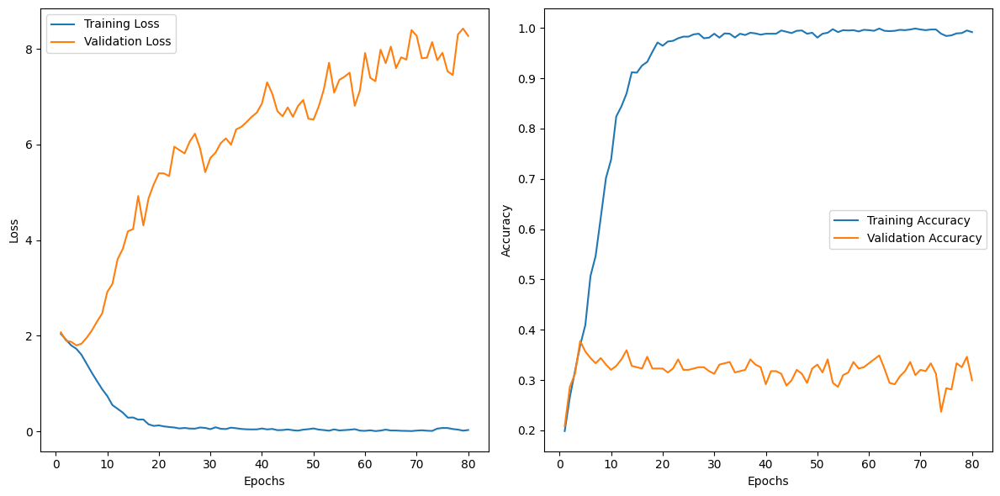

49/49 [==============================] - 5s 97ms/step - loss: 0.0277 - accuracy: 0.9916 - val_loss: 8.2722 - val_accuracy: 0.2995
Epoch 81/100
49/49 [==============================] - ETA: 0s - loss: 0.0400 - accuracy: 0.9903

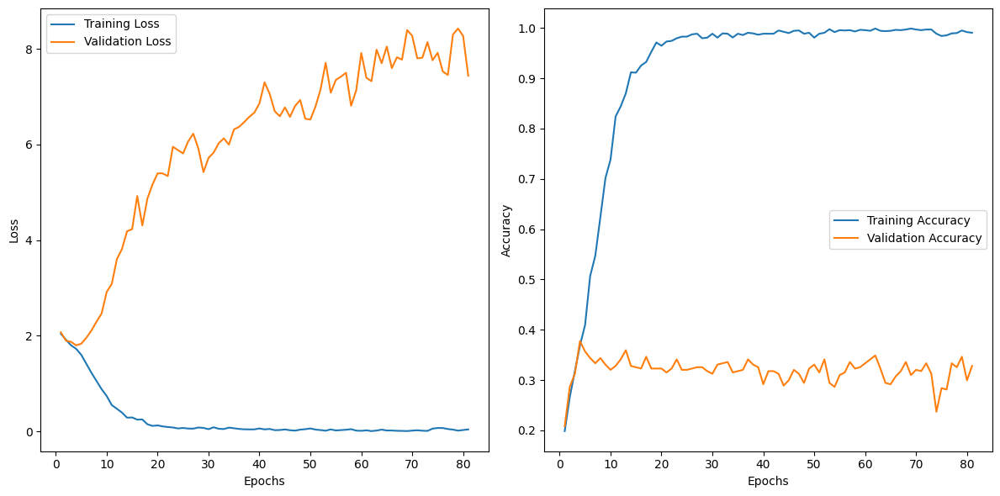

49/49 [==============================] - 5s 98ms/step - loss: 0.0400 - accuracy: 0.9903 - val_loss: 7.4393 - val_accuracy: 0.3281
Epoch 82/100
49/49 [==============================] - ETA: 0s - loss: 0.0635 - accuracy: 0.9852

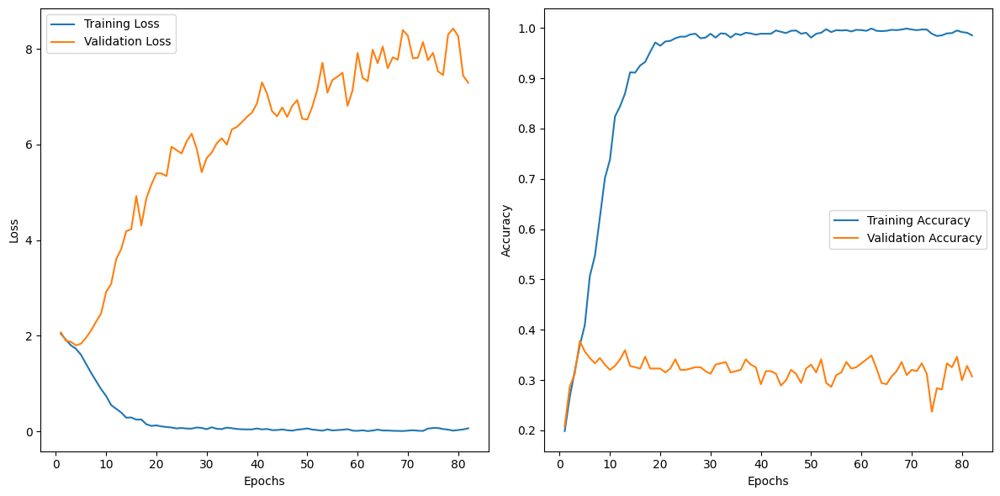

49/49 [==============================] - 5s 99ms/step - loss: 0.0635 - accuracy: 0.9852 - val_loss: 7.2939 - val_accuracy: 0.3073
Epoch 83/100
49/49 [==============================] - ETA: 0s - loss: 0.0364 - accuracy: 0.9916

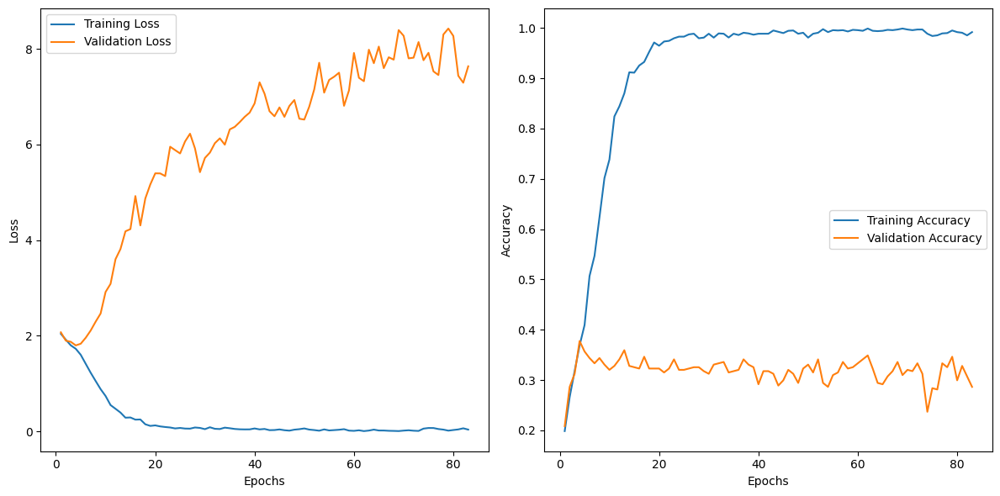

49/49 [==============================] - 5s 108ms/step - loss: 0.0364 - accuracy: 0.9916 - val_loss: 7.6373 - val_accuracy: 0.2865
Epoch 84/100
49/49 [==============================] - ETA: 0s - loss: 0.0151 - accuracy: 0.9961

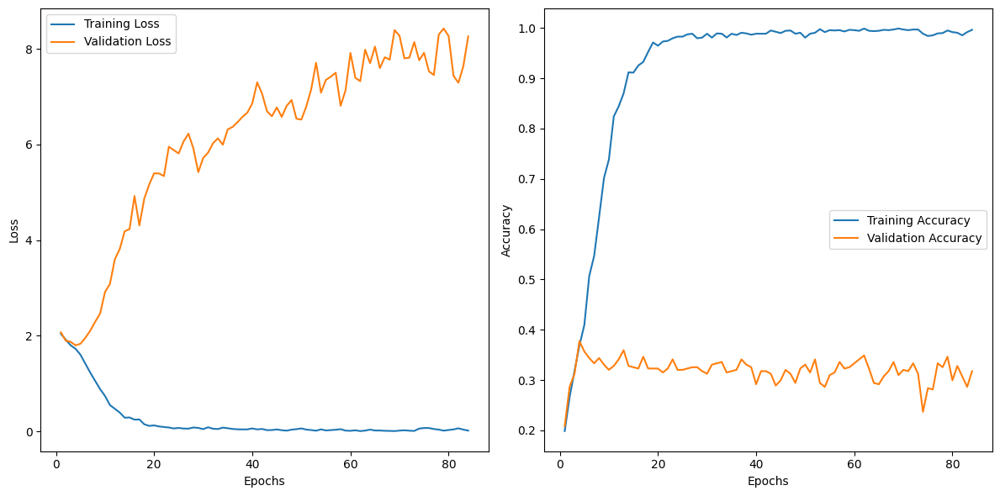

49/49 [==============================] - 6s 117ms/step - loss: 0.0151 - accuracy: 0.9961 - val_loss: 8.2638 - val_accuracy: 0.3177
Epoch 85/100
49/49 [==============================] - ETA: 0s - loss: 0.0146 - accuracy: 0.9961

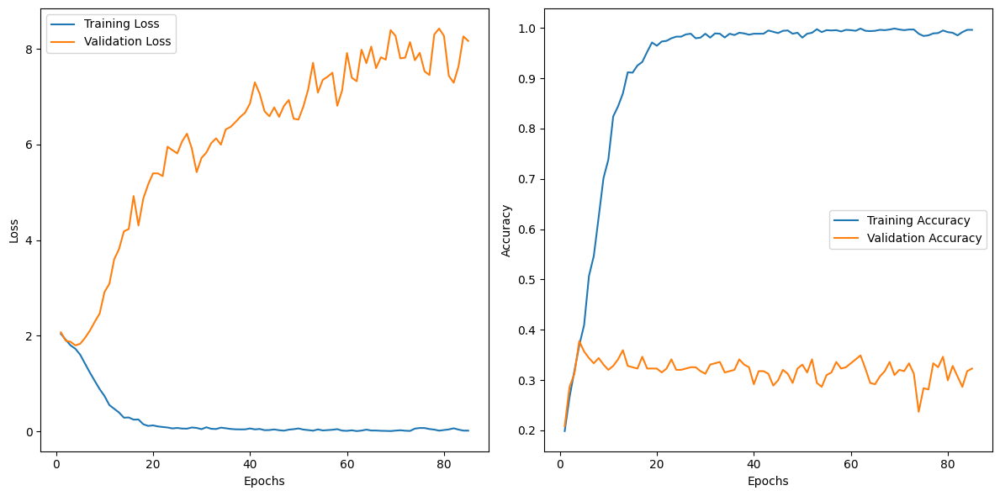

49/49 [==============================] - 6s 120ms/step - loss: 0.0146 - accuracy: 0.9961 - val_loss: 8.1692 - val_accuracy: 0.3229
Epoch 86/100
49/49 [==============================] - ETA: 0s - loss: 0.0264 - accuracy: 0.9916

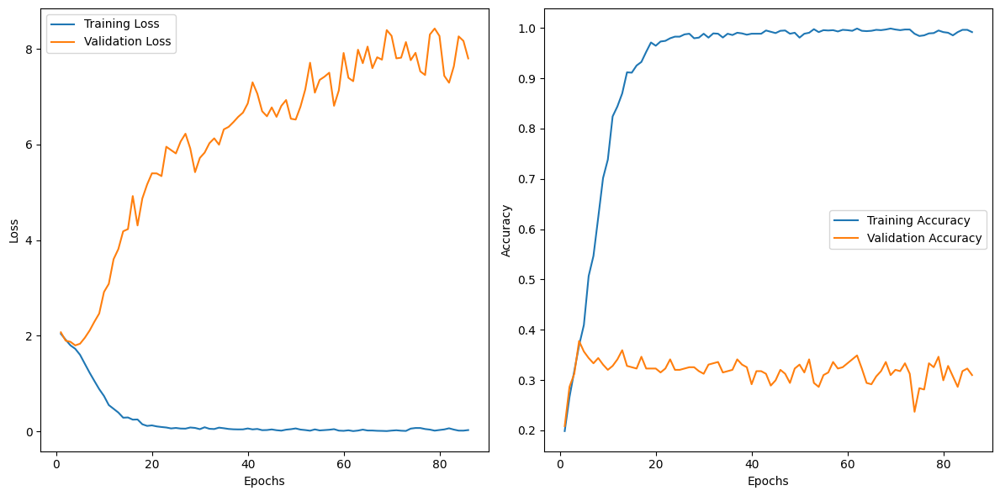

49/49 [==============================] - 6s 124ms/step - loss: 0.0264 - accuracy: 0.9916 - val_loss: 7.8028 - val_accuracy: 0.3099
Epoch 87/100
49/49 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 0.9968

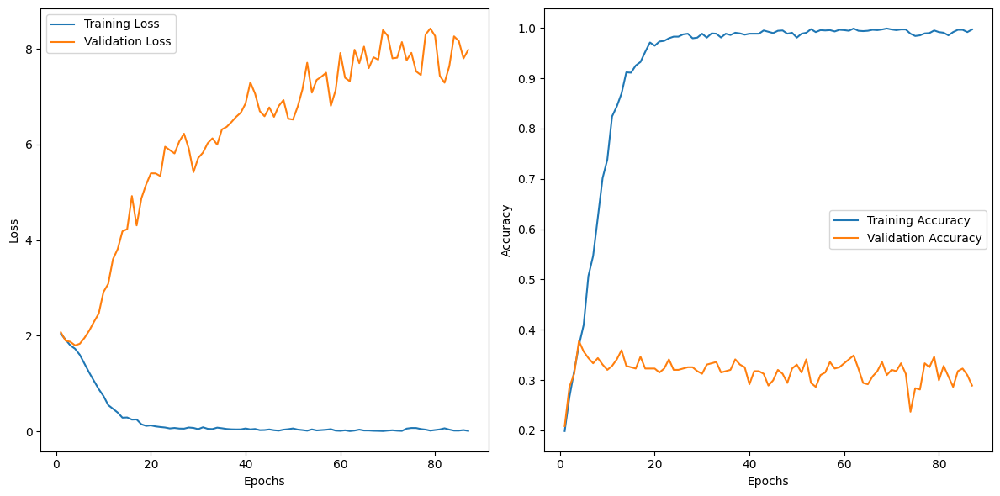

49/49 [==============================] - 5s 108ms/step - loss: 0.0093 - accuracy: 0.9968 - val_loss: 7.9810 - val_accuracy: 0.2891
Epoch 88/100
49/49 [==============================] - ETA: 0s - loss: 0.0180 - accuracy: 0.9974

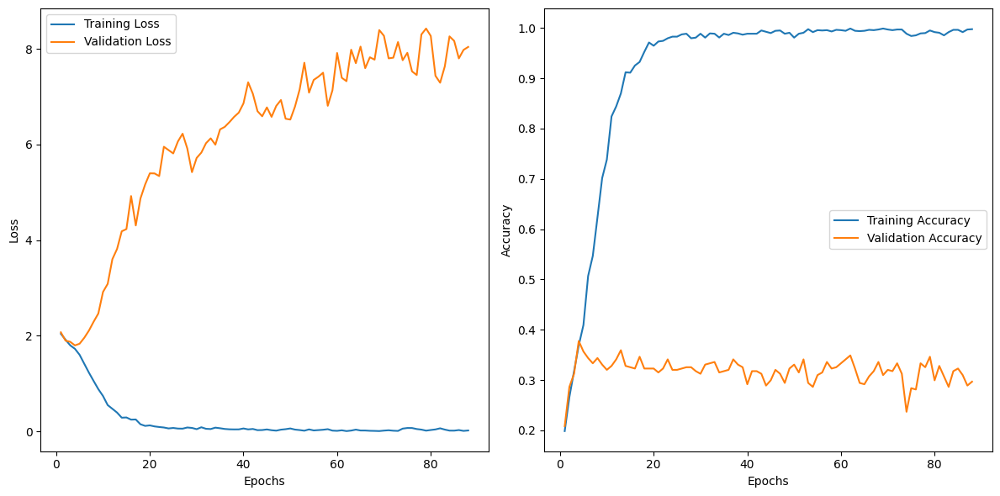

49/49 [==============================] - 5s 103ms/step - loss: 0.0180 - accuracy: 0.9974 - val_loss: 8.0430 - val_accuracy: 0.2969
Epoch 89/100
49/49 [==============================] - ETA: 0s - loss: 0.0095 - accuracy: 0.9981

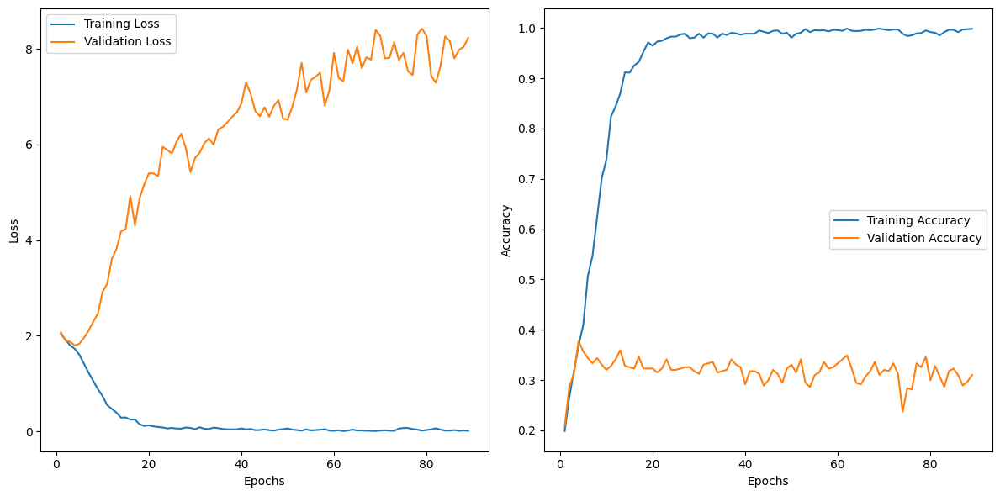

49/49 [==============================] - 5s 106ms/step - loss: 0.0095 - accuracy: 0.9981 - val_loss: 8.2378 - val_accuracy: 0.3099
Epoch 90/100
49/49 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 0.9974

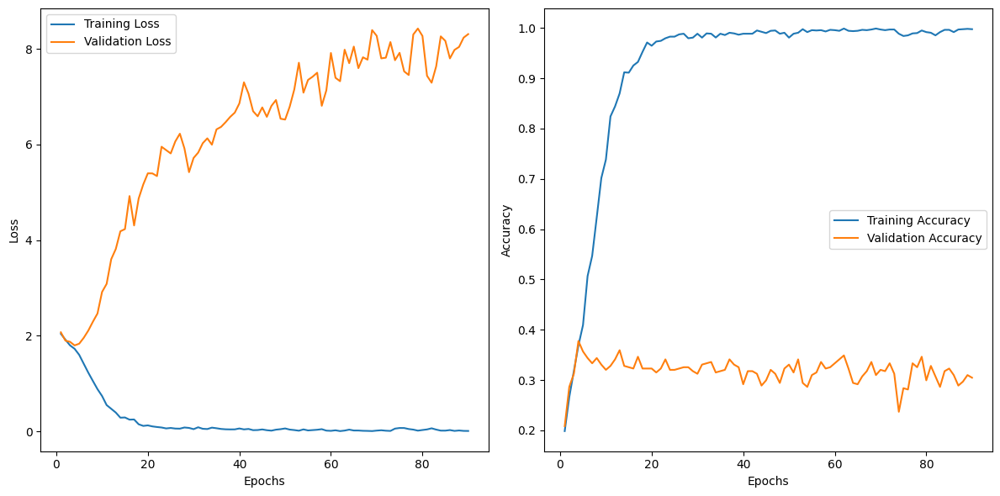

49/49 [==============================] - 5s 105ms/step - loss: 0.0080 - accuracy: 0.9974 - val_loss: 8.3108 - val_accuracy: 0.3047
Epoch 91/100
49/49 [==============================] - ETA: 0s - loss: 0.0126 - accuracy: 0.9974

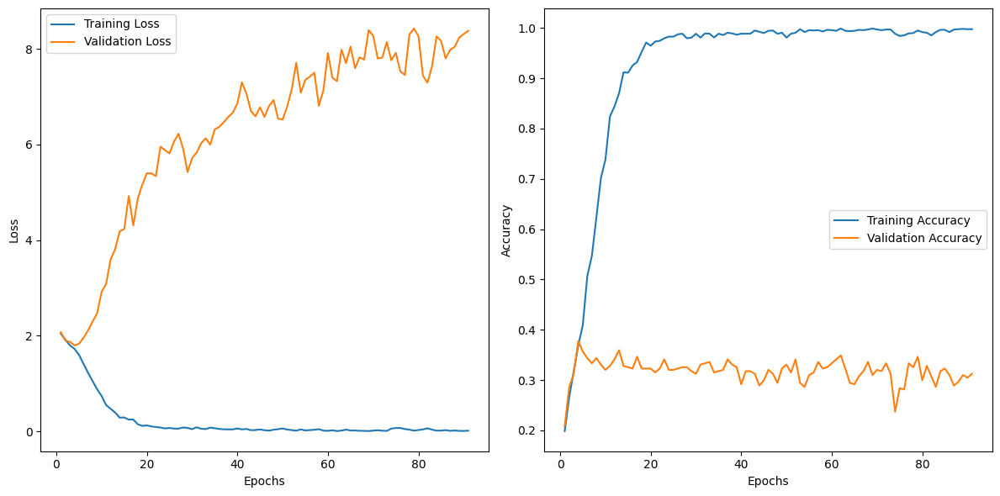

49/49 [==============================] - 5s 99ms/step - loss: 0.0126 - accuracy: 0.9974 - val_loss: 8.3798 - val_accuracy: 0.3125
Epoch 92/100
49/49 [==============================] - ETA: 0s - loss: 0.0104 - accuracy: 0.9955

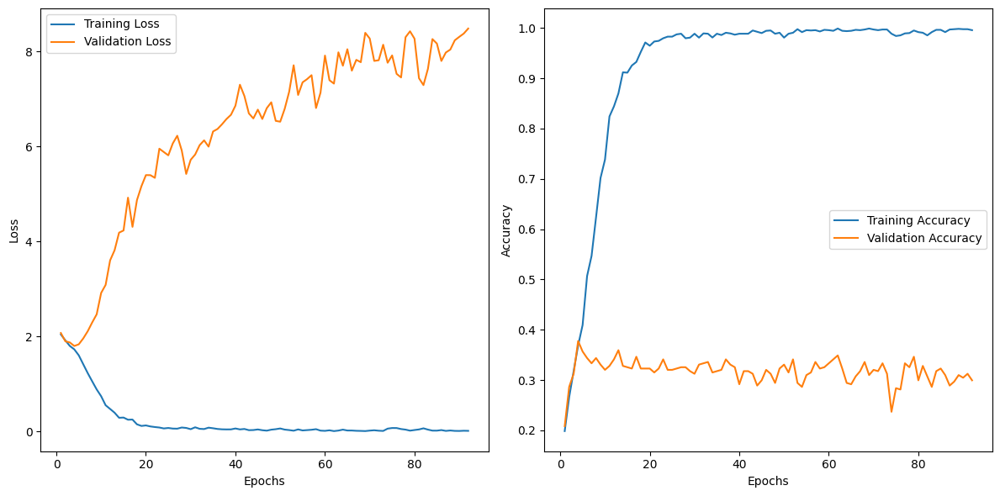

49/49 [==============================] - 5s 109ms/step - loss: 0.0104 - accuracy: 0.9955 - val_loss: 8.4858 - val_accuracy: 0.2995
Epoch 93/100
49/49 [==============================] - ETA: 0s - loss: 0.0118 - accuracy: 0.9955

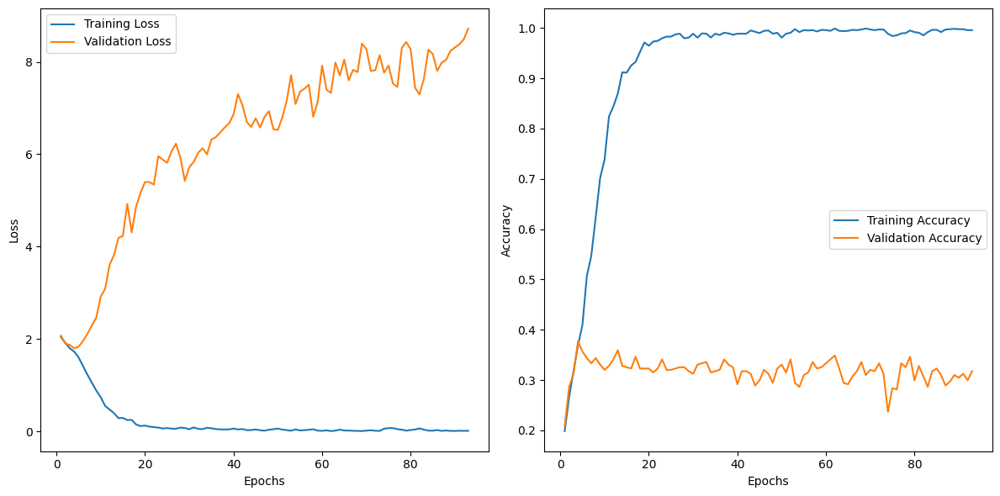

49/49 [==============================] - 6s 112ms/step - loss: 0.0118 - accuracy: 0.9955 - val_loss: 8.7207 - val_accuracy: 0.3177
Epoch 94/100
49/49 [==============================] - ETA: 0s - loss: 0.0197 - accuracy: 0.9955

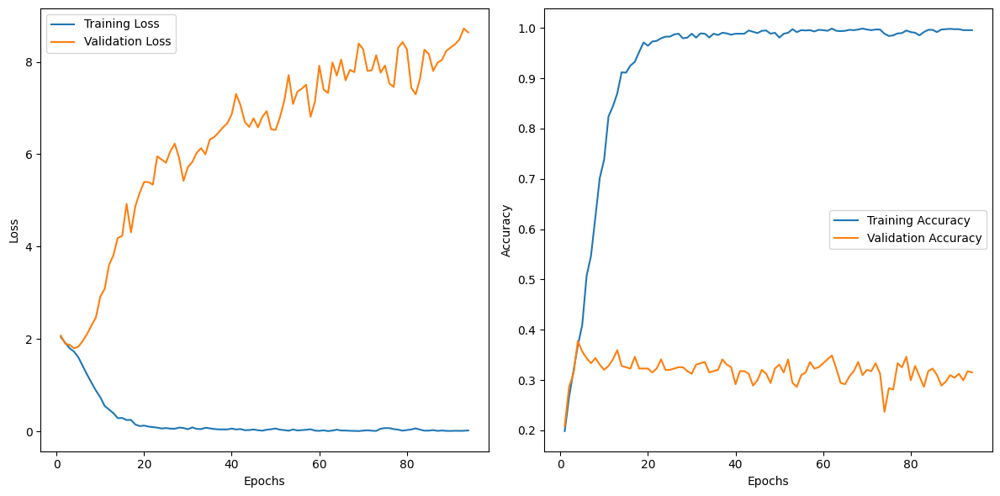

49/49 [==============================] - 5s 109ms/step - loss: 0.0197 - accuracy: 0.9955 - val_loss: 8.6381 - val_accuracy: 0.3151
Epoch 95/100
49/49 [==============================] - ETA: 0s - loss: 0.0540 - accuracy: 0.9929

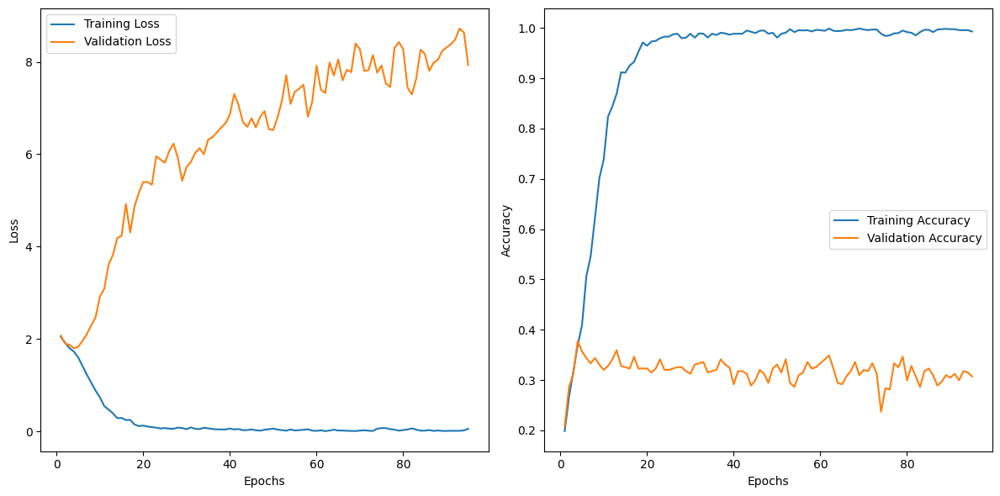

49/49 [==============================] - 6s 119ms/step - loss: 0.0540 - accuracy: 0.9929 - val_loss: 7.9283 - val_accuracy: 0.3073
Epoch 96/100
49/49 [==============================] - ETA: 0s - loss: 0.0155 - accuracy: 0.9948

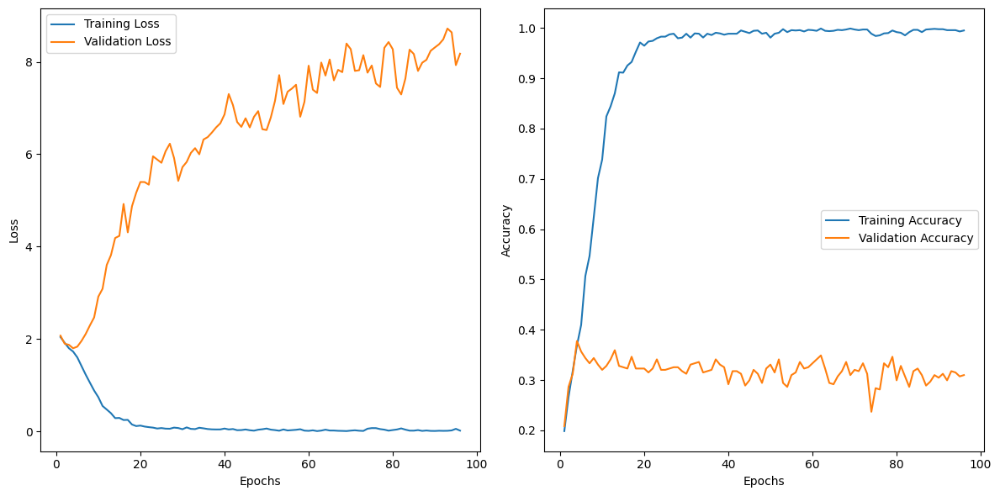

49/49 [==============================] - 6s 118ms/step - loss: 0.0155 - accuracy: 0.9948 - val_loss: 8.1770 - val_accuracy: 0.3099
Epoch 97/100
49/49 [==============================] - ETA: 0s - loss: 0.0276 - accuracy: 0.9948

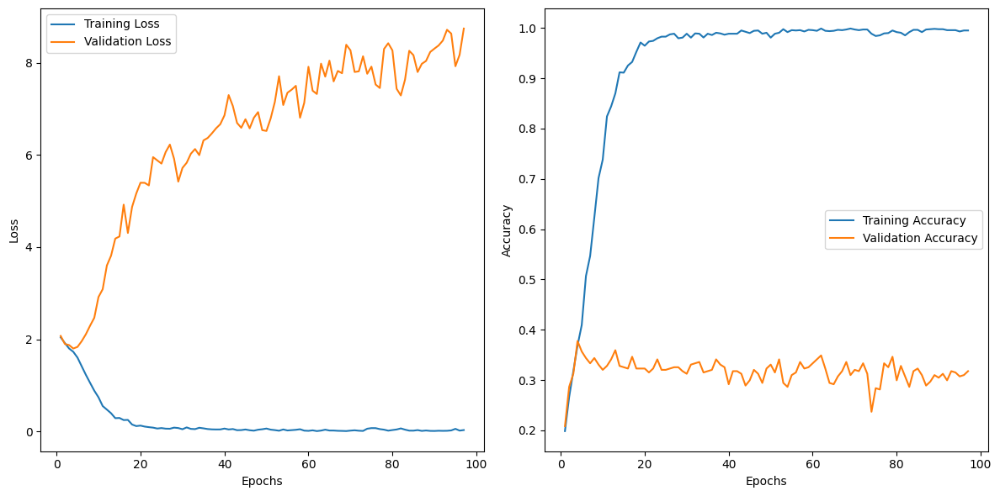

49/49 [==============================] - 6s 113ms/step - loss: 0.0276 - accuracy: 0.9948 - val_loss: 8.7472 - val_accuracy: 0.3177
Epoch 98/100
49/49 [==============================] - ETA: 0s - loss: 0.0245 - accuracy: 0.9948

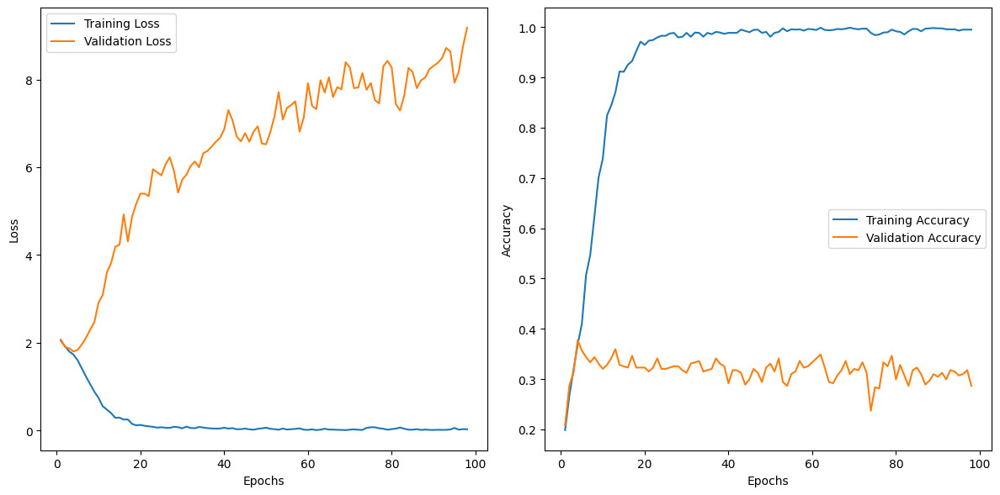

49/49 [==============================] - 5s 108ms/step - loss: 0.0245 - accuracy: 0.9948 - val_loss: 9.1821 - val_accuracy: 0.2865
Epoch 99/100
49/49 [==============================] - ETA: 0s - loss: 0.0177 - accuracy: 0.9948

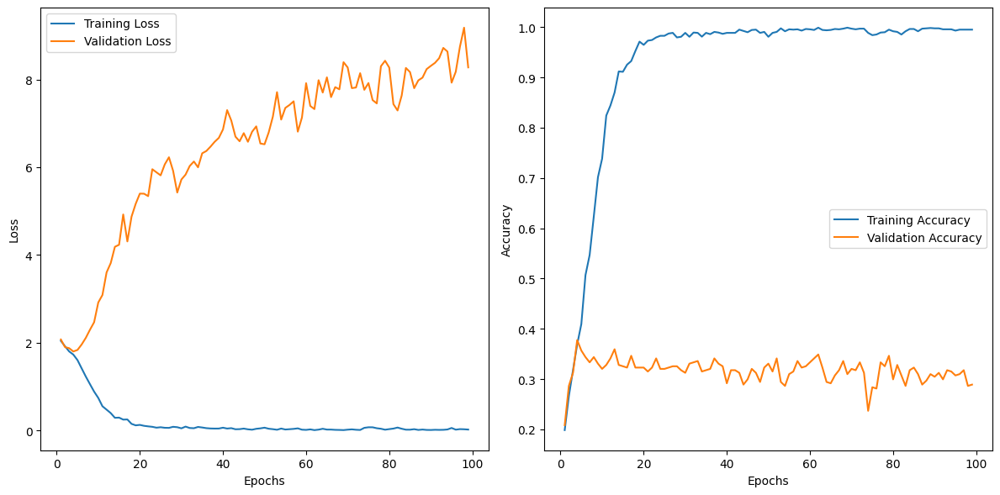

49/49 [==============================] - 6s 112ms/step - loss: 0.0177 - accuracy: 0.9948 - val_loss: 8.2766 - val_accuracy: 0.2891
Epoch 100/100
49/49 [==============================] - ETA: 0s - loss: 0.0130 - accuracy: 0.9955

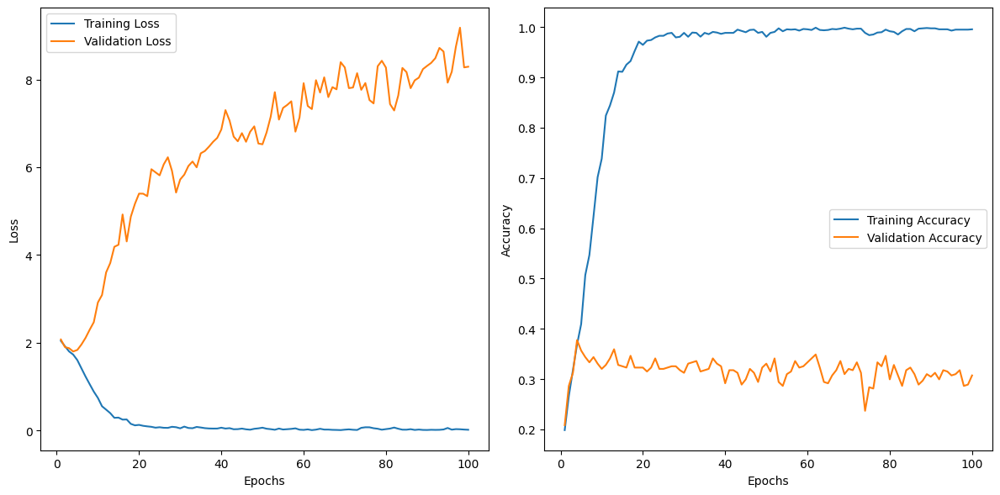

49/49 [==============================] - 5s 106ms/step - loss: 0.0130 - accuracy: 0.9955 - val_loss: 8.2923 - val_accuracy: 0.3073


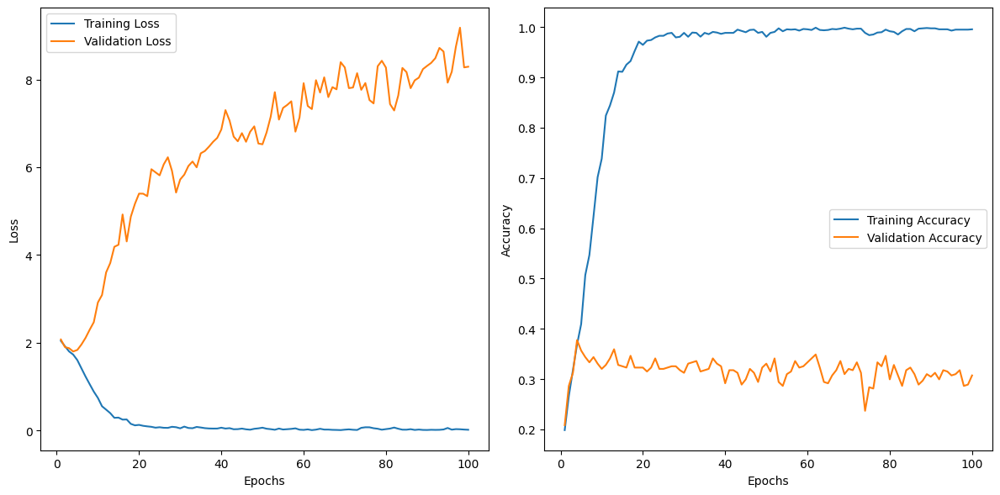

In [24]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define input shape
input_shape = (120, 120, 3)

# Create the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='softmax')  # Assuming 200 classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    'D:/Skin Disease/train',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'D:/Skin Disease/test',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

# Define callbacks for plotting graphs
class PlotLossAccuracy(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.accs = []
        self.val_losses = []
        self.val_accs = []

    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))
        self.accs.append(logs.get('accuracy'))
        self.val_losses.append(logs.get('val_loss'))
        self.val_accs.append(logs.get('val_accuracy'))

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, len(self.losses) + 1), self.losses, label='Training Loss')
        plt.plot(range(1, len(self.val_losses) + 1), self.val_losses, label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(range(1, len(self.accs) + 1), self.accs, label='Training Accuracy')
        plt.plot(range(1, len(self.val_accs) + 1), self.val_accs, label='Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // 32,
    epochs=100,
    validation_data=test_generator,
    validation_steps=test_generator.samples // 32,
    callbacks=[PlotLossAccuracy()]
)

# Plot the final graphs
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(history.history['loss']) + 1), history.history['loss'], label='Training Loss')
plt.plot(range(1, len(history.history['val_loss']) + 1), history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], label='Training Accuracy')
plt.plot(range(1, len(history.history['val_accuracy']) + 1), history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [31]:
import os
import shutil
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.models import load_model

# Load the model
model = load_model('my_model.h5')

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generators = train_datagen.flow_from_directory(
    'D:/Skin Disease/train',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

test_generators = test_datagen.flow_from_directory(
    'D:/Skin Disease/test',
    target_size=(120, 120),
    batch_size=32,
    class_mode='categorical'
)

# Define the directory for the new test dataset
new_test_dir = 'D:/Skin Disease/new_test1'
os.makedirs(new_test_dir, exist_ok=True)

# Iterate over the test dataset to get predictions
for i in range(len(test_generator)):
    images, labels = test_generator[i]
    preds = model.predict(images)
    predicted_classes = np.argmax(preds, axis=1)
    
    for j in range(len(labels)):
        true_class = np.argmax(labels[j])
        pred_class = predicted_classes[j]
        
        if true_class == pred_class:
            # Get the class name
            class_name = class_labels[true_class]
            class_dir = os.path.join(new_test_dir, class_name)
            os.makedirs(class_dir, exist_ok=True)

            # Get the image
            image = images[j] * 255  # Denormalize the image
            image_path = os.path.join(class_dir, f"image_{i}_{j}.jpg")
            image = image.astype(np.uint8)
            image = Image.fromarray(image)
            image.save(image_path)

            print(f"Saved image with true label {class_name} and predicted label {class_name} to {image_path}")

print("Test dataset created.")


Found 1583 images belonging to 8 classes.
Found 396 images belonging to 8 classes.
1/1 [==============================] - 0s 311ms/step
Saved image with true label Vascular Tumors and predicted label Vascular Tumors to D:/Skin Disease/new_test1\Vascular Tumors\image_0_0.jpg
Saved image with true label Vasculitis Photos and predicted label Vasculitis Photos to D:/Skin Disease/new_test1\Vasculitis Photos\image_0_1.jpg
Saved image with true label Exanthems and Drug Eruptions and predicted label Exanthems and Drug Eruptions to D:/Skin Disease/new_test1\Exanthems and Drug Eruptions\image_0_2.jpg
Saved image with true label Vasculitis Photos and predicted label Vasculitis Photos to D:/Skin Disease/new_test1\Vasculitis Photos\image_0_3.jpg
Saved image with true label Scabies Lyme Disease and other Infestations and Bites and predicted label Scabies Lyme Disease and other Infestations and Bites to D:/Skin Disease/new_test1\Scabies Lyme Disease and other Infestations and Bites\image_0_4.jpg
Save